<a href="https://colab.research.google.com/github/FredLongo/MLDL_Project/blob/main/XOM_TeamProject_V04.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Review with Video https://www.youtube.com/watch?v=hpfQE0bTeA4

#Code Section

In [5]:
#pip install pandas_ta

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import yfinance as yf
import pandas_ta as ta
from sklearn.preprocessing import MinMaxScaler
import warnings
from datetime import datetime, timedelta

"""#Now build the model"""

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import TimeDistributed

import tensorflow as tf
import keras
from keras import optimizers
from keras.callbacks import History
from keras.models import Model
from keras.layers import Dense, Dropout, LSTM, Input, Activation, concatenate

""" performance evaluation """
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math

pd.set_option('display.max_columns', None)




In [7]:
class MyLSTMModel:
    def __init__(self, indicators='^DJI',
                 ticker='ADM',
                 frame_days=10,
                 lstm_layers = 150,
                 start_date = '2012-03-11',
                 end_date='2022-07-10',
                 batch_size=15,
                 epochs=30,
                 run = False,
                 run_all=False,
                 verbose=1,
                 name=''):
        #Parameters
        self.name           = name
        self.indicators     = indicators
        self.ticker         = ticker
        self.run            = run
        self.run_all        = run_all
        #Data Setup
        self.start_date     = start_date
        self.end_date       = end_date
        self.frame_days     = frame_days
        self.ticker_list    = indicators + ',' +ticker
        self.ticker_list_ct  = len(self.ticker_list.split(','))
        self.tickers        = self.ticker_list.split(',')
        self.data = pd.DataFrame()
        #Model Setup
        self.model          = None
        self.lstm_layers    = lstm_layers
        self.batch_size     = batch_size
        self.epochs         = epochs
        self.verbose        = verbose
        #Report
        self.pred_diff    = np.array([])
        self.pred_diff_bias  = np.array([])
        self.pred_correctness = np.array([])
        self.pred_correctness_mean = np.array([])
        self.history = np.array([])
        self.fitting_elapse_time = None
        #Misc
        self.data_set = pd.DataFrame()
        self.data_set_scaled = np.array([])
        self.X        = np.array([])              # X[Column][Sample][Frame_day]
        self.X_train  = np.array([])
        self.X_test   = np.array([])
        self.y_train  = np.array([])
        self.y_test   = np.array([])
        self.y_pred   = np.array([])

        if self.name == '':
          self.name = ticker + '_F' + str(frame_days) + '_L' + str(lstm_layers)

        if self.run or self.run_all:
          self.Run()



    def Data__LoadAndPrep(self):
        #Download Data from Yahoo Finance
        self.data = yf.download(tickers=self.tickers, start=self.start_date, end=self.end_date)

        # Add all additional indicators
        for (_type, _ticker) in self.data.columns:
          if _type == 'Close':
            rsi_values = ta.rsi(self.data[(_type, _ticker)], length=15)
            self.data[('RSI', _ticker)] = rsi_values
            emaf_values = ta.rsi(self.data[(_type, _ticker)], length=20)
            self.data[('EMAF', _ticker)] = rsi_values
            emam_values = ta.rsi(self.data[(_type, _ticker)], length=100)
            self.data[('EMAM', _ticker)] = rsi_values
            emas_values = ta.rsi(self.data[(_type, _ticker)], length=150)
            self.data[('EMAS', _ticker)] = rsi_values

        # Add the Training an validation column info.
        self.data[('Target',self.ticker)] = self.data['Adj Close',self.ticker]-self.data['Open',self.ticker]                                # 1) Diff of current open and future close
        self.data[('Target',self.ticker)] = self.data['Target',self.ticker].shift(-1)                                                       #
        self.data[('TargetClass',self.ticker)] = [1 if self.data[('Target',self.ticker)][i]>0 else 0 for i in range(len(self.data))]        # 2) Classificaton approche 1= up 0 = down.
        self.data[('TargetNextClose',self.ticker)] = self.data[('Adj Close',self.ticker)].shift(-1)                                         # 3) Closing Price of the next day

        #Remove unused columns
        self.data.dropna(inplace=True)                                                       # Dropping values not their
        self.data.reset_index(inplace = True)                                                # rebuild index after removed values

        with warnings.catch_warnings():
          warnings.simplefilter("ignore", category=pd.errors.PerformanceWarning)
          self.data.drop([('Close', self.ticker)], axis=1, inplace=True)                       # Removing because we are going with Adjuested Close
          self.data.drop(['Date'], axis=1, inplace=True)                                       # Removing unsued Columns  (R1)


    def Data_Set__LoadAndPrep(self):
        self.data_set = self.data.iloc[:,0:len(self.data.columns)]#.values
        # Scale the dataset
        sc = MinMaxScaler(feature_range=(0,1))             # Apply Scaler to oour data to make it between 0 and `
        self.data_set_scaled = sc.fit_transform(self.data_set)


    def Data_Prep_Input(self):
        # Create frame of given candles
        self.X = []

        for j in range(len(self.data_set.columns) -1):#data_set_scaled[0].size):#2 columns are target not X         # Removing some of the columns  Adding volume
            self.X.append([])
            for i in range(self.frame_days, self.data_set_scaled.shape[0]):#framedays+2
                self.X[j].append(self.data_set_scaled[i-self.frame_days:i, j])

        #Swith Order, move axis from 0 to last position 2                               # Moves  X[Column][Sample][Frame_day]
                                                                                        #   to   X[Sample][Frame_day][Column]
        self.X = np.moveaxis( self.X, [0], [2])


        # Choose -1 for last column, classification else -2...
        self.X, yi =np.array(self.X), np.array(self.data_set_scaled[self.frame_days:,-1])
        y=np.reshape(yi,(len(yi),1))

        # split data into train test sets
        splitlimit = int(len(self.X)*0.8)          #point to slit at
        self.X_train, self.X_test = self.X[:splitlimit], self.X[splitlimit:]
        self.y_train, self.y_test = y[:splitlimit], y[splitlimit:]

        ############################################################
        ##   Build Model
        ############################################################
    def Build_Model(self):
        lstm_input = Input(shape=(self.frame_days, len(self.X[0][0])), name='lstm_input')      # Input layer
        inputs = LSTM(self.lstm_layers, name='first_layer')(lstm_input)                        # Long Short Term memory with lstm_layers # of layers
        inputs = Dense(1, name='dense_layer')(inputs)                                          # One Dense Layer
        output = Activation('linear', name='output')(inputs)                                   # Output layer
        self.model = Model(inputs=lstm_input, outputs=output)                                  # declare model
        adam = optimizers.Adam()                                                               # instanciate optimizer
        #self.model.compile(optimizer=adam, loss='mse', metrics=['accuracy'])                  # Compile model
        #self.model.compile(optimizer=adam, loss='binary_crossentropy', metrics=['mse'])         # Compile model
        self.model.compile(optimizer=adam, loss='mse', metrics=['mae'])         # Compile model

    def Fit(self):
        start_time = datetime.now()
        print(f'___________{self.name}___________')
        self.history = self.model.fit(x=self.X_train,
                       y=self.y_train,
                       batch_size=self.batch_size,
                       epochs=self.epochs, #TODO Set back to 30
                       shuffle=True,
                       validation_data=(self.X_test, self.y_test),
                       verbose=self.verbose)
                       #validation_split = 0.1)
        end_time = datetime.now()
        self.fitting_elapse_time = end_time - start_time


    def Predict(self):
      self.y_pred = self.model.predict(self.X_test)

        ############################################################
        ### Evaluation and reports
        ############################################################
    def check_sign(self,number):
        if number > 0:
            return 1
        elif number < 0:
            return -1
        else:
            return 0


     # X_test = Open,	High,	Low,	Adj Close,	Volume,	RSI	EMAF,	EMAM,	EMAS,

    def Get_diffs(self):
        _size = self.y_test.shape[0]
        self.pred_correctness   = np.zeros(_size)
        self.pred_diff          = np.zeros(_size)
        self.pred_diff_bias      = np.zeros(_size)

        for i in range(_size):                                 # X[Sample][Frame_day][column]
          Opening    =  self.X_test[i][0][(self.ticker_list_ct * 4) -1]                        # Opening column for ticker is always (ticker_count * 4 -1)
          Actual     =  self.y_test[i]
          Predicted  =  self.y_pred[i]
          with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=DeprecationWarning)
            self.pred_diff[i]    = Predicted/Actual
            self.pred_diff_bias[i]  = 1 - (Predicted/Actual)
            if self.check_sign(Opening - Actual) == self.check_sign(Opening - Predicted):
              self.pred_correctness[i] = True;                                  #It predicted Correct!
            else: self.pred_correctness[i] = False;                             #It did predict correctly


                #Mean Squre Error
        self.mean_sqr_err =  mean_squared_error(self.y_test, self.y_pred)

        # Mean absolute Error
        self.mean_abs_err = mean_absolute_error(self.y_test, self.y_pred)

        self.pred_correctness_mean = self.pred_correctness.mean()
        self.pred_diff_mean = self.pred_diff.mean()
        self.pred_diff_bias_mean  = self.pred_diff_bias.mean()

         # R^2    = ?????


    def View_Performance_Report(self,show_graphs=True, show_report=True , graphs=[]):


        # Root Mean Squred Error.
        self.root_mean_sqr_err = math.sqrt(self.mean_sqr_err)
        print("############################################################################")
        print("  Model Setup:")
        print(f"                    Name: {self.name}")
        print(f"             LSTM_Layers: {self.lstm_layers}")
        print(f"               Bach_Size: {self.batch_size}")
        print(f"                  Epochs: {self.epochs}")
        print("  Data Setup:")
        print(f"                  Ticker: {self.ticker}")
        print(f"             Indicattors: {self.indicators}")
        print(f"              Start_Date: {self.start_date}")
        print(f"                End_Date: {self.end_date}")
        print(f"              Frame_Days: {self.frame_days}")
        print("  Result Data:")
        print(f'             mean_abs_err ={self.mean_abs_err}')
        print(f'             mean_sqr_err ={self.mean_sqr_err}')
        print(f'        root_mean_sqr_err ={self.root_mean_sqr_err}')
        print(f'           pred_diff_mean ={self.pred_diff_mean}')
        print(f'      pred_diff_bias_mean ={self.pred_diff_bias_mean}')
        print(f'    pred_correctness_mean ={self.pred_correctness_mean}')
        print("")

        #Plot Graph



        if  ('Eval_Loss' in graphs) or (show_graphs == True) :  # ('Pie' in show_graphs:)

          plt.figure(figsize=(12, 6))
          plt.subplot(1, 2, 1)
          plt.plot(self.history.history['mae'])
          plt.plot(self.history.history['val_mae'])
          plt.title('Evaluation Metric - Mean Absolute Error (MAE)')
          plt.ylabel('MAE')
          plt.xlabel('Epoch')
          plt.legend(['Train', 'Validation'], loc='upper left')


          # Plot training & validation loss values
          plt.subplot(1, 2, 2)
          plt.plot(self.history.history['loss'])
          plt.plot(self.history.history['val_loss'])
          plt.title('Model Loss - Mean Sqr Error (MSE) ')
          plt.ylabel('Loss')
          plt.xlabel('Epoch')
          plt.legend(['Train', 'Validation'], loc='upper left')
          plt.show()

        if  ('TrainingMAE' in graphs) or (show_graphs == True) :
          #####Break Down
          plt.figure(figsize=(12, 6))

          #plt.subplot(1, 1, 1)
          plt.plot(self.history.history['mae'])
          plt.title('Training Mean Absolute Error')
          plt.ylabel('MAE')
          plt.xlabel('Epoch')
          plt.legend(['Train'], loc='upper left')
          plt.show()


        if  ('ActVsPed_Line' in graphs) or (show_graphs == True) :  # ('Pie' in show_graphs:)
          # Actual vs Predicted Chart
          plt.figure(figsize=(16,8))
          plt.title('Actual Vs Prediction Results')
          plt.plot(self.y_test, color = 'black', label = 'Test')
          plt.plot(self.y_pred, color = 'green', label = 'pred')
          plt.legend()
          plt.show()

        if  ('ActVsPed_Pie' in graphs) or (show_graphs == True) :  # ('Pie' in show_graphs:)
          # Pie Chart
          values = [self.pred_correctness_mean, 1 - self.pred_correctness_mean ]
          labels = [f'Correctly Predicted {self.pred_correctness_mean:.2f}%', f'Incorect{1 - self.pred_correctness_mean:.2f}%']
          colors = ['g','r']
          explode = [0.1, 0]
          plt.title(f'Correct Prediction " {self.pred_correctness_mean:.2f}%  "of the time')
          plt.pie(values, labels=labels, colors=colors, explode=explode)
          plt.show




    def Run(self):
      self.Data__LoadAndPrep()
      self.Data_Set__LoadAndPrep()
      self.Data_Prep_Input()
      self.Build_Model()
      self.Fit()
      self.Predict()
      self.Get_diffs()
      if self.run_all == True:
        self.View_Performance_Report()









# Model Fit Section

# Model Training

In [8]:
Indicators    = '^DJI,^BSESN,^BVSP'
#Ticker = ['ADM','MSI','XOM']
Ticker = ['XOM']
frame_days = [10,20,30,40,50,70,80,100]
LSTM_layers = [30,50,150,250,350]

#Ticker = ['ADM']
#frame_days = [10,30,50]
#LSTM_layers = [50]


model_list = []

for t in Ticker:
  for f in frame_days:
    for l in LSTM_layers:
      new_model = MyLSTMModel(indicators= Indicators, ticker=t,frame_days=f,lstm_layers=l,run=True)
      model_list.append(new_model)



[*********************100%%**********************]  4 of 4 completed


___________XOM_F10_L30___________
Epoch 1/30
122/122 [==============================] - 4s 11ms/step - loss: 0.0165 - mae: 0.0758 - val_loss: 0.0475 - val_mae: 0.1584
Epoch 2/30
122/122 [==============================] - 1s 8ms/step - loss: 9.8020e-04 - mae: 0.0253 - val_loss: 0.0343 - val_mae: 0.1318
Epoch 3/30
122/122 [==============================] - 1s 10ms/step - loss: 6.7401e-04 - mae: 0.0207 - val_loss: 0.0269 - val_mae: 0.1129
Epoch 4/30
122/122 [==============================] - 1s 11ms/step - loss: 5.2049e-04 - mae: 0.0180 - val_loss: 0.0276 - val_mae: 0.1184
Epoch 5/30
122/122 [==============================] - 1s 11ms/step - loss: 4.7623e-04 - mae: 0.0173 - val_loss: 0.0312 - val_mae: 0.1311
Epoch 6/30
122/122 [==============================] - 1s 10ms/step - loss: 4.5073e-04 - mae: 0.0166 - val_loss: 0.0260 - val_mae: 0.1169
Epoch 7/30
122/122 [==============================] - 1s 7ms/step - loss: 4.1510e-04 - mae: 0.0160 - val_loss: 0.0242 - val_mae: 0.1141
Epoch 8/30
12

[*********************100%%**********************]  4 of 4 completed


___________XOM_F10_L50___________
Epoch 1/30
122/122 [==============================] - 5s 19ms/step - loss: 0.0138 - mae: 0.0695 - val_loss: 0.0354 - val_mae: 0.1428
Epoch 2/30
122/122 [==============================] - 1s 11ms/step - loss: 8.5652e-04 - mae: 0.0223 - val_loss: 0.0242 - val_mae: 0.1099
Epoch 3/30
122/122 [==============================] - 1s 8ms/step - loss: 5.0380e-04 - mae: 0.0174 - val_loss: 0.0222 - val_mae: 0.1035
Epoch 4/30
122/122 [==============================] - 1s 8ms/step - loss: 4.7788e-04 - mae: 0.0170 - val_loss: 0.0201 - val_mae: 0.0986
Epoch 5/30
122/122 [==============================] - 1s 9ms/step - loss: 4.9426e-04 - mae: 0.0174 - val_loss: 0.0181 - val_mae: 0.0941
Epoch 6/30
122/122 [==============================] - 1s 8ms/step - loss: 4.3372e-04 - mae: 0.0164 - val_loss: 0.0186 - val_mae: 0.0947
Epoch 7/30
122/122 [==============================] - 1s 9ms/step - loss: 4.0802e-04 - mae: 0.0158 - val_loss: 0.0166 - val_mae: 0.0891
Epoch 8/30
122/1

[*********************100%%**********************]  4 of 4 completed


___________XOM_F10_L150___________
Epoch 1/30
122/122 [==============================] - 5s 21ms/step - loss: 0.0060 - mae: 0.0426 - val_loss: 0.0131 - val_mae: 0.0822
Epoch 2/30
122/122 [==============================] - 2s 18ms/step - loss: 5.8291e-04 - mae: 0.0187 - val_loss: 0.0122 - val_mae: 0.0801
Epoch 3/30
122/122 [==============================] - 3s 26ms/step - loss: 4.7687e-04 - mae: 0.0168 - val_loss: 0.0119 - val_mae: 0.0780
Epoch 4/30
122/122 [==============================] - 2s 20ms/step - loss: 4.0834e-04 - mae: 0.0156 - val_loss: 0.0162 - val_mae: 0.0968
Epoch 5/30
122/122 [==============================] - 2s 15ms/step - loss: 3.8669e-04 - mae: 0.0150 - val_loss: 0.0150 - val_mae: 0.0942
Epoch 6/30
122/122 [==============================] - 2s 17ms/step - loss: 4.6655e-04 - mae: 0.0170 - val_loss: 0.0164 - val_mae: 0.1042
Epoch 7/30
122/122 [==============================] - 2s 17ms/step - loss: 4.0004e-04 - mae: 0.0156 - val_loss: 0.0203 - val_mae: 0.1163
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F10_L250___________
Epoch 1/30
122/122 [==============================] - 5s 28ms/step - loss: 0.0125 - mae: 0.0562 - val_loss: 0.0108 - val_mae: 0.0755
Epoch 2/30
122/122 [==============================] - 3s 27ms/step - loss: 4.9993e-04 - mae: 0.0171 - val_loss: 0.0096 - val_mae: 0.0661
Epoch 3/30
122/122 [==============================] - 5s 43ms/step - loss: 4.8444e-04 - mae: 0.0170 - val_loss: 0.0089 - val_mae: 0.0636
Epoch 4/30
122/122 [==============================] - 4s 32ms/step - loss: 4.2935e-04 - mae: 0.0160 - val_loss: 0.0082 - val_mae: 0.0624
Epoch 5/30
122/122 [==============================] - 3s 23ms/step - loss: 3.8668e-04 - mae: 0.0150 - val_loss: 0.0099 - val_mae: 0.0688
Epoch 6/30
122/122 [==============================] - 4s 30ms/step - loss: 3.8604e-04 - mae: 0.0151 - val_loss: 0.0079 - val_mae: 0.0628
Epoch 7/30
122/122 [==============================] - 4s 34ms/step - loss: 3.5445e-04 - mae: 0.0146 - val_loss: 0.0086 - val_mae: 0.0656
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F10_L350___________
Epoch 1/30
122/122 [==============================] - 10s 60ms/step - loss: 0.0191 - mae: 0.0670 - val_loss: 0.0140 - val_mae: 0.0898
Epoch 2/30
122/122 [==============================] - 5s 39ms/step - loss: 5.6001e-04 - mae: 0.0180 - val_loss: 0.0103 - val_mae: 0.0686
Epoch 3/30
122/122 [==============================] - 7s 56ms/step - loss: 5.0848e-04 - mae: 0.0175 - val_loss: 0.0104 - val_mae: 0.0691
Epoch 4/30
122/122 [==============================] - 5s 38ms/step - loss: 4.2943e-04 - mae: 0.0160 - val_loss: 0.0105 - val_mae: 0.0683
Epoch 5/30
122/122 [==============================] - 5s 40ms/step - loss: 4.3853e-04 - mae: 0.0162 - val_loss: 0.0085 - val_mae: 0.0620
Epoch 6/30
122/122 [==============================] - 7s 59ms/step - loss: 4.2911e-04 - mae: 0.0159 - val_loss: 0.0087 - val_mae: 0.0626
Epoch 7/30
122/122 [==============================] - 4s 37ms/step - loss: 3.7477e-04 - mae: 0.0149 - val_loss: 0.0110 - val_mae: 0.0737
Epoch 8/3

[*********************100%%**********************]  4 of 4 completed


___________XOM_F20_L30___________
Epoch 1/30
122/122 [==============================] - 4s 16ms/step - loss: 0.0067 - mae: 0.0486 - val_loss: 0.0288 - val_mae: 0.1224
Epoch 2/30
122/122 [==============================] - 1s 12ms/step - loss: 7.5997e-04 - mae: 0.0218 - val_loss: 0.0219 - val_mae: 0.1057
Epoch 3/30
122/122 [==============================] - 1s 12ms/step - loss: 6.0993e-04 - mae: 0.0196 - val_loss: 0.0199 - val_mae: 0.0994
Epoch 4/30
122/122 [==============================] - 2s 15ms/step - loss: 5.6201e-04 - mae: 0.0187 - val_loss: 0.0168 - val_mae: 0.0907
Epoch 5/30
122/122 [==============================] - 2s 16ms/step - loss: 5.1028e-04 - mae: 0.0177 - val_loss: 0.0176 - val_mae: 0.0926
Epoch 6/30
122/122 [==============================] - 2s 17ms/step - loss: 3.9134e-04 - mae: 0.0156 - val_loss: 0.0178 - val_mae: 0.0946
Epoch 7/30
122/122 [==============================] - 1s 11ms/step - loss: 4.1547e-04 - mae: 0.0159 - val_loss: 0.0165 - val_mae: 0.0901
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F20_L50___________
Epoch 1/30
122/122 [==============================] - 5s 21ms/step - loss: 0.0076 - mae: 0.0505 - val_loss: 0.0218 - val_mae: 0.1071
Epoch 2/30
122/122 [==============================] - 2s 20ms/step - loss: 7.3809e-04 - mae: 0.0210 - val_loss: 0.0172 - val_mae: 0.0938
Epoch 3/30
122/122 [==============================] - 2s 12ms/step - loss: 5.2936e-04 - mae: 0.0180 - val_loss: 0.0143 - val_mae: 0.0846
Epoch 4/30
122/122 [==============================] - 1s 12ms/step - loss: 4.3777e-04 - mae: 0.0164 - val_loss: 0.0132 - val_mae: 0.0824
Epoch 5/30
122/122 [==============================] - 2s 13ms/step - loss: 4.8971e-04 - mae: 0.0175 - val_loss: 0.0161 - val_mae: 0.0911
Epoch 6/30
122/122 [==============================] - 2s 13ms/step - loss: 4.0997e-04 - mae: 0.0157 - val_loss: 0.0159 - val_mae: 0.0929
Epoch 7/30
122/122 [==============================] - 2s 12ms/step - loss: 3.8038e-04 - mae: 0.0151 - val_loss: 0.0143 - val_mae: 0.0878
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F20_L150___________
Epoch 1/30
122/122 [==============================] - 7s 39ms/step - loss: 0.0058 - mae: 0.0397 - val_loss: 0.0135 - val_mae: 0.0814
Epoch 2/30
122/122 [==============================] - 4s 32ms/step - loss: 4.6692e-04 - mae: 0.0166 - val_loss: 0.0076 - val_mae: 0.0626
Epoch 3/30
122/122 [==============================] - 3s 24ms/step - loss: 4.7926e-04 - mae: 0.0170 - val_loss: 0.0068 - val_mae: 0.0625
Epoch 4/30
122/122 [==============================] - 3s 26ms/step - loss: 4.4233e-04 - mae: 0.0163 - val_loss: 0.0062 - val_mae: 0.0553
Epoch 5/30
122/122 [==============================] - 4s 37ms/step - loss: 3.4706e-04 - mae: 0.0144 - val_loss: 0.0064 - val_mae: 0.0544
Epoch 6/30
122/122 [==============================] - 4s 33ms/step - loss: 4.4313e-04 - mae: 0.0163 - val_loss: 0.0081 - val_mae: 0.0616
Epoch 7/30
122/122 [==============================] - 3s 26ms/step - loss: 3.4993e-04 - mae: 0.0144 - val_loss: 0.0068 - val_mae: 0.0592
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F20_L250___________
Epoch 1/30
122/122 [==============================] - 11s 66ms/step - loss: 0.0087 - mae: 0.0496 - val_loss: 0.0096 - val_mae: 0.0691
Epoch 2/30
122/122 [==============================] - 6s 52ms/step - loss: 5.1657e-04 - mae: 0.0177 - val_loss: 0.0136 - val_mae: 0.0830
Epoch 3/30
122/122 [==============================] - 6s 46ms/step - loss: 4.2364e-04 - mae: 0.0159 - val_loss: 0.0104 - val_mae: 0.0714
Epoch 4/30
122/122 [==============================] - 5s 42ms/step - loss: 4.4600e-04 - mae: 0.0163 - val_loss: 0.0097 - val_mae: 0.0692
Epoch 5/30
122/122 [==============================] - 7s 57ms/step - loss: 4.1667e-04 - mae: 0.0159 - val_loss: 0.0098 - val_mae: 0.0728
Epoch 6/30
122/122 [==============================] - 5s 40ms/step - loss: 3.8149e-04 - mae: 0.0150 - val_loss: 0.0131 - val_mae: 0.0872
Epoch 7/30
122/122 [==============================] - 6s 48ms/step - loss: 4.2617e-04 - mae: 0.0161 - val_loss: 0.0131 - val_mae: 0.0914
Epoch 8/3

[*********************100%%**********************]  4 of 4 completed


___________XOM_F20_L350___________
Epoch 1/30
122/122 [==============================] - 15s 102ms/step - loss: 0.0149 - mae: 0.0605 - val_loss: 0.0118 - val_mae: 0.0800
Epoch 2/30
122/122 [==============================] - 8s 63ms/step - loss: 5.0784e-04 - mae: 0.0174 - val_loss: 0.0109 - val_mae: 0.0704
Epoch 3/30
122/122 [==============================] - 10s 85ms/step - loss: 4.1266e-04 - mae: 0.0154 - val_loss: 0.0097 - val_mae: 0.0665
Epoch 4/30
122/122 [==============================] - 10s 85ms/step - loss: 4.2051e-04 - mae: 0.0157 - val_loss: 0.0124 - val_mae: 0.0778
Epoch 5/30
122/122 [==============================] - 8s 67ms/step - loss: 4.0101e-04 - mae: 0.0153 - val_loss: 0.0094 - val_mae: 0.0681
Epoch 6/30
122/122 [==============================] - 10s 83ms/step - loss: 3.5216e-04 - mae: 0.0144 - val_loss: 0.0096 - val_mae: 0.0689
Epoch 7/30
122/122 [==============================] - 10s 80ms/step - loss: 3.4160e-04 - mae: 0.0141 - val_loss: 0.0085 - val_mae: 0.0658
Epoc

[*********************100%%**********************]  4 of 4 completed


___________XOM_F30_L30___________
Epoch 1/30
121/121 [==============================] - 5s 20ms/step - loss: 0.0136 - mae: 0.0724 - val_loss: 0.0354 - val_mae: 0.1489
Epoch 2/30
121/121 [==============================] - 2s 15ms/step - loss: 0.0011 - mae: 0.0254 - val_loss: 0.0231 - val_mae: 0.1188
Epoch 3/30
121/121 [==============================] - 2s 15ms/step - loss: 6.8764e-04 - mae: 0.0200 - val_loss: 0.0186 - val_mae: 0.1041
Epoch 4/30
121/121 [==============================] - 2s 15ms/step - loss: 4.7399e-04 - mae: 0.0166 - val_loss: 0.0156 - val_mae: 0.0955
Epoch 5/30
121/121 [==============================] - 2s 15ms/step - loss: 4.4075e-04 - mae: 0.0163 - val_loss: 0.0131 - val_mae: 0.0860
Epoch 6/30
121/121 [==============================] - 2s 20ms/step - loss: 3.8642e-04 - mae: 0.0151 - val_loss: 0.0124 - val_mae: 0.0837
Epoch 7/30
121/121 [==============================] - 3s 23ms/step - loss: 3.4328e-04 - mae: 0.0139 - val_loss: 0.0103 - val_mae: 0.0765
Epoch 8/30
121/

[*********************100%%**********************]  4 of 4 completed


___________XOM_F30_L50___________
Epoch 1/30
121/121 [==============================] - 5s 22ms/step - loss: 0.0162 - mae: 0.0683 - val_loss: 0.0209 - val_mae: 0.1069
Epoch 2/30
121/121 [==============================] - 2s 18ms/step - loss: 7.2233e-04 - mae: 0.0209 - val_loss: 0.0195 - val_mae: 0.0996
Epoch 3/30
121/121 [==============================] - 3s 24ms/step - loss: 5.1884e-04 - mae: 0.0176 - val_loss: 0.0235 - val_mae: 0.1093
Epoch 4/30
121/121 [==============================] - 2s 19ms/step - loss: 4.7644e-04 - mae: 0.0170 - val_loss: 0.0196 - val_mae: 0.1004
Epoch 5/30
121/121 [==============================] - 2s 16ms/step - loss: 4.5005e-04 - mae: 0.0163 - val_loss: 0.0215 - val_mae: 0.1058
Epoch 6/30
121/121 [==============================] - 2s 16ms/step - loss: 4.3869e-04 - mae: 0.0164 - val_loss: 0.0206 - val_mae: 0.1032
Epoch 7/30
121/121 [==============================] - 2s 16ms/step - loss: 3.6035e-04 - mae: 0.0150 - val_loss: 0.0235 - val_mae: 0.1136
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F30_L150___________
Epoch 1/30
121/121 [==============================] - 7s 41ms/step - loss: 0.0141 - mae: 0.0673 - val_loss: 0.0151 - val_mae: 0.0934
Epoch 2/30
121/121 [==============================] - 6s 47ms/step - loss: 6.5914e-04 - mae: 0.0198 - val_loss: 0.0108 - val_mae: 0.0722
Epoch 3/30
121/121 [==============================] - 5s 38ms/step - loss: 5.0694e-04 - mae: 0.0175 - val_loss: 0.0107 - val_mae: 0.0705
Epoch 4/30
121/121 [==============================] - 5s 39ms/step - loss: 4.7770e-04 - mae: 0.0172 - val_loss: 0.0075 - val_mae: 0.0638
Epoch 5/30
121/121 [==============================] - 6s 48ms/step - loss: 4.2523e-04 - mae: 0.0160 - val_loss: 0.0116 - val_mae: 0.0748
Epoch 6/30
121/121 [==============================] - 4s 36ms/step - loss: 4.0159e-04 - mae: 0.0156 - val_loss: 0.0108 - val_mae: 0.0755
Epoch 7/30
121/121 [==============================] - 5s 45ms/step - loss: 3.5343e-04 - mae: 0.0146 - val_loss: 0.0083 - val_mae: 0.0652
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F30_L250___________
Epoch 1/30
121/121 [==============================] - 11s 77ms/step - loss: 0.0065 - mae: 0.0420 - val_loss: 0.0134 - val_mae: 0.0806
Epoch 2/30
121/121 [==============================] - 7s 58ms/step - loss: 4.8298e-04 - mae: 0.0170 - val_loss: 0.0075 - val_mae: 0.0596
Epoch 3/30
121/121 [==============================] - 9s 74ms/step - loss: 4.8730e-04 - mae: 0.0171 - val_loss: 0.0134 - val_mae: 0.0850
Epoch 4/30
121/121 [==============================] - 7s 55ms/step - loss: 4.2431e-04 - mae: 0.0158 - val_loss: 0.0111 - val_mae: 0.0768
Epoch 5/30
121/121 [==============================] - 9s 75ms/step - loss: 4.4464e-04 - mae: 0.0165 - val_loss: 0.0093 - val_mae: 0.0692
Epoch 6/30
121/121 [==============================] - 8s 63ms/step - loss: 4.4321e-04 - mae: 0.0165 - val_loss: 0.0100 - val_mae: 0.0752
Epoch 7/30
121/121 [==============================] - 8s 68ms/step - loss: 3.7718e-04 - mae: 0.0148 - val_loss: 0.0070 - val_mae: 0.0590
Epoch 8/3

[*********************100%%**********************]  4 of 4 completed


___________XOM_F30_L350___________
Epoch 1/30
121/121 [==============================] - 16s 120ms/step - loss: 0.0131 - mae: 0.0601 - val_loss: 0.0154 - val_mae: 0.0864
Epoch 2/30
121/121 [==============================] - 13s 106ms/step - loss: 5.5264e-04 - mae: 0.0181 - val_loss: 0.0132 - val_mae: 0.0793
Epoch 3/30
121/121 [==============================] - 13s 104ms/step - loss: 5.1153e-04 - mae: 0.0175 - val_loss: 0.0125 - val_mae: 0.0780
Epoch 4/30
121/121 [==============================] - 13s 105ms/step - loss: 4.5757e-04 - mae: 0.0167 - val_loss: 0.0095 - val_mae: 0.0684
Epoch 5/30
121/121 [==============================] - 13s 106ms/step - loss: 4.7388e-04 - mae: 0.0169 - val_loss: 0.0097 - val_mae: 0.0686
Epoch 6/30
121/121 [==============================] - 11s 93ms/step - loss: 4.0301e-04 - mae: 0.0155 - val_loss: 0.0130 - val_mae: 0.0869
Epoch 7/30
121/121 [==============================] - 14s 112ms/step - loss: 4.1259e-04 - mae: 0.0157 - val_loss: 0.0081 - val_mae: 0.06

[*********************100%%**********************]  4 of 4 completed


___________XOM_F40_L30___________
Epoch 1/30
121/121 [==============================] - 5s 24ms/step - loss: 0.0089 - mae: 0.0605 - val_loss: 0.0273 - val_mae: 0.1255
Epoch 2/30
121/121 [==============================] - 2s 19ms/step - loss: 9.3855e-04 - mae: 0.0242 - val_loss: 0.0165 - val_mae: 0.0888
Epoch 3/30
121/121 [==============================] - 3s 25ms/step - loss: 5.6236e-04 - mae: 0.0186 - val_loss: 0.0101 - val_mae: 0.0798
Epoch 4/30
121/121 [==============================] - 3s 26ms/step - loss: 4.7284e-04 - mae: 0.0169 - val_loss: 0.0077 - val_mae: 0.0656
Epoch 5/30
121/121 [==============================] - 2s 18ms/step - loss: 4.6148e-04 - mae: 0.0166 - val_loss: 0.0077 - val_mae: 0.0620
Epoch 6/30
121/121 [==============================] - 2s 18ms/step - loss: 3.9443e-04 - mae: 0.0154 - val_loss: 0.0059 - val_mae: 0.0611
Epoch 7/30
121/121 [==============================] - 2s 18ms/step - loss: 3.9305e-04 - mae: 0.0153 - val_loss: 0.0058 - val_mae: 0.0502
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F40_L50___________
Epoch 1/30
121/121 [==============================] - 7s 34ms/step - loss: 0.0072 - mae: 0.0458 - val_loss: 0.0145 - val_mae: 0.0823
Epoch 2/30
121/121 [==============================] - 2s 18ms/step - loss: 6.1337e-04 - mae: 0.0194 - val_loss: 0.0133 - val_mae: 0.0784
Epoch 3/30
121/121 [==============================] - 3s 21ms/step - loss: 5.3289e-04 - mae: 0.0179 - val_loss: 0.0112 - val_mae: 0.0710
Epoch 4/30
121/121 [==============================] - 2s 20ms/step - loss: 5.4101e-04 - mae: 0.0181 - val_loss: 0.0091 - val_mae: 0.0719
Epoch 5/30
121/121 [==============================] - 3s 23ms/step - loss: 4.4789e-04 - mae: 0.0163 - val_loss: 0.0086 - val_mae: 0.0688
Epoch 6/30
121/121 [==============================] - 4s 30ms/step - loss: 5.6708e-04 - mae: 0.0189 - val_loss: 0.0101 - val_mae: 0.0686
Epoch 7/30
121/121 [==============================] - 2s 20ms/step - loss: 4.3000e-04 - mae: 0.0162 - val_loss: 0.0109 - val_mae: 0.0711
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F40_L150___________
Epoch 1/30
121/121 [==============================] - 11s 72ms/step - loss: 0.0050 - mae: 0.0404 - val_loss: 0.0097 - val_mae: 0.0711
Epoch 2/30
121/121 [==============================] - 6s 46ms/step - loss: 4.1939e-04 - mae: 0.0157 - val_loss: 0.0077 - val_mae: 0.0630
Epoch 3/30
121/121 [==============================] - 7s 58ms/step - loss: 4.3083e-04 - mae: 0.0157 - val_loss: 0.0061 - val_mae: 0.0589
Epoch 4/30
121/121 [==============================] - 6s 50ms/step - loss: 4.3139e-04 - mae: 0.0160 - val_loss: 0.0064 - val_mae: 0.0540
Epoch 5/30
121/121 [==============================] - 6s 47ms/step - loss: 3.6742e-04 - mae: 0.0146 - val_loss: 0.0079 - val_mae: 0.0617
Epoch 6/30
121/121 [==============================] - 7s 60ms/step - loss: 3.5834e-04 - mae: 0.0147 - val_loss: 0.0056 - val_mae: 0.0532
Epoch 7/30
121/121 [==============================] - 5s 45ms/step - loss: 4.8869e-04 - mae: 0.0169 - val_loss: 0.0070 - val_mae: 0.0581
Epoch 8/3

[*********************100%%**********************]  4 of 4 completed


___________XOM_F40_L250___________
Epoch 1/30
121/121 [==============================] - 14s 100ms/step - loss: 0.0086 - mae: 0.0481 - val_loss: 0.0103 - val_mae: 0.0683
Epoch 2/30
121/121 [==============================] - 10s 81ms/step - loss: 4.7423e-04 - mae: 0.0171 - val_loss: 0.0098 - val_mae: 0.0669
Epoch 3/30
121/121 [==============================] - 10s 79ms/step - loss: 4.2422e-04 - mae: 0.0159 - val_loss: 0.0109 - val_mae: 0.0709
Epoch 4/30
121/121 [==============================] - 10s 87ms/step - loss: 3.9426e-04 - mae: 0.0154 - val_loss: 0.0143 - val_mae: 0.0912
Epoch 5/30
121/121 [==============================] - 10s 80ms/step - loss: 3.9042e-04 - mae: 0.0153 - val_loss: 0.0145 - val_mae: 0.0950
Epoch 6/30
121/121 [==============================] - 10s 78ms/step - loss: 4.0317e-04 - mae: 0.0156 - val_loss: 0.0085 - val_mae: 0.0651
Epoch 7/30
121/121 [==============================] - 11s 87ms/step - loss: 3.6293e-04 - mae: 0.0147 - val_loss: 0.0245 - val_mae: 0.1343
Ep

[*********************100%%**********************]  4 of 4 completed


___________XOM_F40_L350___________
Epoch 1/30
121/121 [==============================] - 21s 154ms/step - loss: 0.0140 - mae: 0.0606 - val_loss: 0.0117 - val_mae: 0.0795
Epoch 2/30
121/121 [==============================] - 17s 140ms/step - loss: 5.9963e-04 - mae: 0.0188 - val_loss: 0.0104 - val_mae: 0.0699
Epoch 3/30
121/121 [==============================] - 16s 133ms/step - loss: 4.4251e-04 - mae: 0.0163 - val_loss: 0.0133 - val_mae: 0.0799
Epoch 4/30
121/121 [==============================] - 16s 133ms/step - loss: 3.9739e-04 - mae: 0.0153 - val_loss: 0.0093 - val_mae: 0.0655
Epoch 5/30
121/121 [==============================] - 16s 131ms/step - loss: 4.4520e-04 - mae: 0.0163 - val_loss: 0.0124 - val_mae: 0.0781
Epoch 6/30
121/121 [==============================] - 16s 134ms/step - loss: 3.7187e-04 - mae: 0.0148 - val_loss: 0.0089 - val_mae: 0.0645
Epoch 7/30
121/121 [==============================] - 16s 134ms/step - loss: 3.9568e-04 - mae: 0.0154 - val_loss: 0.0092 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F50_L30___________
Epoch 1/30
120/120 [==============================] - 7s 38ms/step - loss: 0.0033 - mae: 0.0413 - val_loss: 0.0154 - val_mae: 0.0858
Epoch 2/30
120/120 [==============================] - 3s 22ms/step - loss: 7.8235e-04 - mae: 0.0221 - val_loss: 0.0102 - val_mae: 0.0684
Epoch 3/30
120/120 [==============================] - 3s 22ms/step - loss: 5.2282e-04 - mae: 0.0179 - val_loss: 0.0072 - val_mae: 0.0571
Epoch 4/30
120/120 [==============================] - 3s 22ms/step - loss: 4.7389e-04 - mae: 0.0169 - val_loss: 0.0061 - val_mae: 0.0556
Epoch 5/30
120/120 [==============================] - 3s 26ms/step - loss: 4.3910e-04 - mae: 0.0161 - val_loss: 0.0064 - val_mae: 0.0540
Epoch 6/30
120/120 [==============================] - 4s 30ms/step - loss: 3.6656e-04 - mae: 0.0146 - val_loss: 0.0089 - val_mae: 0.0666
Epoch 7/30
120/120 [==============================] - 3s 22ms/step - loss: 4.1259e-04 - mae: 0.0159 - val_loss: 0.0063 - val_mae: 0.0527
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F50_L50___________
Epoch 1/30
120/120 [==============================] - 6s 29ms/step - loss: 0.0060 - mae: 0.0431 - val_loss: 0.0202 - val_mae: 0.1031
Epoch 2/30
120/120 [==============================] - 4s 33ms/step - loss: 4.7653e-04 - mae: 0.0170 - val_loss: 0.0243 - val_mae: 0.1164
Epoch 3/30
120/120 [==============================] - 3s 27ms/step - loss: 4.1951e-04 - mae: 0.0160 - val_loss: 0.0143 - val_mae: 0.0875
Epoch 4/30
120/120 [==============================] - 4s 31ms/step - loss: 4.1755e-04 - mae: 0.0160 - val_loss: 0.0200 - val_mae: 0.1064
Epoch 5/30
120/120 [==============================] - 4s 31ms/step - loss: 4.0139e-04 - mae: 0.0154 - val_loss: 0.0170 - val_mae: 0.0979
Epoch 6/30
120/120 [==============================] - 4s 33ms/step - loss: 3.7344e-04 - mae: 0.0151 - val_loss: 0.0185 - val_mae: 0.1052
Epoch 7/30
120/120 [==============================] - 3s 28ms/step - loss: 3.2188e-04 - mae: 0.0137 - val_loss: 0.0186 - val_mae: 0.1057
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F50_L150___________
Epoch 1/30
120/120 [==============================] - 11s 78ms/step - loss: 0.0049 - mae: 0.0389 - val_loss: 0.0123 - val_mae: 0.0775
Epoch 2/30
120/120 [==============================] - 7s 55ms/step - loss: 5.4483e-04 - mae: 0.0184 - val_loss: 0.0097 - val_mae: 0.0706
Epoch 3/30
120/120 [==============================] - 9s 74ms/step - loss: 4.4622e-04 - mae: 0.0164 - val_loss: 0.0140 - val_mae: 0.0854
Epoch 4/30
120/120 [==============================] - 7s 55ms/step - loss: 4.8177e-04 - mae: 0.0172 - val_loss: 0.0088 - val_mae: 0.0666
Epoch 5/30
120/120 [==============================] - 9s 74ms/step - loss: 3.9687e-04 - mae: 0.0154 - val_loss: 0.0100 - val_mae: 0.0708
Epoch 6/30
120/120 [==============================] - 7s 56ms/step - loss: 3.6209e-04 - mae: 0.0147 - val_loss: 0.0067 - val_mae: 0.0576
Epoch 7/30
120/120 [==============================] - 9s 74ms/step - loss: 4.6952e-04 - mae: 0.0168 - val_loss: 0.0077 - val_mae: 0.0624
Epoch 8/3

[*********************100%%**********************]  4 of 4 completed


___________XOM_F50_L250___________
Epoch 1/30
120/120 [==============================] - 16s 113ms/step - loss: 0.0076 - mae: 0.0486 - val_loss: 0.0128 - val_mae: 0.0789
Epoch 2/30
120/120 [==============================] - 13s 107ms/step - loss: 6.7631e-04 - mae: 0.0205 - val_loss: 0.0113 - val_mae: 0.0752
Epoch 3/30
120/120 [==============================] - 13s 109ms/step - loss: 4.9807e-04 - mae: 0.0175 - val_loss: 0.0117 - val_mae: 0.0751
Epoch 4/30
120/120 [==============================] - 12s 97ms/step - loss: 5.2136e-04 - mae: 0.0180 - val_loss: 0.0185 - val_mae: 0.1028
Epoch 5/30
120/120 [==============================] - 12s 99ms/step - loss: 4.9640e-04 - mae: 0.0172 - val_loss: 0.0103 - val_mae: 0.0713
Epoch 6/30
120/120 [==============================] - 13s 106ms/step - loss: 3.9976e-04 - mae: 0.0155 - val_loss: 0.0106 - val_mae: 0.0755
Epoch 7/30
120/120 [==============================] - 13s 112ms/step - loss: 3.5880e-04 - mae: 0.0146 - val_loss: 0.0104 - val_mae: 0.075

[*********************100%%**********************]  4 of 4 completed


___________XOM_F50_L350___________
Epoch 1/30
120/120 [==============================] - 22s 160ms/step - loss: 0.0115 - mae: 0.0518 - val_loss: 0.0136 - val_mae: 0.0790
Epoch 2/30
120/120 [==============================] - 18s 153ms/step - loss: 5.2724e-04 - mae: 0.0177 - val_loss: 0.0152 - val_mae: 0.0868
Epoch 3/30
120/120 [==============================] - 22s 180ms/step - loss: 4.7294e-04 - mae: 0.0168 - val_loss: 0.0121 - val_mae: 0.0765
Epoch 4/30
120/120 [==============================] - 19s 156ms/step - loss: 5.3134e-04 - mae: 0.0181 - val_loss: 0.0161 - val_mae: 0.0936
Epoch 5/30
120/120 [==============================] - 18s 153ms/step - loss: 4.7749e-04 - mae: 0.0172 - val_loss: 0.0144 - val_mae: 0.0868
Epoch 6/30
120/120 [==============================] - 24s 198ms/step - loss: 4.3066e-04 - mae: 0.0161 - val_loss: 0.0118 - val_mae: 0.0793
Epoch 7/30
120/120 [==============================] - 19s 158ms/step - loss: 3.6869e-04 - mae: 0.0147 - val_loss: 0.0146 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F70_L30___________
Epoch 1/30
119/119 [==============================] - 5s 30ms/step - loss: 0.0044 - mae: 0.0415 - val_loss: 0.0265 - val_mae: 0.1097
Epoch 2/30
119/119 [==============================] - 4s 37ms/step - loss: 7.1119e-04 - mae: 0.0210 - val_loss: 0.0225 - val_mae: 0.0996
Epoch 3/30
119/119 [==============================] - 4s 35ms/step - loss: 6.0953e-04 - mae: 0.0197 - val_loss: 0.0212 - val_mae: 0.0984
Epoch 4/30
119/119 [==============================] - 3s 26ms/step - loss: 4.9584e-04 - mae: 0.0174 - val_loss: 0.0233 - val_mae: 0.1041
Epoch 5/30
119/119 [==============================] - 3s 27ms/step - loss: 4.9191e-04 - mae: 0.0175 - val_loss: 0.0258 - val_mae: 0.1131
Epoch 6/30
119/119 [==============================] - 4s 37ms/step - loss: 4.5388e-04 - mae: 0.0167 - val_loss: 0.0206 - val_mae: 0.0980
Epoch 7/30
119/119 [==============================] - 4s 35ms/step - loss: 4.6072e-04 - mae: 0.0169 - val_loss: 0.0217 - val_mae: 0.1013
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F70_L50___________
Epoch 1/30
119/119 [==============================] - 9s 55ms/step - loss: 0.0192 - mae: 0.0813 - val_loss: 0.0463 - val_mae: 0.1692
Epoch 2/30
119/119 [==============================] - 4s 32ms/step - loss: 9.9252e-04 - mae: 0.0253 - val_loss: 0.0360 - val_mae: 0.1462
Epoch 3/30
119/119 [==============================] - 4s 32ms/step - loss: 5.9149e-04 - mae: 0.0192 - val_loss: 0.0304 - val_mae: 0.1342
Epoch 4/30
119/119 [==============================] - 5s 41ms/step - loss: 5.0727e-04 - mae: 0.0176 - val_loss: 0.0297 - val_mae: 0.1328
Epoch 5/30
119/119 [==============================] - 4s 37ms/step - loss: 4.6679e-04 - mae: 0.0169 - val_loss: 0.0274 - val_mae: 0.1279
Epoch 6/30
119/119 [==============================] - 4s 31ms/step - loss: 4.4574e-04 - mae: 0.0164 - val_loss: 0.0291 - val_mae: 0.1336
Epoch 7/30
119/119 [==============================] - 4s 31ms/step - loss: 4.0544e-04 - mae: 0.0155 - val_loss: 0.0240 - val_mae: 0.1202
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F70_L150___________
Epoch 1/30
119/119 [==============================] - 14s 98ms/step - loss: 0.0225 - mae: 0.0712 - val_loss: 0.0162 - val_mae: 0.0921
Epoch 2/30
119/119 [==============================] - 12s 99ms/step - loss: 6.4763e-04 - mae: 0.0198 - val_loss: 0.0113 - val_mae: 0.0740
Epoch 3/30
119/119 [==============================] - 11s 96ms/step - loss: 5.4175e-04 - mae: 0.0182 - val_loss: 0.0090 - val_mae: 0.0653
Epoch 4/30
119/119 [==============================] - 9s 80ms/step - loss: 5.2302e-04 - mae: 0.0179 - val_loss: 0.0091 - val_mae: 0.0647
Epoch 5/30
119/119 [==============================] - 12s 98ms/step - loss: 4.5504e-04 - mae: 0.0166 - val_loss: 0.0104 - val_mae: 0.0653
Epoch 6/30
119/119 [==============================] - 12s 99ms/step - loss: 4.4435e-04 - mae: 0.0163 - val_loss: 0.0103 - val_mae: 0.0665
Epoch 7/30
119/119 [==============================] - 12s 105ms/step - loss: 4.3976e-04 - mae: 0.0166 - val_loss: 0.0103 - val_mae: 0.0676
Epo

[*********************100%%**********************]  4 of 4 completed


___________XOM_F70_L250___________
Epoch 1/30
119/119 [==============================] - 20s 142ms/step - loss: 0.0091 - mae: 0.0512 - val_loss: 0.0116 - val_mae: 0.0716
Epoch 2/30
119/119 [==============================] - 17s 139ms/step - loss: 5.1934e-04 - mae: 0.0177 - val_loss: 0.0102 - val_mae: 0.0677
Epoch 3/30
119/119 [==============================] - 17s 142ms/step - loss: 4.8255e-04 - mae: 0.0172 - val_loss: 0.0086 - val_mae: 0.0601
Epoch 4/30
119/119 [==============================] - 17s 141ms/step - loss: 4.2881e-04 - mae: 0.0158 - val_loss: 0.0072 - val_mae: 0.0602
Epoch 5/30
119/119 [==============================] - 16s 139ms/step - loss: 4.0745e-04 - mae: 0.0156 - val_loss: 0.0108 - val_mae: 0.0719
Epoch 6/30
119/119 [==============================] - 17s 141ms/step - loss: 4.0611e-04 - mae: 0.0154 - val_loss: 0.0114 - val_mae: 0.0802
Epoch 7/30
119/119 [==============================] - 17s 140ms/step - loss: 3.5818e-04 - mae: 0.0146 - val_loss: 0.0087 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F70_L350___________
Epoch 1/30
119/119 [==============================] - 29s 232ms/step - loss: 0.0113 - mae: 0.0503 - val_loss: 0.0105 - val_mae: 0.0695
Epoch 2/30
119/119 [==============================] - 27s 228ms/step - loss: 5.2690e-04 - mae: 0.0179 - val_loss: 0.0097 - val_mae: 0.0662
Epoch 3/30
119/119 [==============================] - 29s 242ms/step - loss: 4.8138e-04 - mae: 0.0171 - val_loss: 0.0108 - val_mae: 0.0737
Epoch 4/30
119/119 [==============================] - 27s 225ms/step - loss: 4.2395e-04 - mae: 0.0161 - val_loss: 0.0092 - val_mae: 0.0658
Epoch 5/30
119/119 [==============================] - 27s 227ms/step - loss: 4.5783e-04 - mae: 0.0165 - val_loss: 0.0117 - val_mae: 0.0789
Epoch 6/30
119/119 [==============================] - 28s 231ms/step - loss: 4.4109e-04 - mae: 0.0163 - val_loss: 0.0091 - val_mae: 0.0685
Epoch 7/30
119/119 [==============================] - 28s 236ms/step - loss: 4.6392e-04 - mae: 0.0166 - val_loss: 0.0078 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F80_L30___________
Epoch 1/30
118/118 [==============================] - 8s 50ms/step - loss: 0.0031 - mae: 0.0385 - val_loss: 0.0172 - val_mae: 0.0929
Epoch 2/30
118/118 [==============================] - 4s 32ms/step - loss: 6.5574e-04 - mae: 0.0203 - val_loss: 0.0133 - val_mae: 0.0780
Epoch 3/30
118/118 [==============================] - 4s 32ms/step - loss: 5.5644e-04 - mae: 0.0187 - val_loss: 0.0133 - val_mae: 0.0784
Epoch 4/30
118/118 [==============================] - 6s 47ms/step - loss: 4.4954e-04 - mae: 0.0167 - val_loss: 0.0142 - val_mae: 0.0831
Epoch 5/30
118/118 [==============================] - 4s 32ms/step - loss: 4.4666e-04 - mae: 0.0164 - val_loss: 0.0154 - val_mae: 0.0901
Epoch 6/30
118/118 [==============================] - 4s 32ms/step - loss: 3.7031e-04 - mae: 0.0148 - val_loss: 0.0090 - val_mae: 0.0649
Epoch 7/30
118/118 [==============================] - 5s 41ms/step - loss: 4.1498e-04 - mae: 0.0158 - val_loss: 0.0107 - val_mae: 0.0727
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F80_L50___________
Epoch 1/30
118/118 [==============================] - 8s 46ms/step - loss: 0.0157 - mae: 0.0680 - val_loss: 0.0233 - val_mae: 0.1164
Epoch 2/30
118/118 [==============================] - 4s 35ms/step - loss: 7.3093e-04 - mae: 0.0210 - val_loss: 0.0177 - val_mae: 0.0995
Epoch 3/30
118/118 [==============================] - 5s 45ms/step - loss: 5.2010e-04 - mae: 0.0177 - val_loss: 0.0130 - val_mae: 0.0823
Epoch 4/30
118/118 [==============================] - 5s 40ms/step - loss: 4.5636e-04 - mae: 0.0165 - val_loss: 0.0133 - val_mae: 0.0831
Epoch 5/30
118/118 [==============================] - 4s 35ms/step - loss: 4.6082e-04 - mae: 0.0165 - val_loss: 0.0169 - val_mae: 0.0967
Epoch 6/30
118/118 [==============================] - 5s 43ms/step - loss: 4.4506e-04 - mae: 0.0162 - val_loss: 0.0146 - val_mae: 0.0890
Epoch 7/30
118/118 [==============================] - 5s 43ms/step - loss: 3.8261e-04 - mae: 0.0151 - val_loss: 0.0104 - val_mae: 0.0740
Epoch 8/30


[*********************100%%**********************]  4 of 4 completed


___________XOM_F80_L150___________
Epoch 1/30
118/118 [==============================] - 15s 113ms/step - loss: 0.0050 - mae: 0.0426 - val_loss: 0.0133 - val_mae: 0.0777
Epoch 2/30
118/118 [==============================] - 13s 107ms/step - loss: 6.4555e-04 - mae: 0.0197 - val_loss: 0.0148 - val_mae: 0.0845
Epoch 3/30
118/118 [==============================] - 12s 106ms/step - loss: 5.4928e-04 - mae: 0.0185 - val_loss: 0.0095 - val_mae: 0.0640
Epoch 4/30
118/118 [==============================] - 13s 108ms/step - loss: 4.1334e-04 - mae: 0.0158 - val_loss: 0.0089 - val_mae: 0.0633
Epoch 5/30
118/118 [==============================] - 11s 98ms/step - loss: 4.1003e-04 - mae: 0.0156 - val_loss: 0.0110 - val_mae: 0.0776
Epoch 6/30
118/118 [==============================] - 13s 109ms/step - loss: 4.6004e-04 - mae: 0.0167 - val_loss: 0.0105 - val_mae: 0.0778
Epoch 7/30
118/118 [==============================] - 13s 109ms/step - loss: 4.7594e-04 - mae: 0.0171 - val_loss: 0.0099 - val_mae: 0.07

[*********************100%%**********************]  4 of 4 completed


___________XOM_F80_L250___________
Epoch 1/30
118/118 [==============================] - 22s 172ms/step - loss: 0.0158 - mae: 0.0651 - val_loss: 0.0129 - val_mae: 0.0894
Epoch 2/30
118/118 [==============================] - 18s 153ms/step - loss: 5.1067e-04 - mae: 0.0174 - val_loss: 0.0112 - val_mae: 0.0702
Epoch 3/30
118/118 [==============================] - 18s 152ms/step - loss: 4.9713e-04 - mae: 0.0172 - val_loss: 0.0105 - val_mae: 0.0666
Epoch 4/30
118/118 [==============================] - 18s 151ms/step - loss: 4.3131e-04 - mae: 0.0161 - val_loss: 0.0110 - val_mae: 0.0692
Epoch 5/30
118/118 [==============================] - 21s 177ms/step - loss: 4.6183e-04 - mae: 0.0166 - val_loss: 0.0107 - val_mae: 0.0696
Epoch 6/30
118/118 [==============================] - 18s 157ms/step - loss: 3.8657e-04 - mae: 0.0152 - val_loss: 0.0108 - val_mae: 0.0724
Epoch 7/30
118/118 [==============================] - 19s 157ms/step - loss: 3.6284e-04 - mae: 0.0147 - val_loss: 0.0093 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F80_L350___________
Epoch 1/30
118/118 [==============================] - 35s 279ms/step - loss: 0.0122 - mae: 0.0564 - val_loss: 0.0134 - val_mae: 0.0792
Epoch 2/30
118/118 [==============================] - 36s 307ms/step - loss: 5.2202e-04 - mae: 0.0178 - val_loss: 0.0142 - val_mae: 0.0840
Epoch 3/30
118/118 [==============================] - 33s 282ms/step - loss: 4.3775e-04 - mae: 0.0163 - val_loss: 0.0131 - val_mae: 0.0806
Epoch 4/30
118/118 [==============================] - 34s 288ms/step - loss: 4.1345e-04 - mae: 0.0157 - val_loss: 0.0147 - val_mae: 0.0931
Epoch 5/30
118/118 [==============================] - 35s 299ms/step - loss: 4.7127e-04 - mae: 0.0168 - val_loss: 0.0094 - val_mae: 0.0681
Epoch 6/30
118/118 [==============================] - 33s 279ms/step - loss: 4.2345e-04 - mae: 0.0161 - val_loss: 0.0136 - val_mae: 0.0878
Epoch 7/30
118/118 [==============================] - 35s 294ms/step - loss: 4.3845e-04 - mae: 0.0162 - val_loss: 0.0070 - val_mae: 0.0

[*********************100%%**********************]  4 of 4 completed


___________XOM_F100_L30___________
Epoch 1/30
117/117 [==============================] - 9s 53ms/step - loss: 0.0110 - mae: 0.0655 - val_loss: 0.0186 - val_mae: 0.0973
Epoch 2/30
117/117 [==============================] - 4s 37ms/step - loss: 8.3991e-04 - mae: 0.0235 - val_loss: 0.0113 - val_mae: 0.0736
Epoch 3/30
117/117 [==============================] - 7s 56ms/step - loss: 6.7335e-04 - mae: 0.0210 - val_loss: 0.0108 - val_mae: 0.0688
Epoch 4/30
117/117 [==============================] - 4s 37ms/step - loss: 6.0529e-04 - mae: 0.0195 - val_loss: 0.0110 - val_mae: 0.0650
Epoch 5/30
117/117 [==============================] - 4s 37ms/step - loss: 6.5959e-04 - mae: 0.0204 - val_loss: 0.0084 - val_mae: 0.0657
Epoch 6/30
117/117 [==============================] - 6s 56ms/step - loss: 5.7382e-04 - mae: 0.0188 - val_loss: 0.0087 - val_mae: 0.0692
Epoch 7/30
117/117 [==============================] - 4s 38ms/step - loss: 4.6888e-04 - mae: 0.0170 - val_loss: 0.0097 - val_mae: 0.0627
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F100_L50___________
Epoch 1/30
117/117 [==============================] - 8s 44ms/step - loss: 0.0073 - mae: 0.0512 - val_loss: 0.0075 - val_mae: 0.0656
Epoch 2/30
117/117 [==============================] - 6s 51ms/step - loss: 6.0765e-04 - mae: 0.0193 - val_loss: 0.0076 - val_mae: 0.0599
Epoch 3/30
117/117 [==============================] - 6s 52ms/step - loss: 4.8145e-04 - mae: 0.0172 - val_loss: 0.0096 - val_mae: 0.0713
Epoch 4/30
117/117 [==============================] - 5s 45ms/step - loss: 4.4997e-04 - mae: 0.0169 - val_loss: 0.0127 - val_mae: 0.0841
Epoch 5/30
117/117 [==============================] - 7s 62ms/step - loss: 3.9867e-04 - mae: 0.0155 - val_loss: 0.0087 - val_mae: 0.0678
Epoch 6/30
117/117 [==============================] - 5s 44ms/step - loss: 3.6309e-04 - mae: 0.0149 - val_loss: 0.0087 - val_mae: 0.0687
Epoch 7/30
117/117 [==============================] - 6s 49ms/step - loss: 3.4316e-04 - mae: 0.0144 - val_loss: 0.0124 - val_mae: 0.0877
Epoch 8/30

[*********************100%%**********************]  4 of 4 completed


___________XOM_F100_L150___________
Epoch 1/30
117/117 [==============================] - 17s 131ms/step - loss: 0.0111 - mae: 0.0600 - val_loss: 0.0163 - val_mae: 0.0904
Epoch 2/30
117/117 [==============================] - 15s 126ms/step - loss: 6.0865e-04 - mae: 0.0196 - val_loss: 0.0136 - val_mae: 0.0797
Epoch 3/30
117/117 [==============================] - 15s 125ms/step - loss: 5.4290e-04 - mae: 0.0184 - val_loss: 0.0171 - val_mae: 0.0919
Epoch 4/30
117/117 [==============================] - 15s 127ms/step - loss: 5.3416e-04 - mae: 0.0183 - val_loss: 0.0101 - val_mae: 0.0672
Epoch 5/30
117/117 [==============================] - 15s 126ms/step - loss: 4.2810e-04 - mae: 0.0161 - val_loss: 0.0107 - val_mae: 0.0690
Epoch 6/30
117/117 [==============================] - 14s 122ms/step - loss: 3.7501e-04 - mae: 0.0151 - val_loss: 0.0096 - val_mae: 0.0674
Epoch 7/30
117/117 [==============================] - 15s 126ms/step - loss: 4.1734e-04 - mae: 0.0161 - val_loss: 0.0081 - val_mae: 0.

[*********************100%%**********************]  4 of 4 completed


___________XOM_F100_L250___________
Epoch 1/30
117/117 [==============================] - 28s 222ms/step - loss: 0.0087 - mae: 0.0478 - val_loss: 0.0110 - val_mae: 0.0694
Epoch 2/30
117/117 [==============================] - 23s 198ms/step - loss: 5.1420e-04 - mae: 0.0176 - val_loss: 0.0115 - val_mae: 0.0741
Epoch 3/30
117/117 [==============================] - 24s 202ms/step - loss: 4.2560e-04 - mae: 0.0159 - val_loss: 0.0096 - val_mae: 0.0670
Epoch 4/30
117/117 [==============================] - 24s 209ms/step - loss: 4.5829e-04 - mae: 0.0166 - val_loss: 0.0117 - val_mae: 0.0756
Epoch 5/30
117/117 [==============================] - 24s 205ms/step - loss: 4.8403e-04 - mae: 0.0170 - val_loss: 0.0139 - val_mae: 0.0888
Epoch 6/30
117/117 [==============================] - 25s 218ms/step - loss: 3.7306e-04 - mae: 0.0148 - val_loss: 0.0105 - val_mae: 0.0773
Epoch 7/30
117/117 [==============================] - 24s 207ms/step - loss: 3.6675e-04 - mae: 0.0149 - val_loss: 0.0124 - val_mae: 0.

[*********************100%%**********************]  4 of 4 completed


___________XOM_F100_L350___________
Epoch 1/30
117/117 [==============================] - 38s 305ms/step - loss: 0.0199 - mae: 0.0702 - val_loss: 0.0161 - val_mae: 0.0875
Epoch 2/30
117/117 [==============================] - 37s 318ms/step - loss: 5.5991e-04 - mae: 0.0182 - val_loss: 0.0108 - val_mae: 0.0683
Epoch 3/30
117/117 [==============================] - 35s 304ms/step - loss: 5.0927e-04 - mae: 0.0177 - val_loss: 0.0125 - val_mae: 0.0779
Epoch 4/30
117/117 [==============================] - 38s 320ms/step - loss: 5.0557e-04 - mae: 0.0177 - val_loss: 0.0112 - val_mae: 0.0726
Epoch 5/30
117/117 [==============================] - 38s 322ms/step - loss: 4.2675e-04 - mae: 0.0160 - val_loss: 0.0180 - val_mae: 0.1060
Epoch 6/30
117/117 [==============================] - 37s 316ms/step - loss: 4.8659e-04 - mae: 0.0171 - val_loss: 0.0149 - val_mae: 0.0881
Epoch 7/30
117/117 [==============================] - 35s 301ms/step - loss: 4.0633e-04 - mae: 0.0158 - val_loss: 0.0099 - val_mae: 0.

# Report Section

In [9]:
for m in model_list:
  m.View_Performance_Report(show_graphs=False)




############################################################################
  Model Setup:
                    Name: XOM_F10_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.07646888692547936
             mean_sqr_err =0.009636197254602404
        root_mean_sqr_err =0.09816413425789688
           pred_diff_mean =0.8704335478937494
      pred_diff_bias_mean =0.12956645210625062
    pred_correctness_mean =0.6039387308533917

############################################################################
  Model Setup:
                    Name: XOM_F10_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BS

############################################################################
  Model Setup:
                    Name: XOM_F10_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.07646888692547936
             mean_sqr_err =0.009636197254602404
        root_mean_sqr_err =0.09816413425789688
           pred_diff_mean =0.8704335478937494
      pred_diff_bias_mean =0.12956645210625062
    pred_correctness_mean =0.6039387308533917



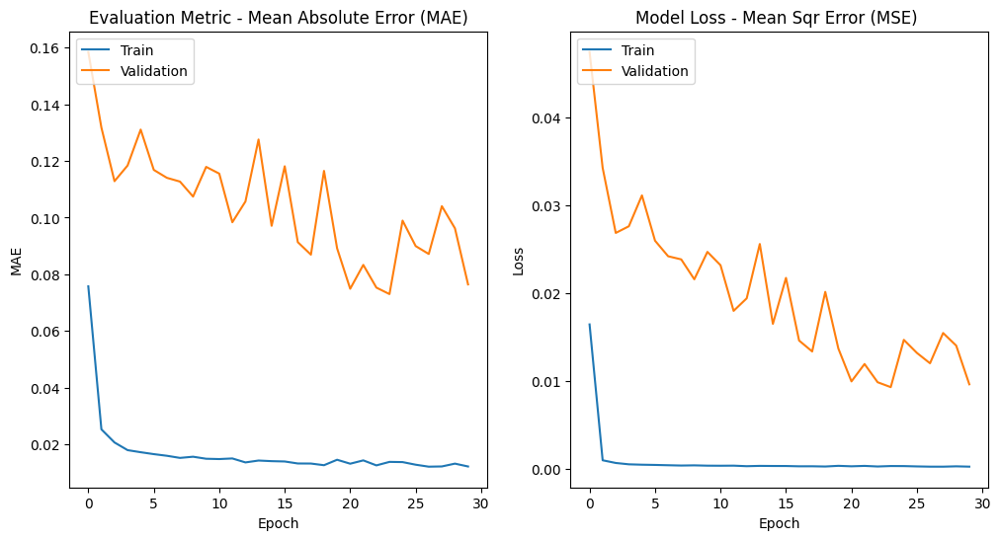

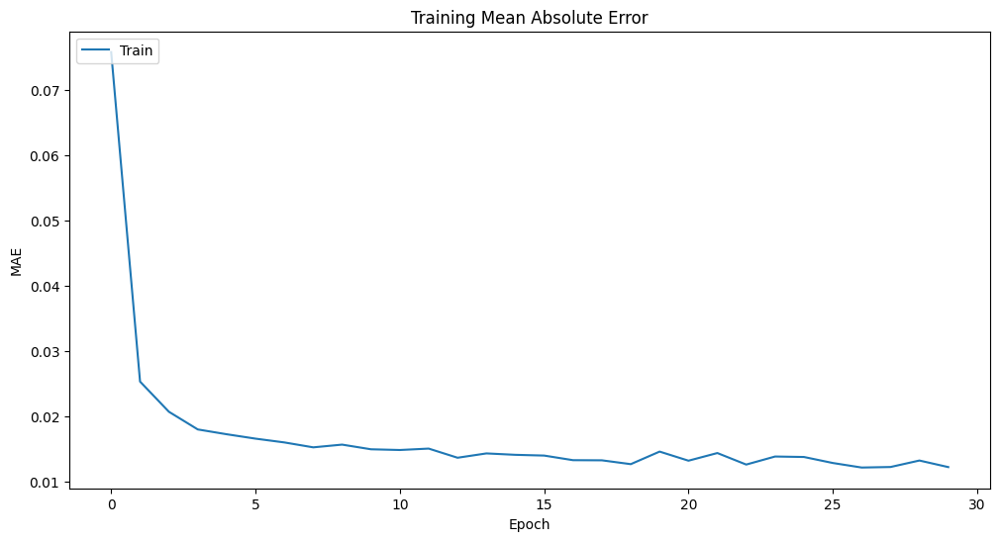

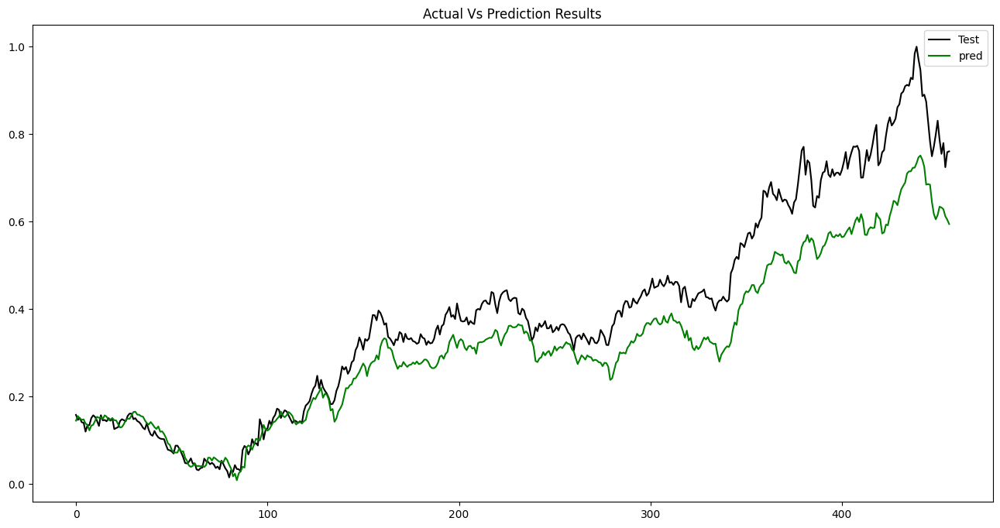

############################################################################
  Model Setup:
                    Name: XOM_F10_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.0476554607514407
             mean_sqr_err =0.004602742252386946
        root_mean_sqr_err =0.06784351297203696
           pred_diff_mean =0.9960658366488611
      pred_diff_bias_mean =0.0039341633511389045
    pred_correctness_mean =0.6892778993435449



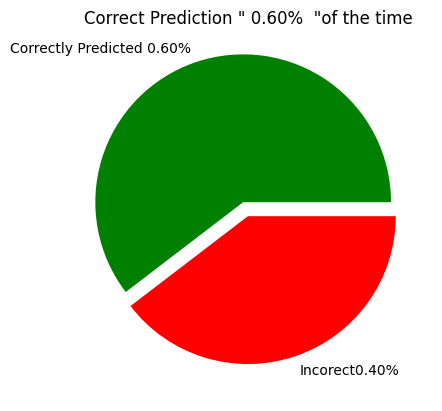

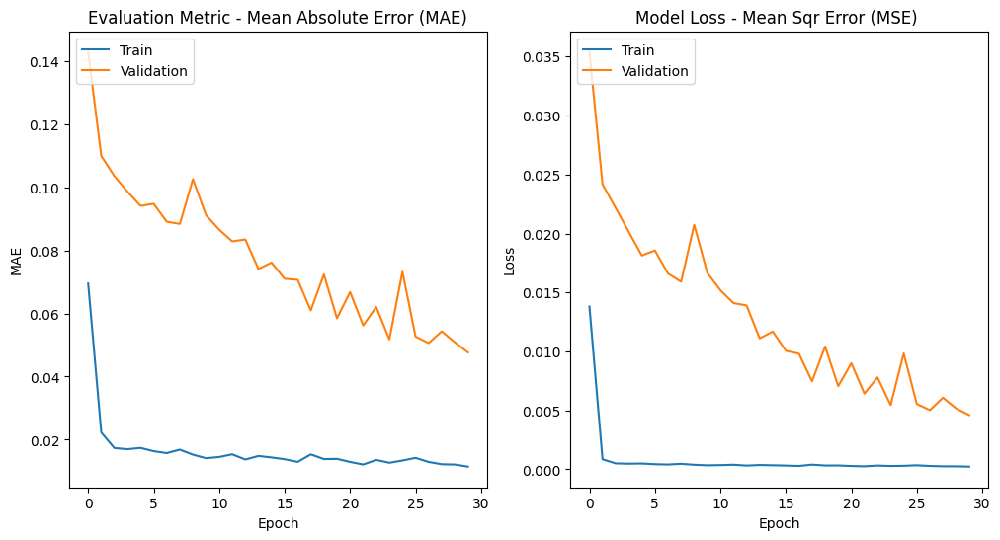

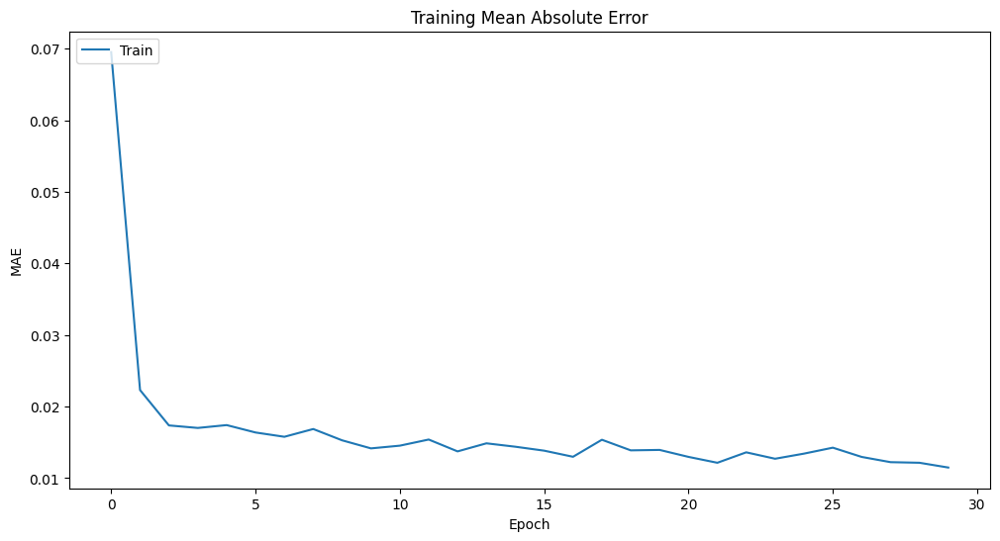

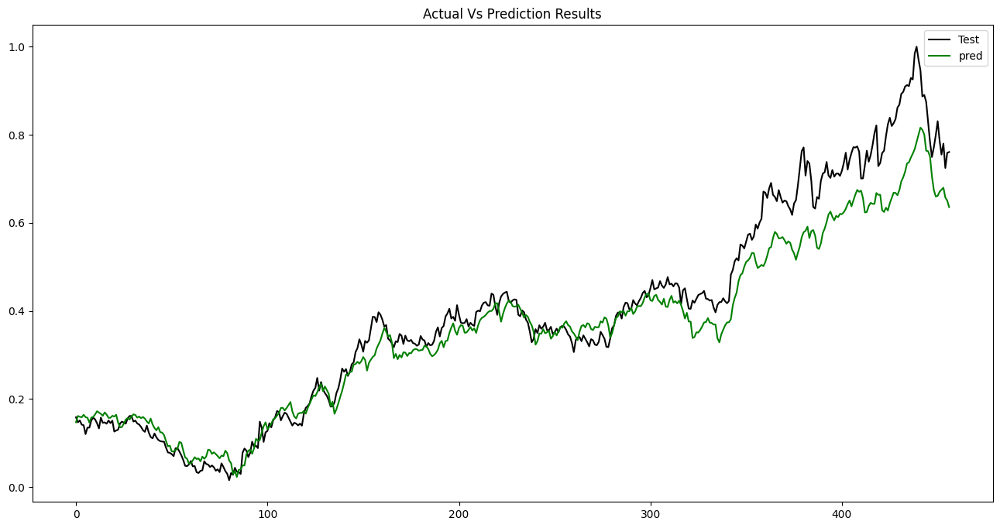

############################################################################
  Model Setup:
                    Name: XOM_F10_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.06673217136223182
             mean_sqr_err =0.006500925009431041
        root_mean_sqr_err =0.08062831394386863
           pred_diff_mean =0.8268469662051932
      pred_diff_bias_mean =0.17315303379480682
    pred_correctness_mean =0.5951859956236324



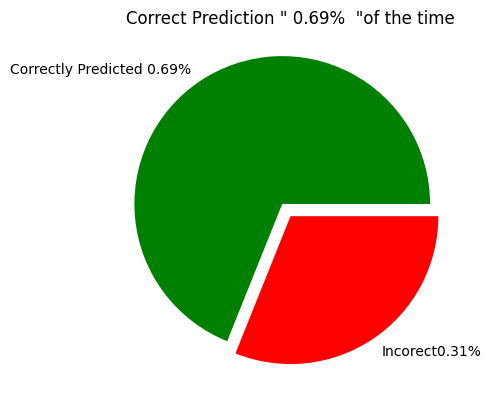

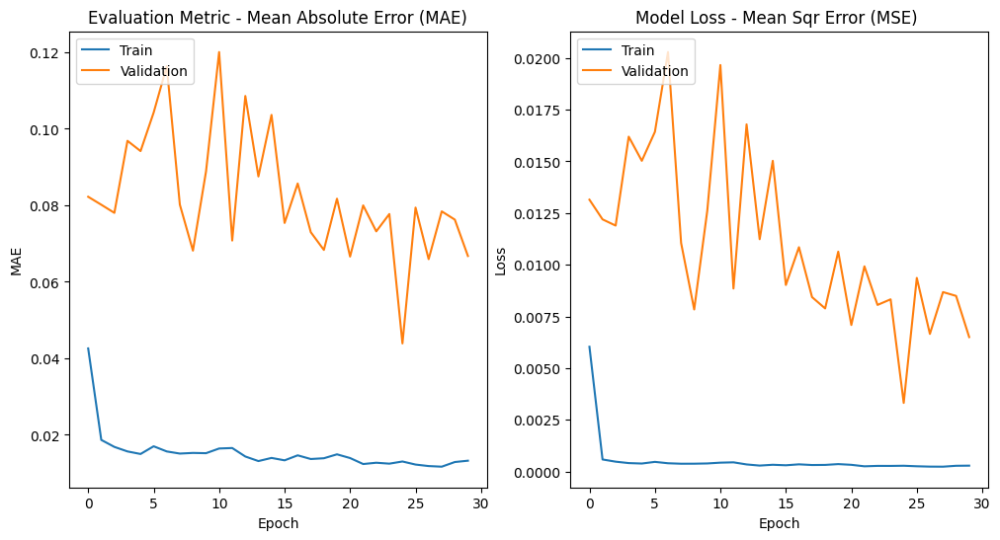

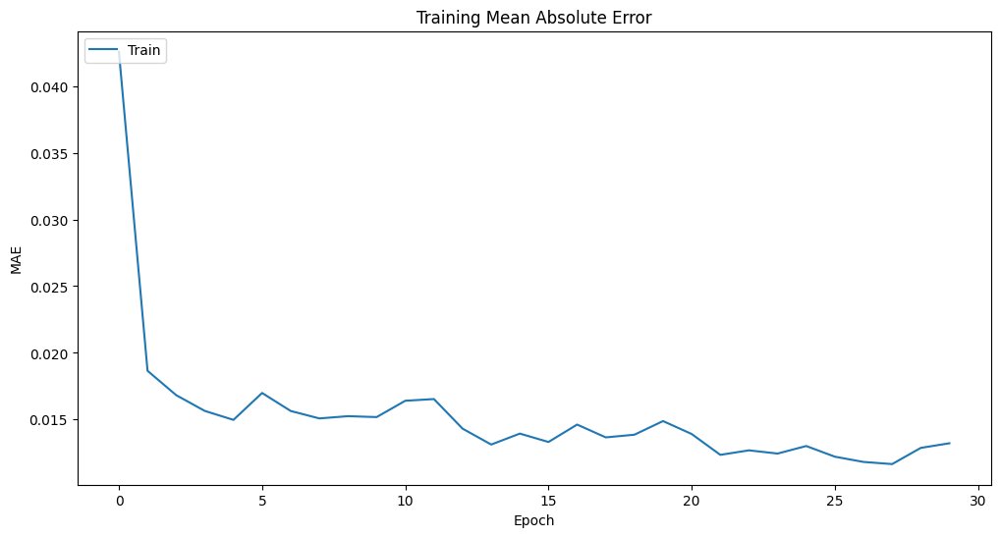

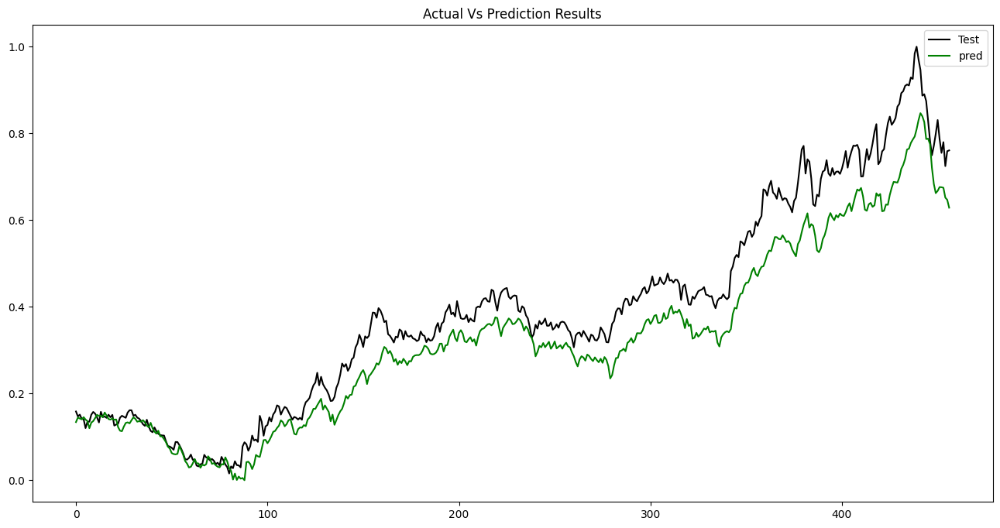

############################################################################
  Model Setup:
                    Name: XOM_F10_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.06348374513745059
             mean_sqr_err =0.0062351034774172495
        root_mean_sqr_err =0.07896267141768476
           pred_diff_mean =0.8655716000823955
      pred_diff_bias_mean =0.1344283999176044
    pred_correctness_mean =0.6039387308533917



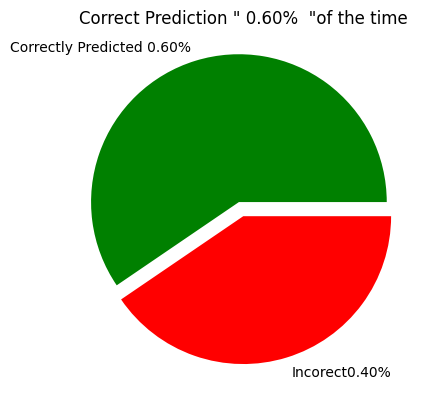

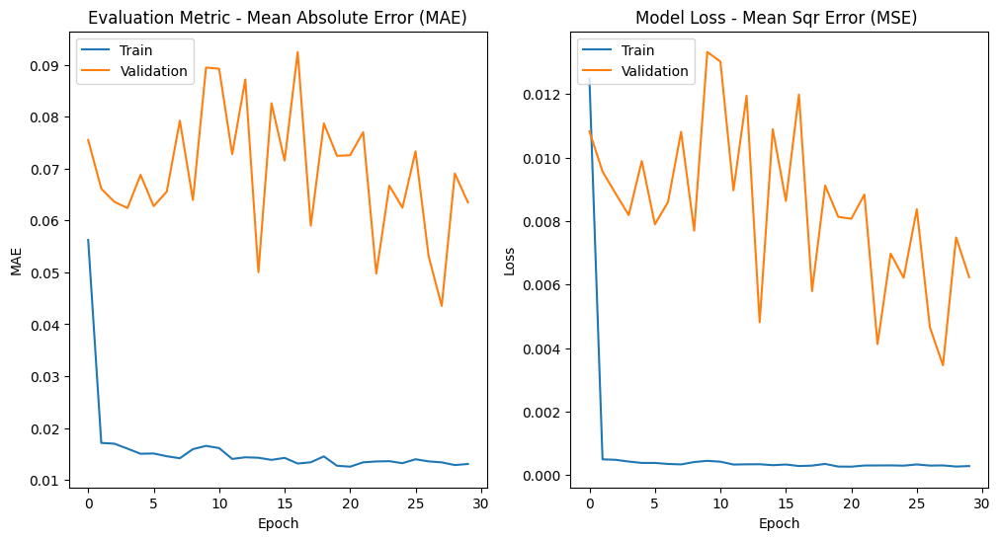

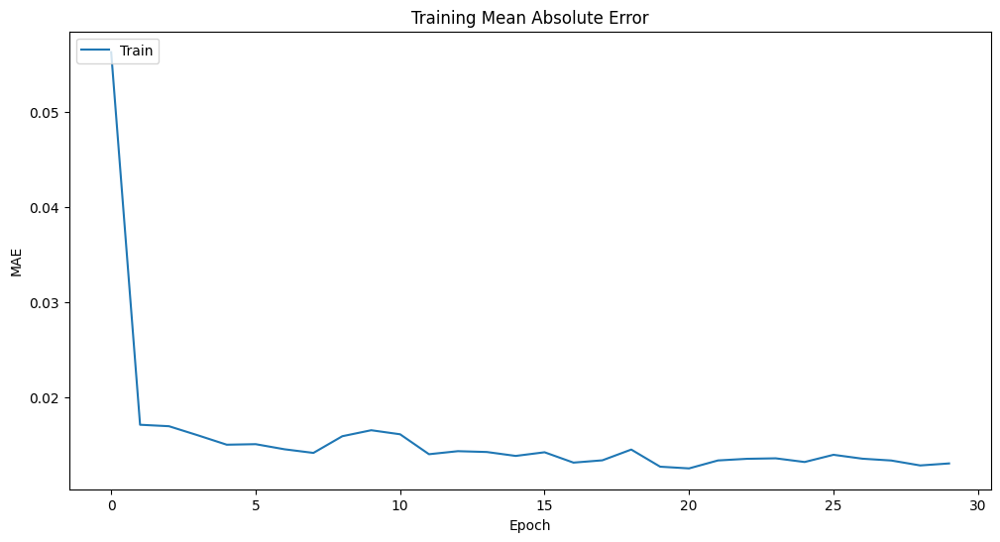

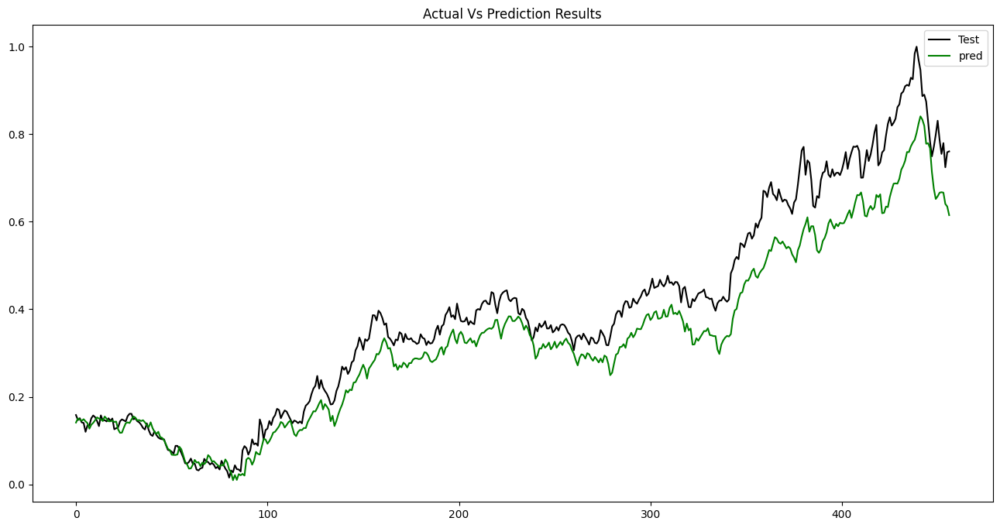

############################################################################
  Model Setup:
                    Name: XOM_F10_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 10
  Result Data:
             mean_abs_err =0.046014530615861686
             mean_sqr_err =0.003891909849467902
        root_mean_sqr_err =0.06238517331440141
           pred_diff_mean =0.9915339858320821
      pred_diff_bias_mean =0.0084660141679179
    pred_correctness_mean =0.7067833698030634



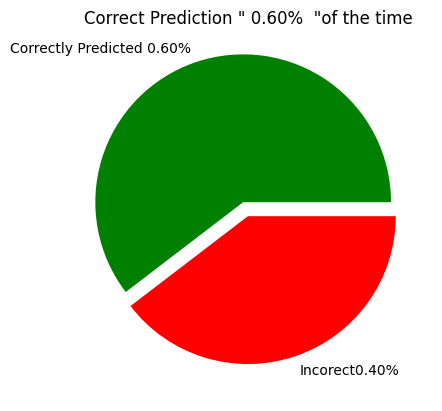

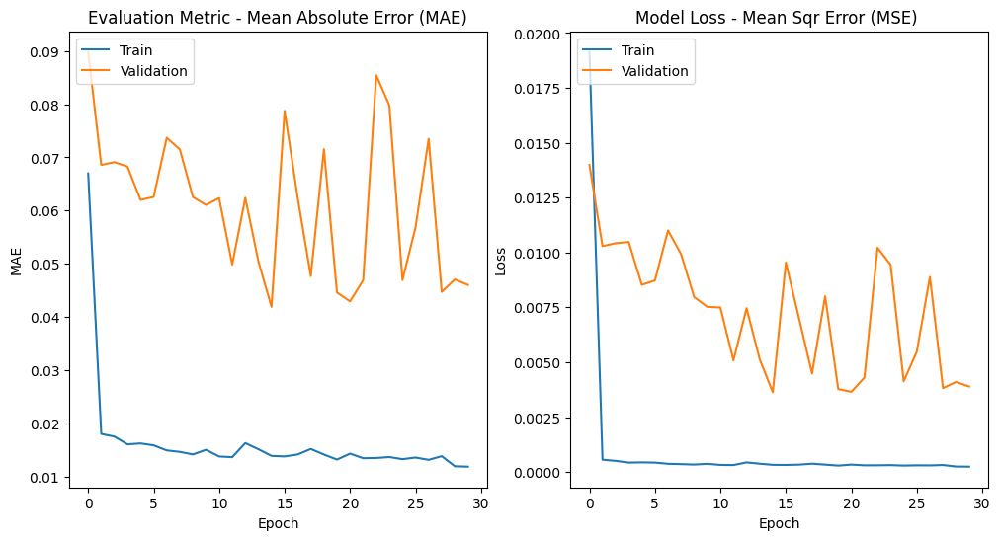

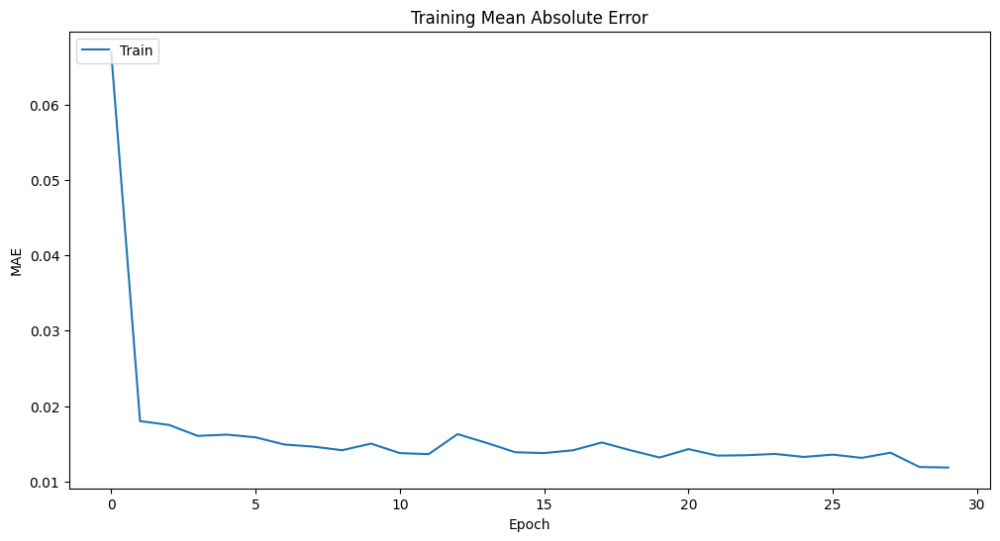

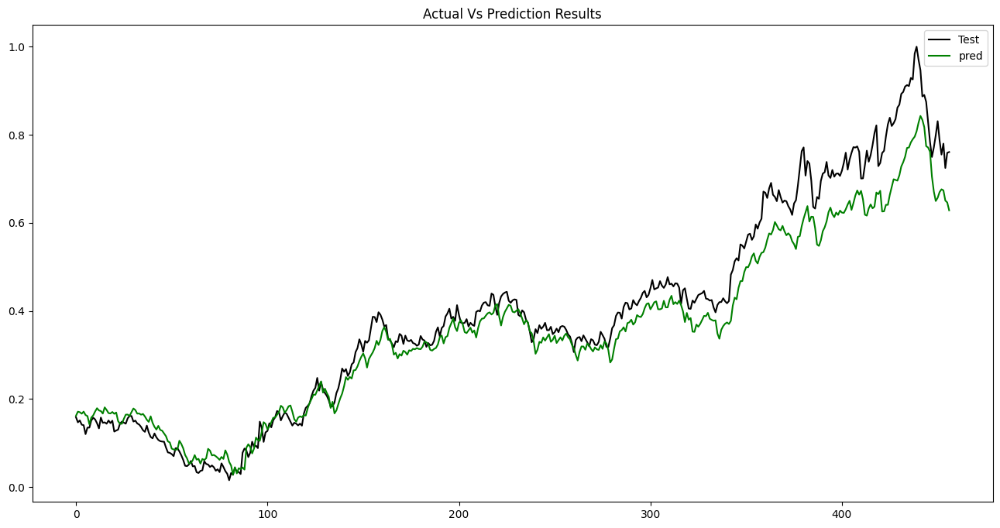

############################################################################
  Model Setup:
                    Name: XOM_F20_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 20
  Result Data:
             mean_abs_err =0.05268907329226947
             mean_sqr_err =0.005682107097437988
        root_mean_sqr_err =0.075379752569493
           pred_diff_mean =0.982100131393179
      pred_diff_bias_mean =0.017899868606821114
    pred_correctness_mean =0.7406593406593407



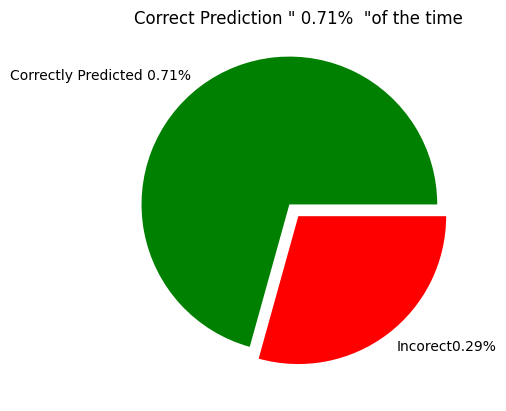

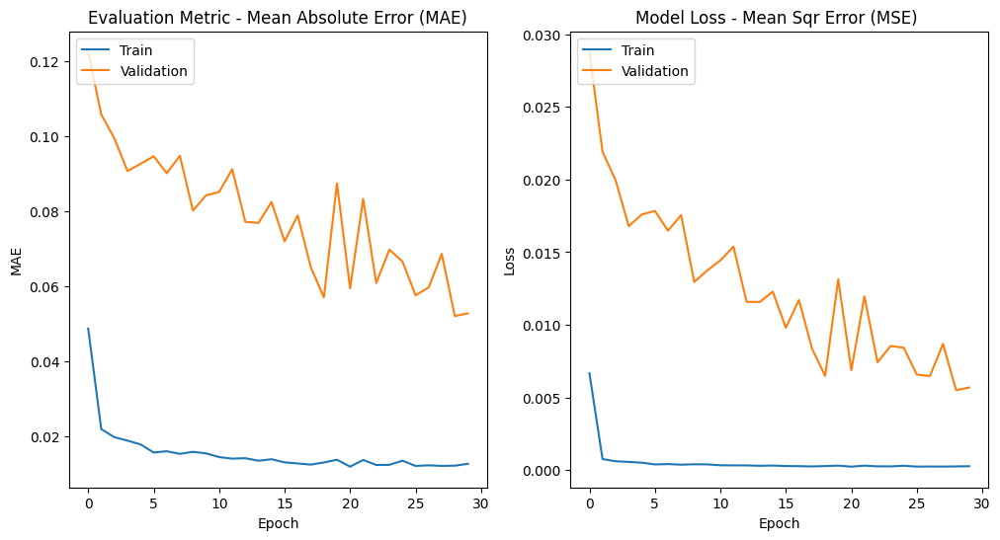

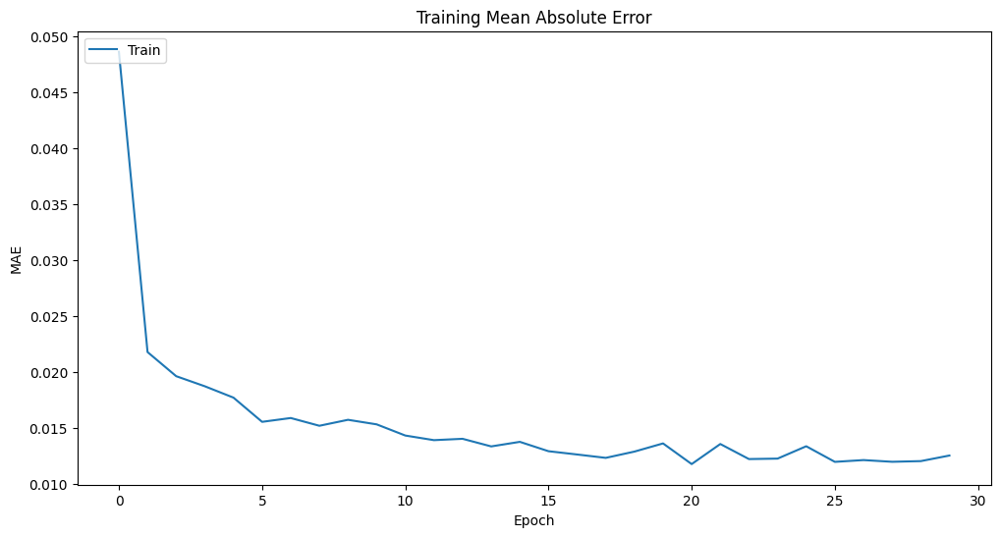

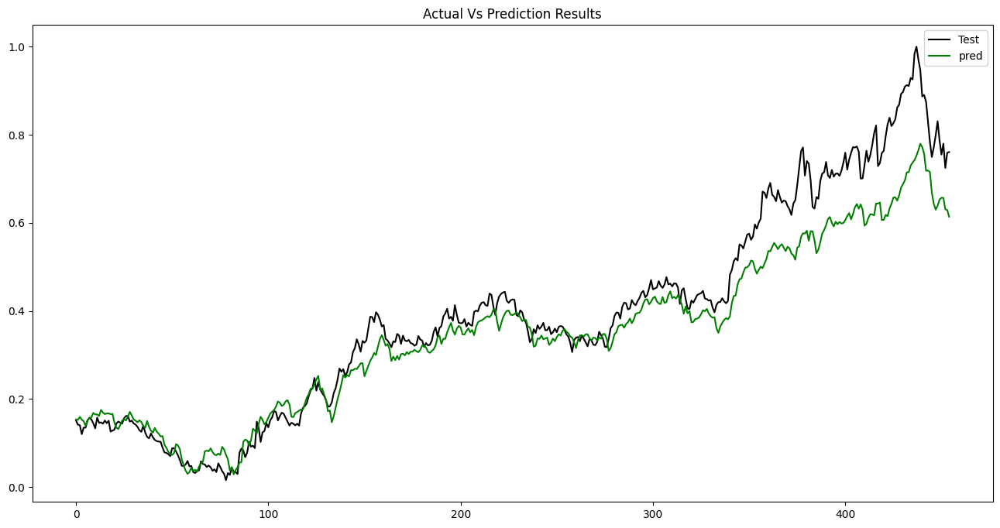

############################################################################
  Model Setup:
                    Name: XOM_F20_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 20
  Result Data:
             mean_abs_err =0.04432344912884681
             mean_sqr_err =0.003416204782610822
        root_mean_sqr_err =0.05844830863772554
           pred_diff_mean =0.9367939241870927
      pred_diff_bias_mean =0.06320607581290741
    pred_correctness_mean =0.8021978021978022



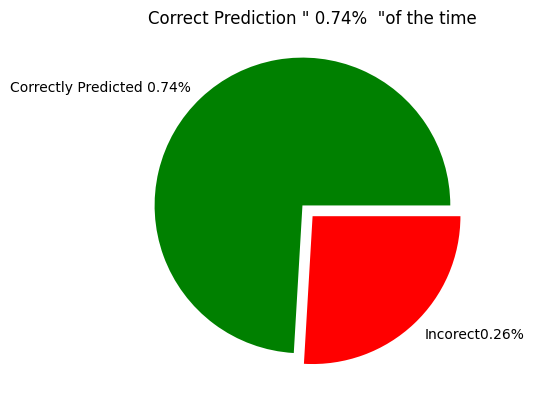

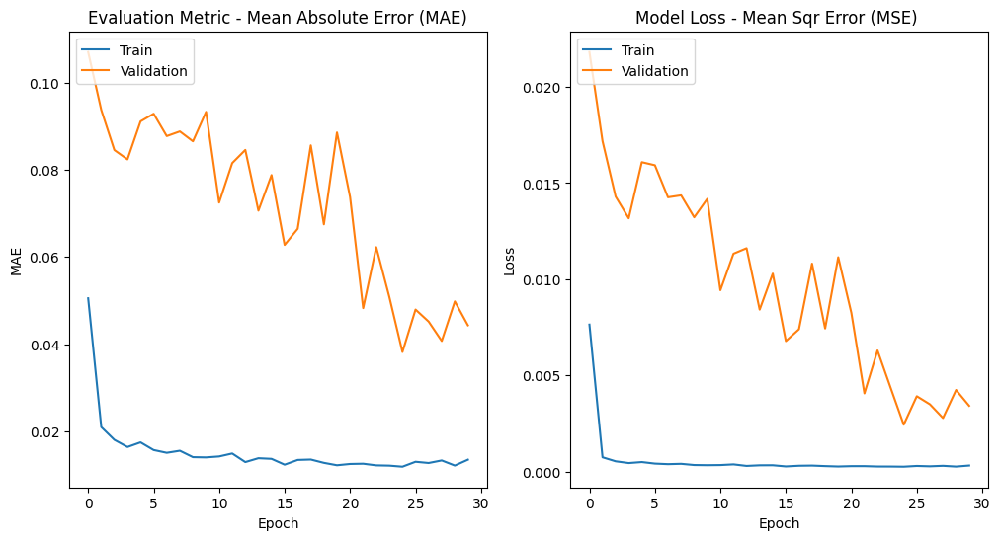

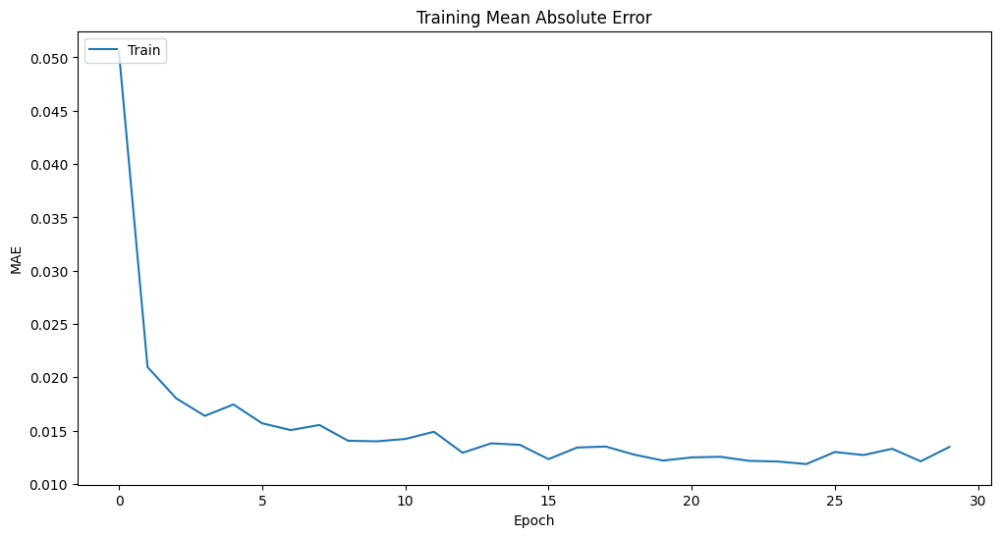

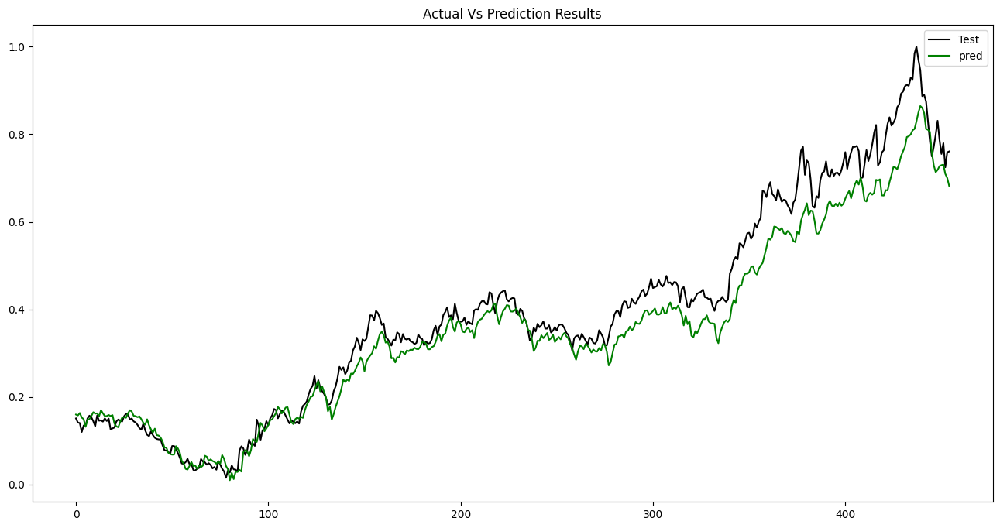

############################################################################
  Model Setup:
                    Name: XOM_F20_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 20
  Result Data:
             mean_abs_err =0.05384835054779158
             mean_sqr_err =0.004675116217182805
        root_mean_sqr_err =0.06837482151481497
           pred_diff_mean =0.8775916973790253
      pred_diff_bias_mean =0.12240830262097456
    pred_correctness_mean =0.7472527472527473



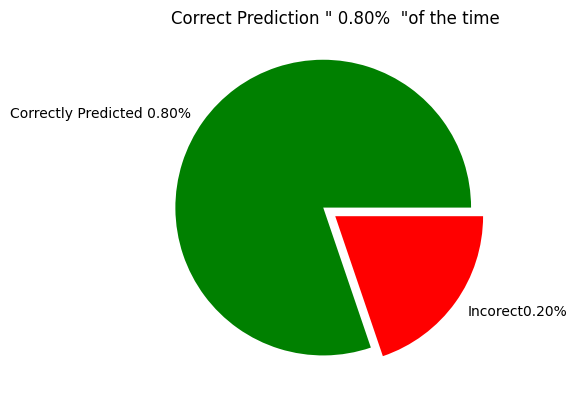

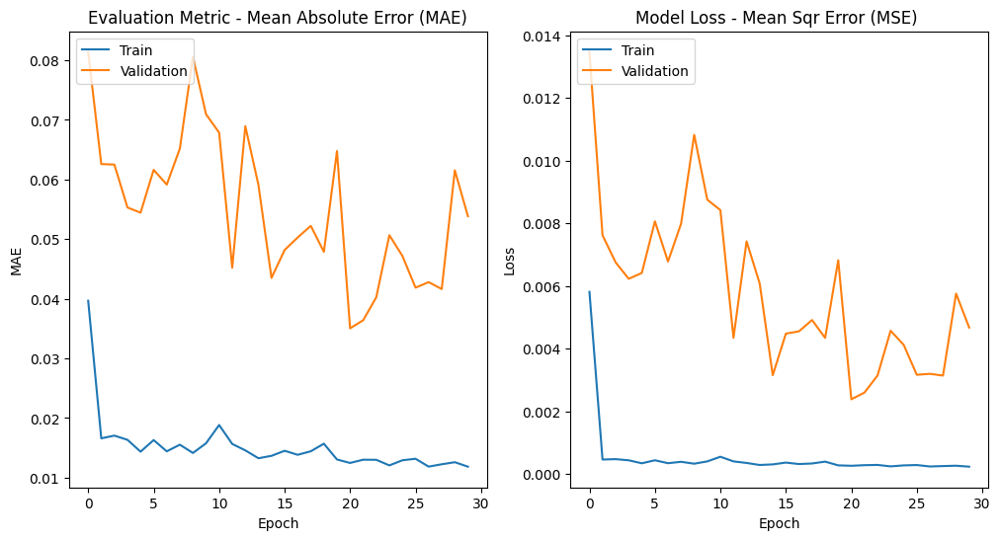

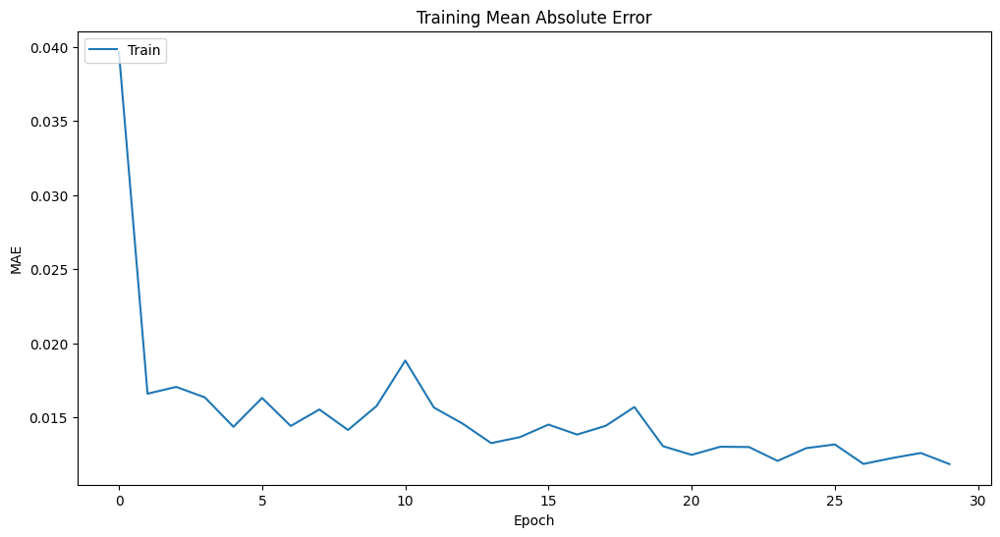

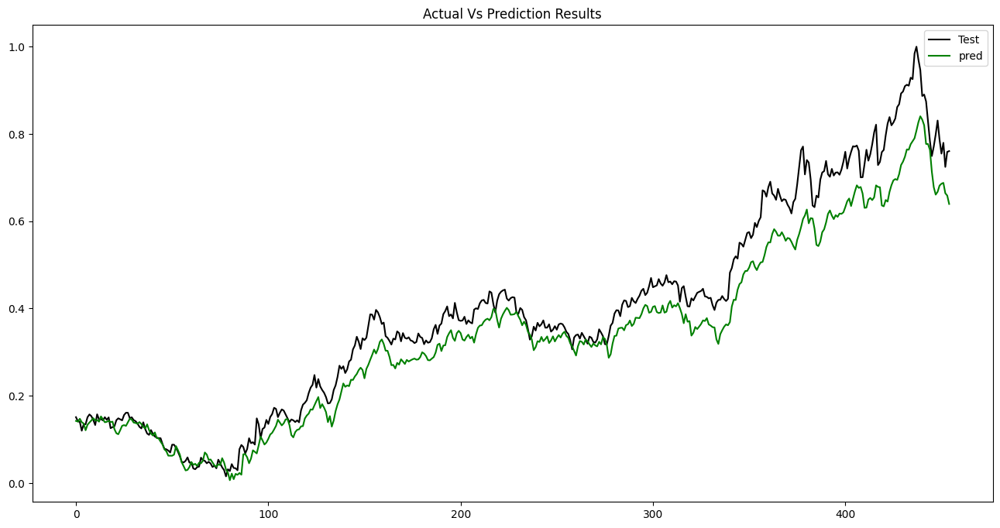

############################################################################
  Model Setup:
                    Name: XOM_F20_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 20
  Result Data:
             mean_abs_err =0.06175309420143671
             mean_sqr_err =0.00609725932120868
        root_mean_sqr_err =0.07808494938980674
           pred_diff_mean =0.856172140017678
      pred_diff_bias_mean =0.14382785998232192
    pred_correctness_mean =0.7054945054945055



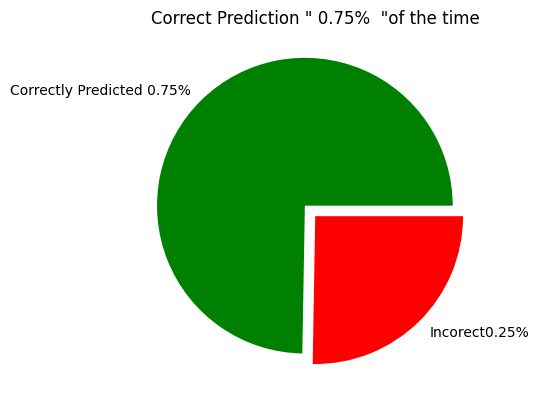

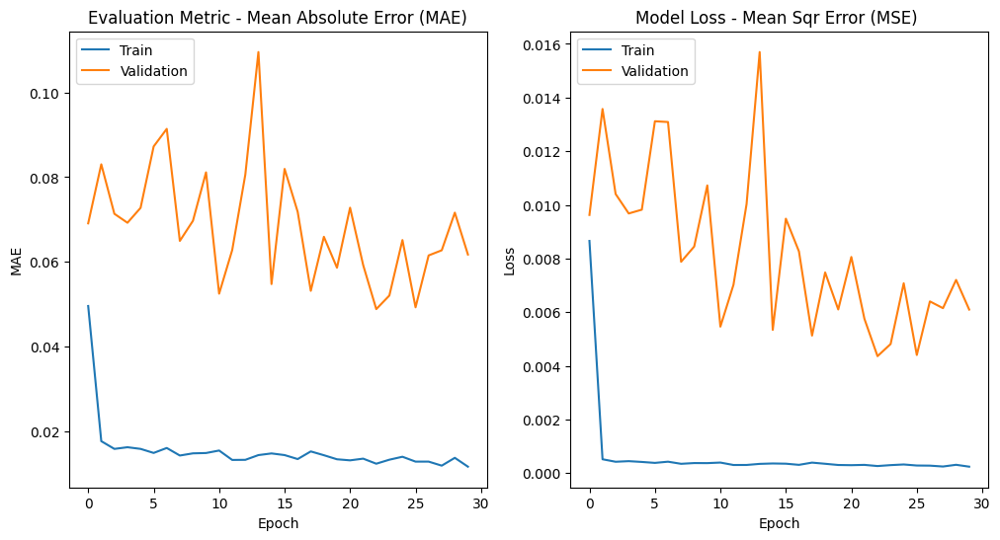

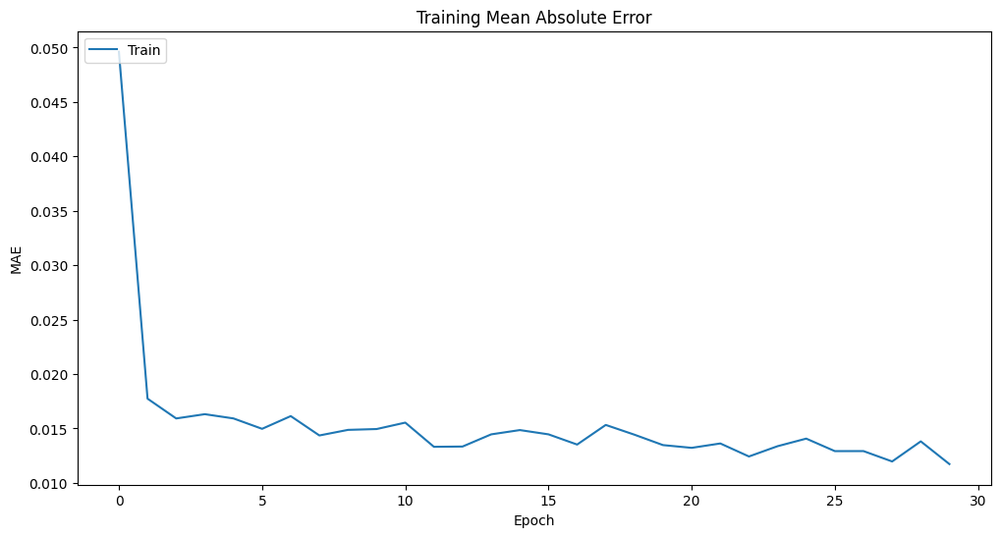

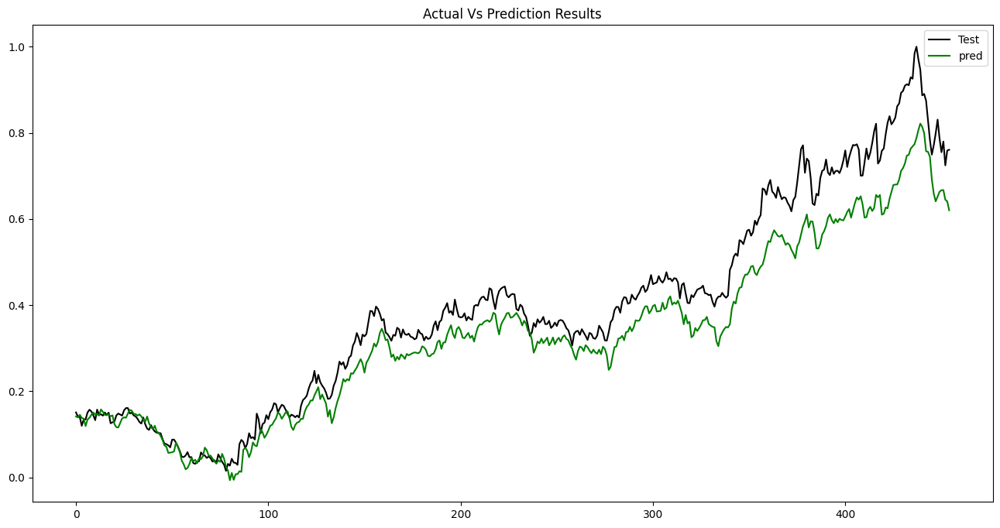

############################################################################
  Model Setup:
                    Name: XOM_F20_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 20
  Result Data:
             mean_abs_err =0.10288725435886961
             mean_sqr_err =0.014359323334886775
        root_mean_sqr_err =0.119830394036266
           pred_diff_mean =0.7016781751575937
      pred_diff_bias_mean =0.2983218248424063
    pred_correctness_mean =0.5472527472527473



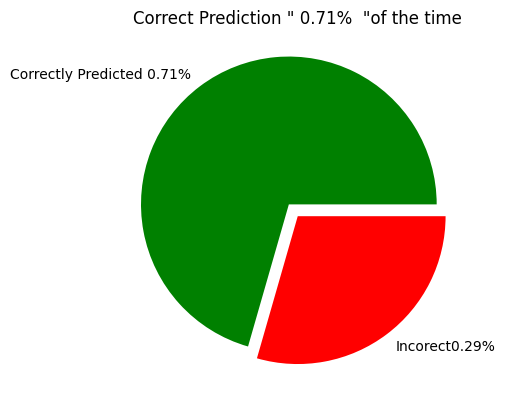

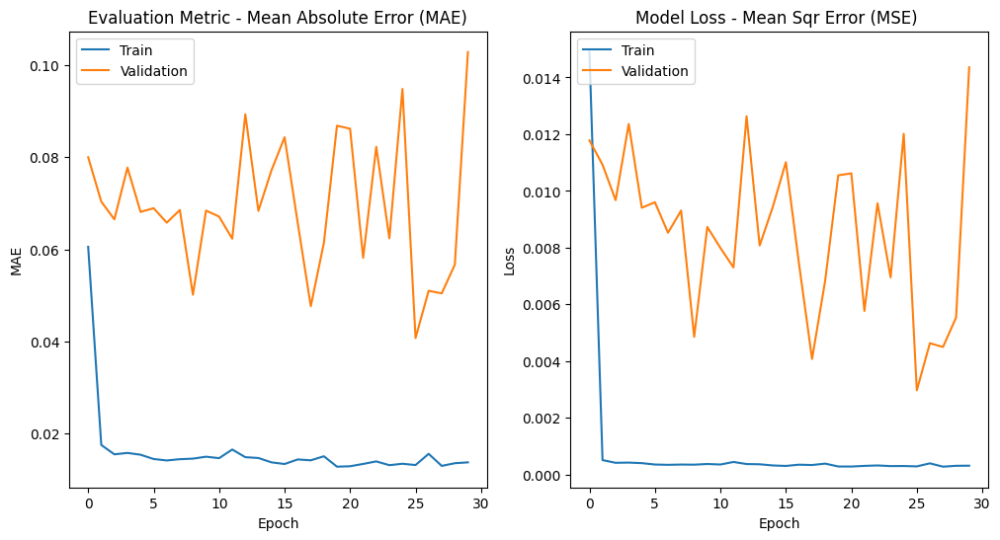

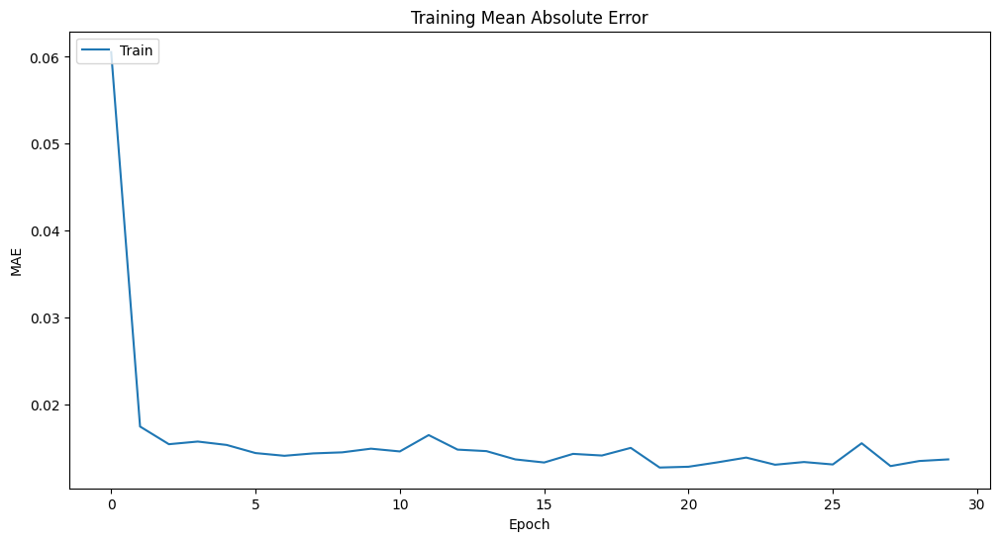

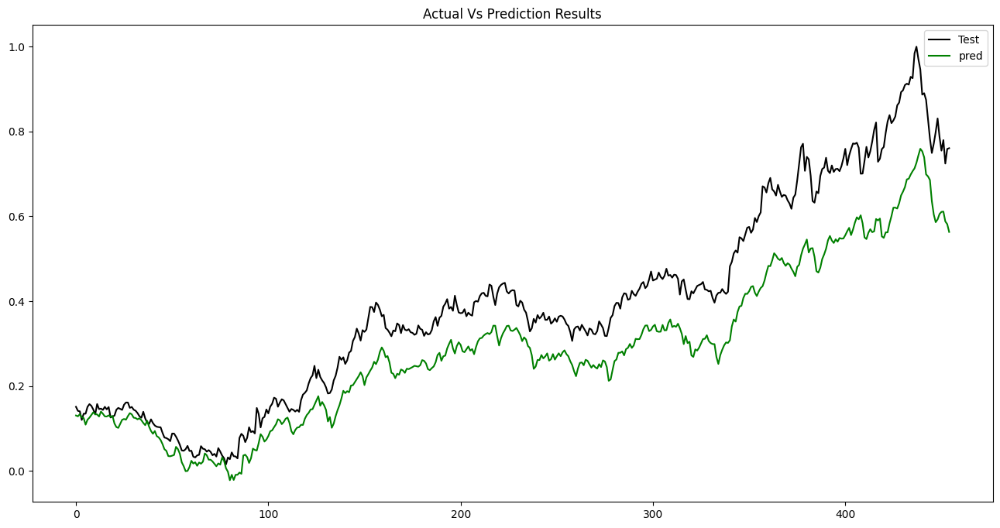

############################################################################
  Model Setup:
                    Name: XOM_F30_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 30
  Result Data:
             mean_abs_err =0.07681077144422581
             mean_sqr_err =0.009422433076868138
        root_mean_sqr_err =0.09706921796773753
           pred_diff_mean =0.9168897733579566
      pred_diff_bias_mean =0.08311022664204333
    pred_correctness_mean =0.6821192052980133



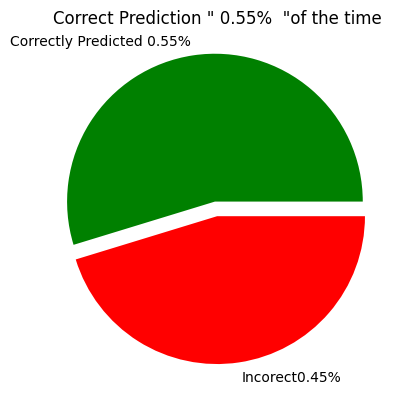

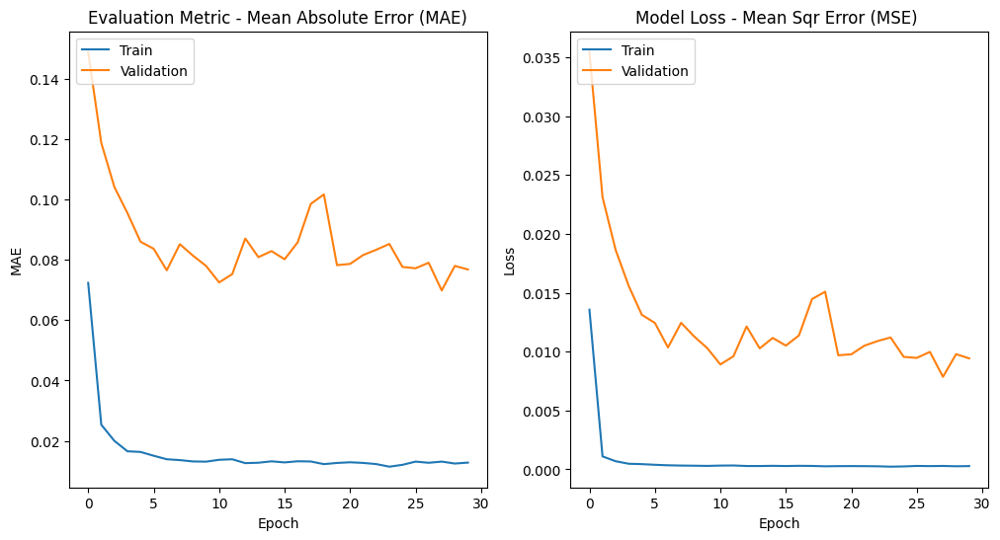

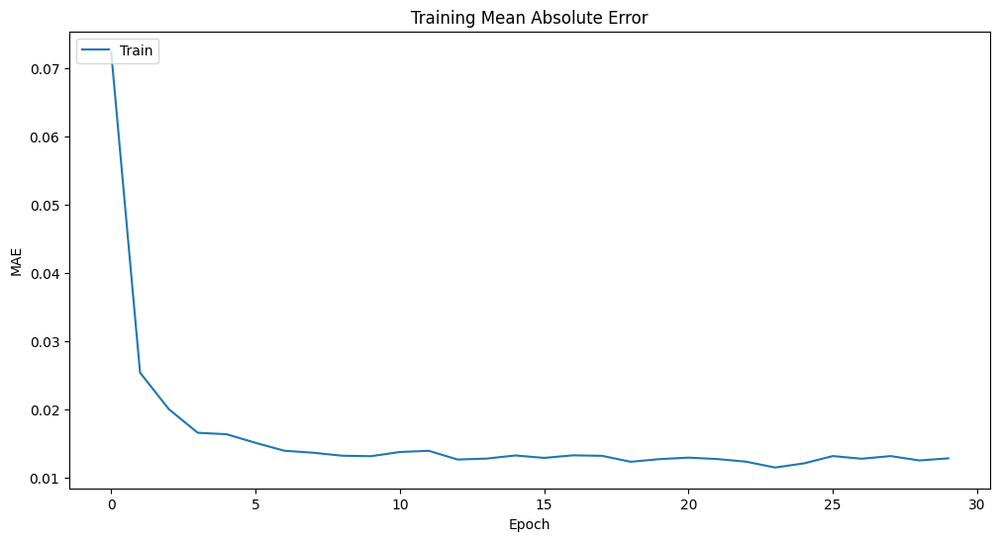

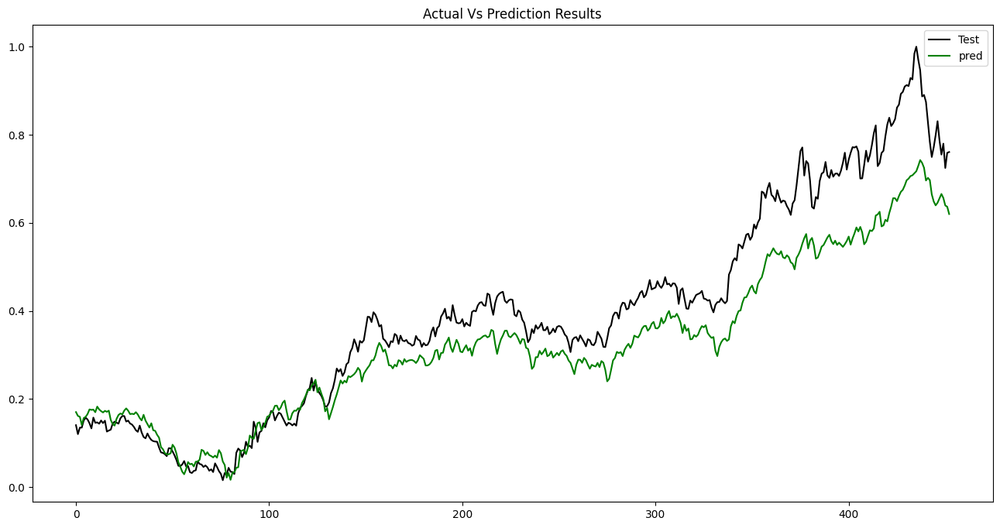

############################################################################
  Model Setup:
                    Name: XOM_F30_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 30
  Result Data:
             mean_abs_err =0.07452059664518874
             mean_sqr_err =0.00974717037872752
        root_mean_sqr_err =0.09872775890663942
           pred_diff_mean =0.9281560992972439
      pred_diff_bias_mean =0.07184390070275608
    pred_correctness_mean =0.695364238410596



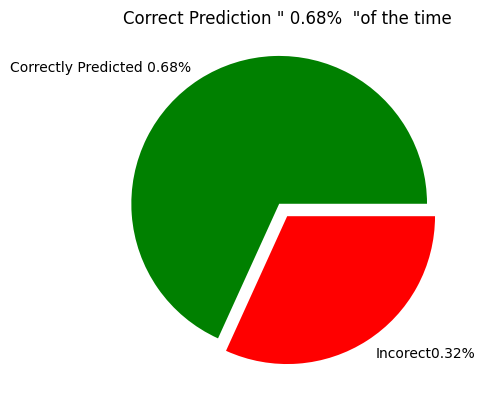

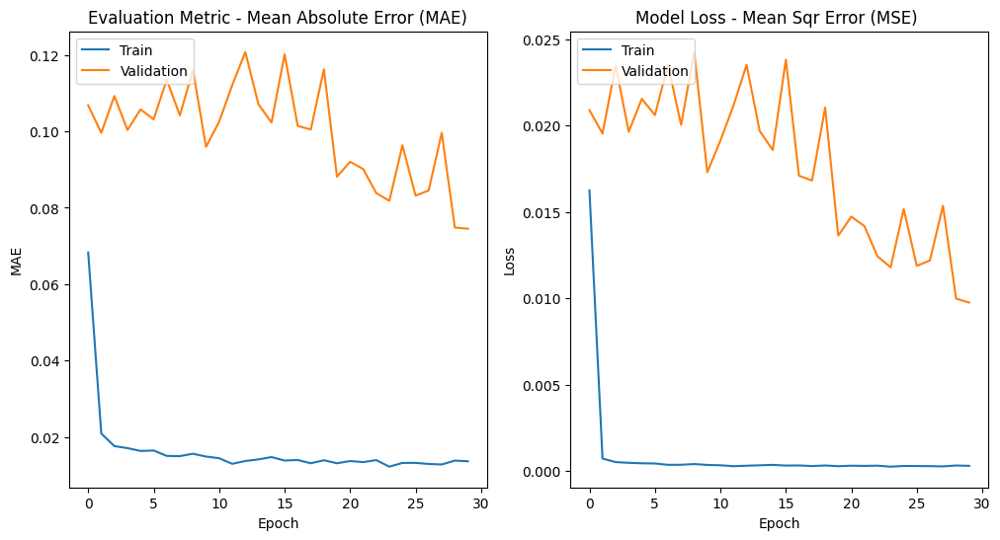

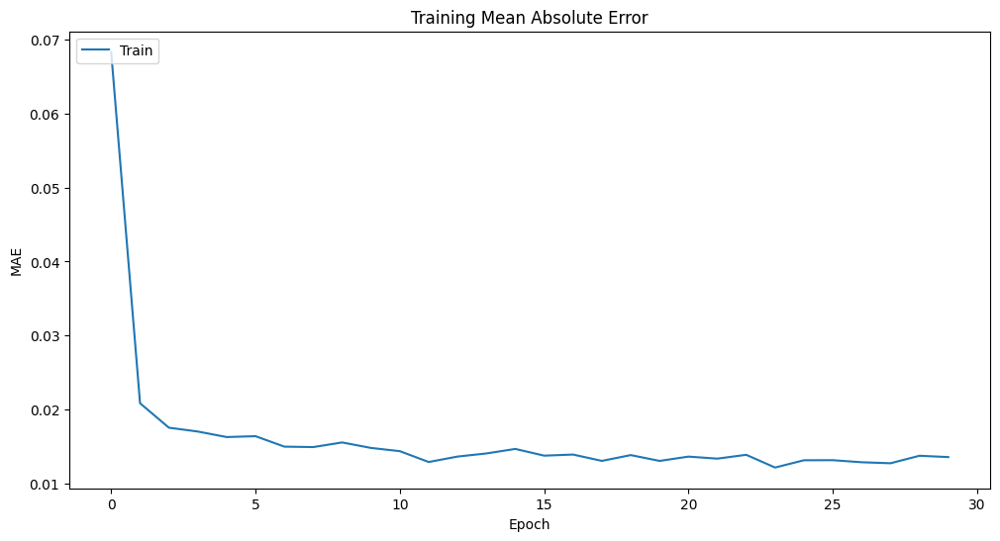

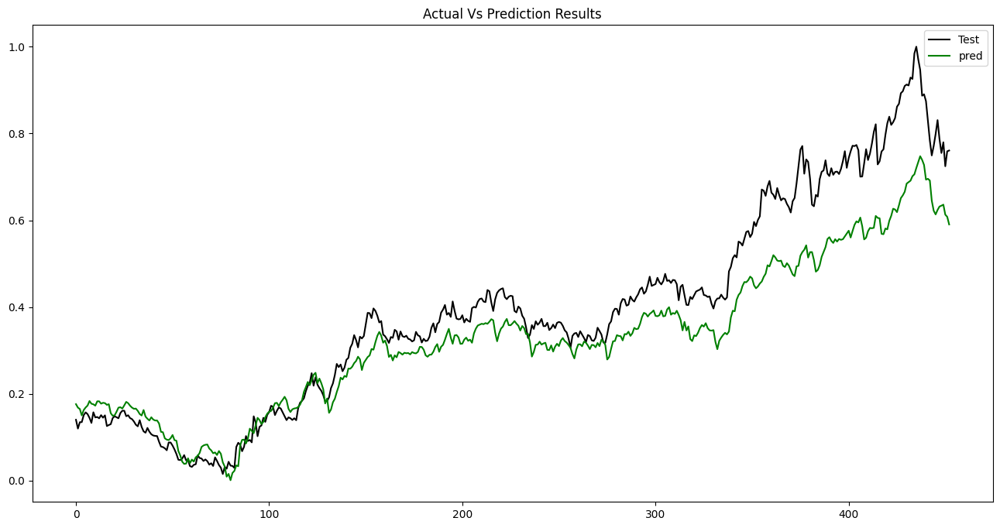

############################################################################
  Model Setup:
                    Name: XOM_F30_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 30
  Result Data:
             mean_abs_err =0.06880272155306853
             mean_sqr_err =0.007064532150050182
        root_mean_sqr_err =0.08405077126386278
           pred_diff_mean =0.8593236938728672
      pred_diff_bias_mean =0.14067630612713272
    pred_correctness_mean =0.7108167770419426



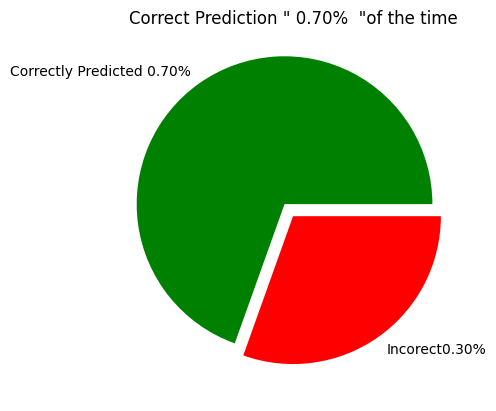

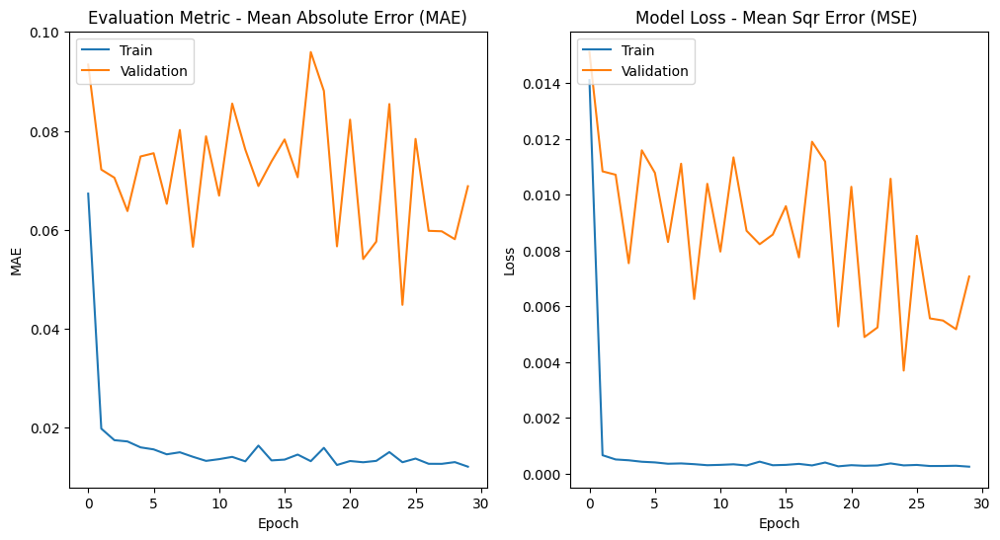

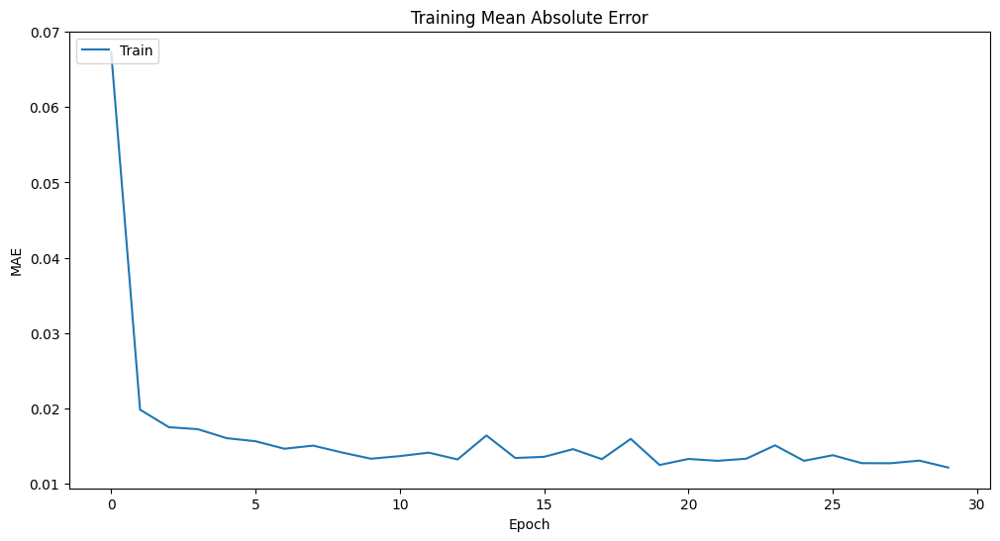

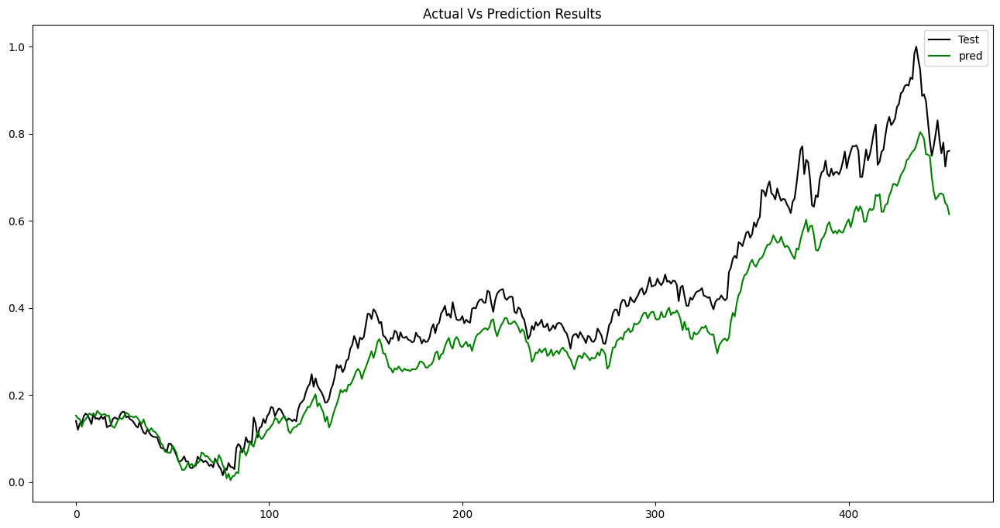

############################################################################
  Model Setup:
                    Name: XOM_F30_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 30
  Result Data:
             mean_abs_err =0.06949376944671615
             mean_sqr_err =0.007051898435288158
        root_mean_sqr_err =0.08397558237540338
           pred_diff_mean =0.8272255520548679
      pred_diff_bias_mean =0.172774447945132
    pred_correctness_mean =0.7196467991169978



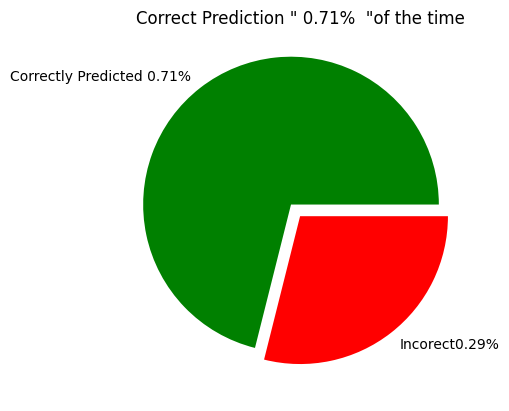

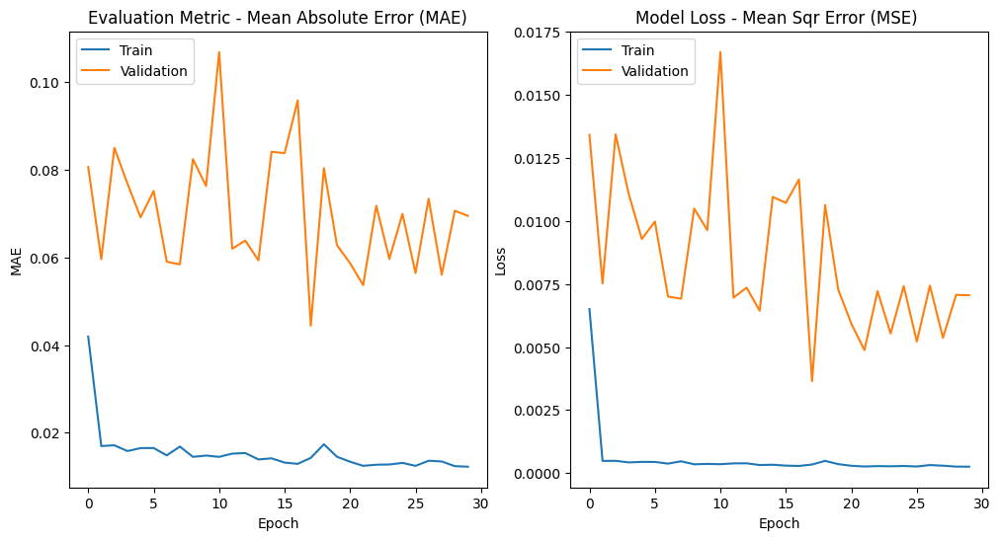

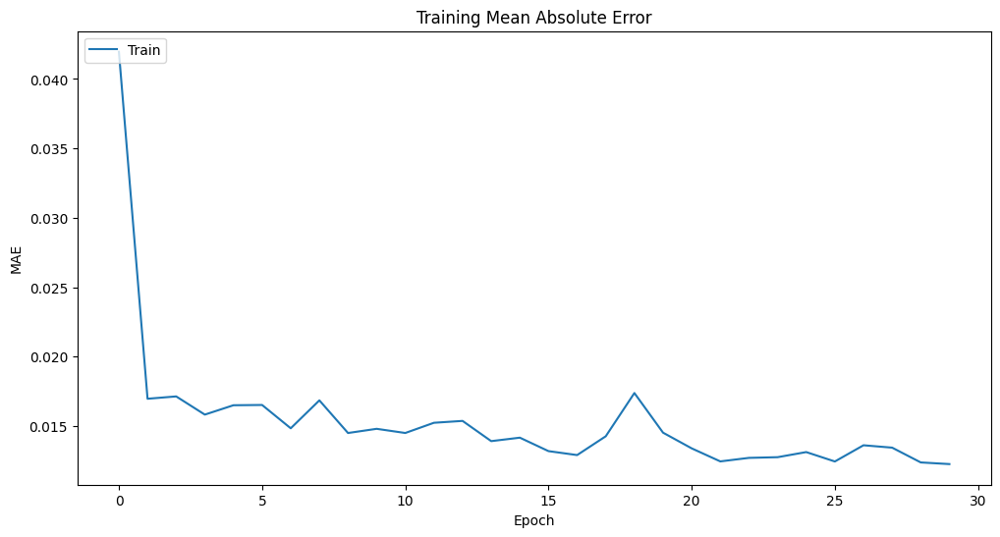

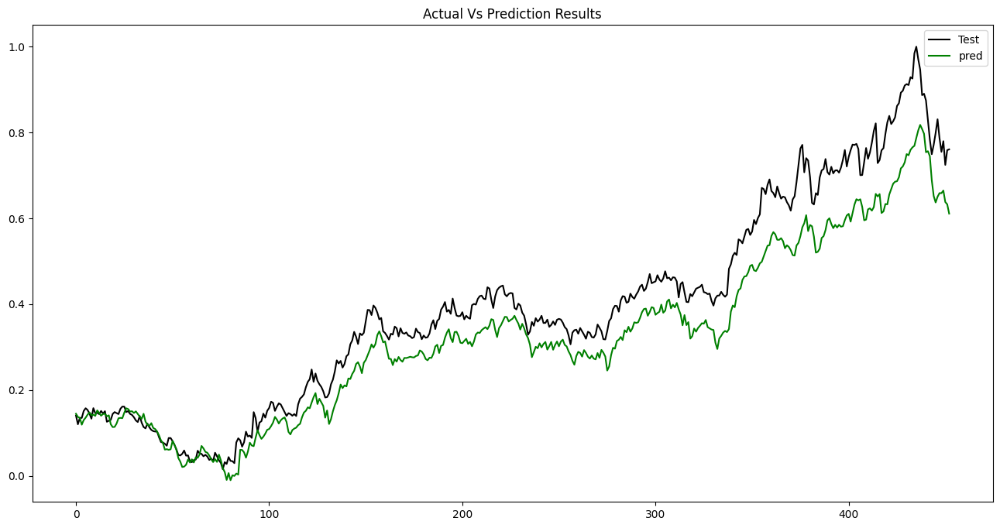

############################################################################
  Model Setup:
                    Name: XOM_F30_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 30
  Result Data:
             mean_abs_err =0.0834889968280123
             mean_sqr_err =0.010752585911341546
        root_mean_sqr_err =0.10369467638862444
           pred_diff_mean =0.7973479596349536
      pred_diff_bias_mean =0.20265204036504636
    pred_correctness_mean =0.6622516556291391



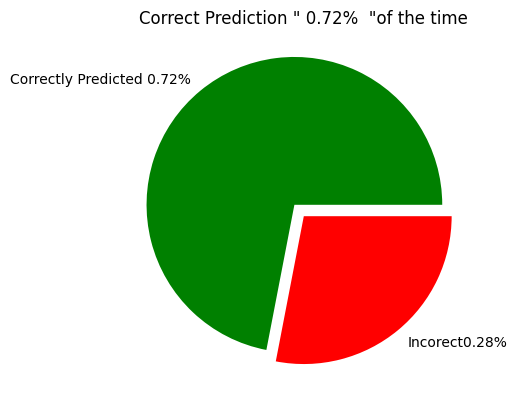

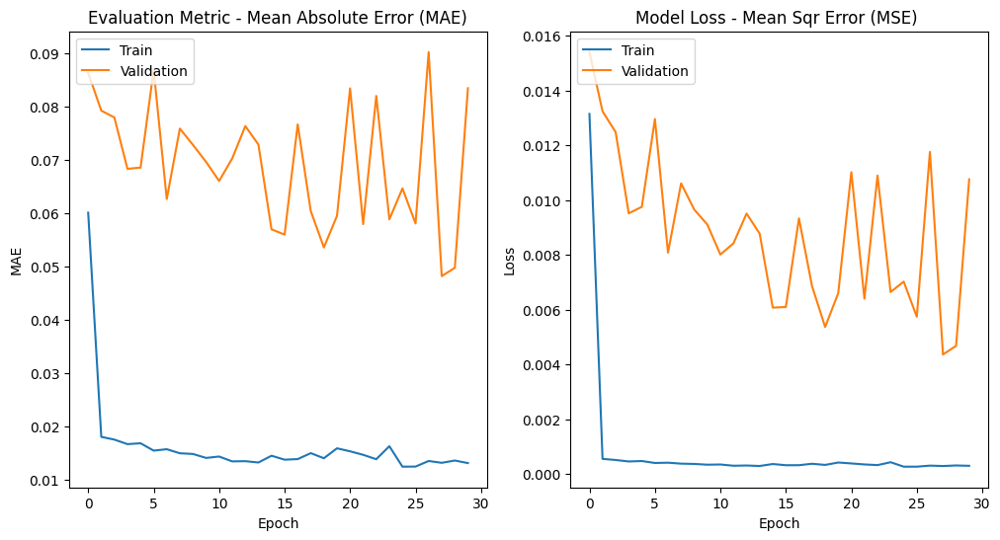

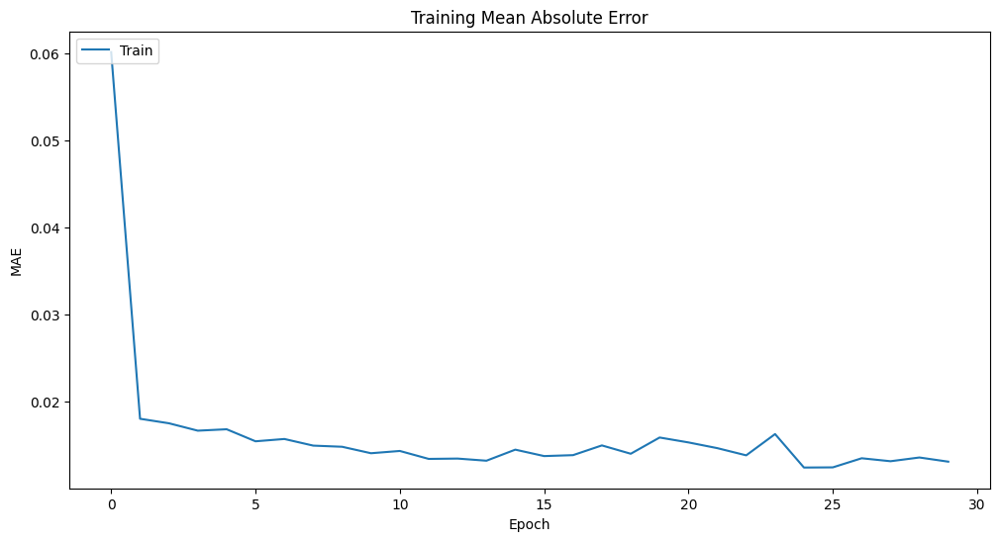

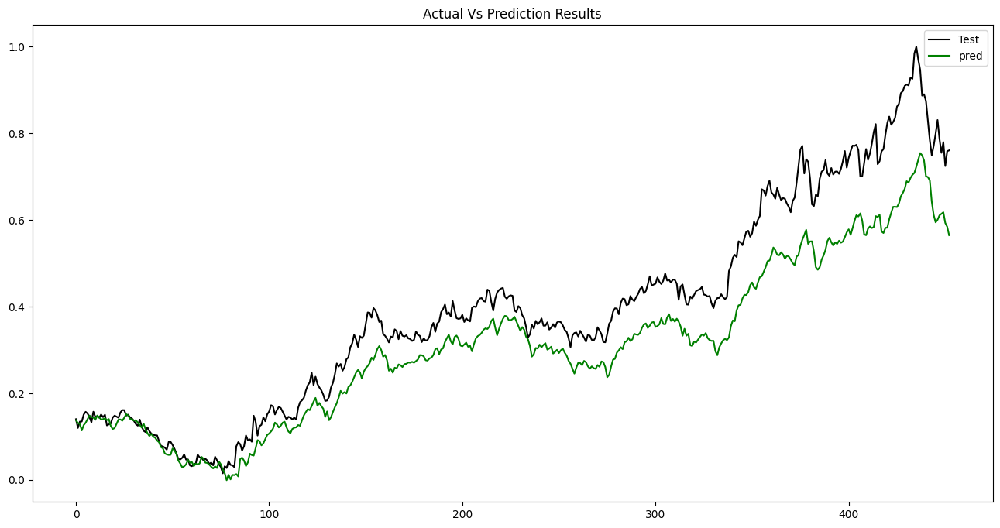

############################################################################
  Model Setup:
                    Name: XOM_F40_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 40
  Result Data:
             mean_abs_err =0.04085697466566015
             mean_sqr_err =0.003565349390938753
        root_mean_sqr_err =0.059710546731199445
           pred_diff_mean =1.052663761672919
      pred_diff_bias_mean =-0.052663761672919175
    pred_correctness_mean =0.9223946784922394



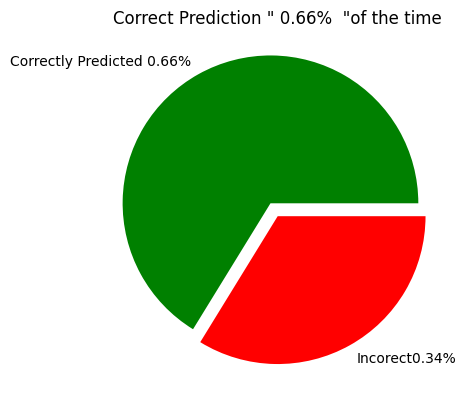

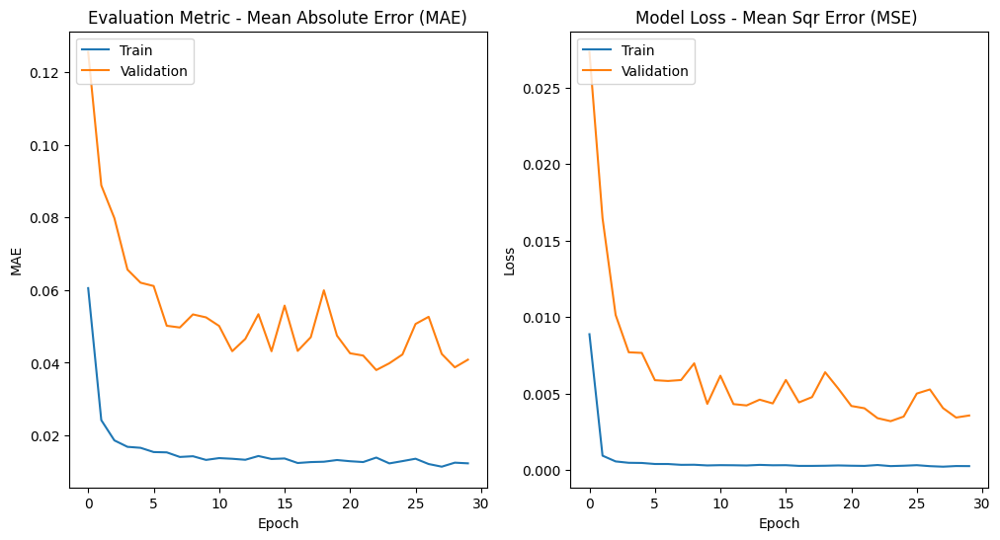

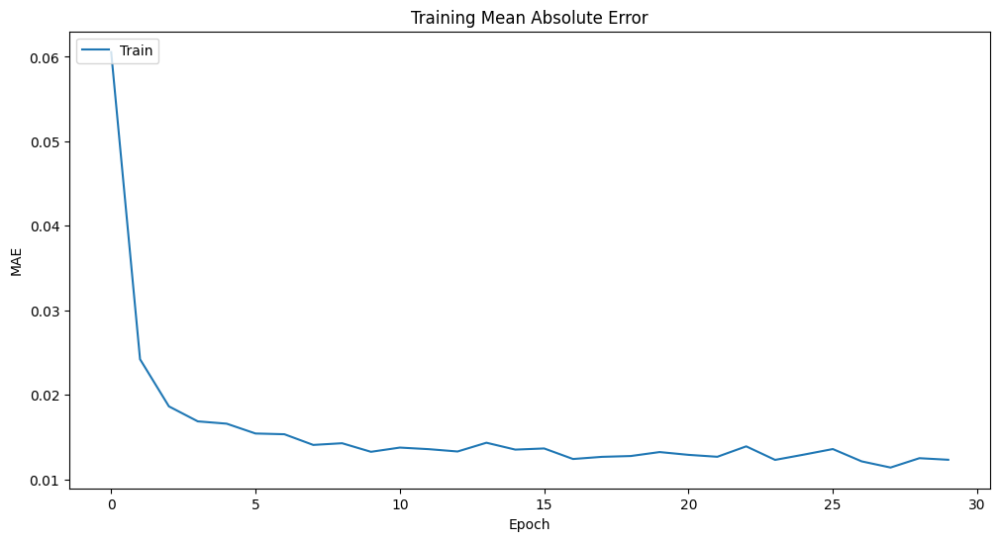

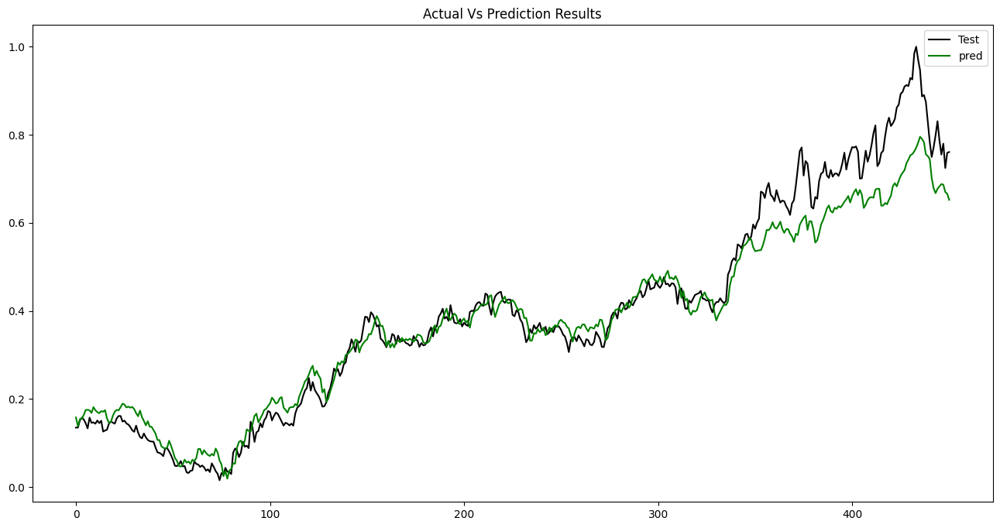

############################################################################
  Model Setup:
                    Name: XOM_F40_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 40
  Result Data:
             mean_abs_err =0.05328060147631103
             mean_sqr_err =0.005577689480467988
        root_mean_sqr_err =0.074683930537084
           pred_diff_mean =1.0140595304664028
      pred_diff_bias_mean =-0.014059530466402835
    pred_correctness_mean =0.844789356984479



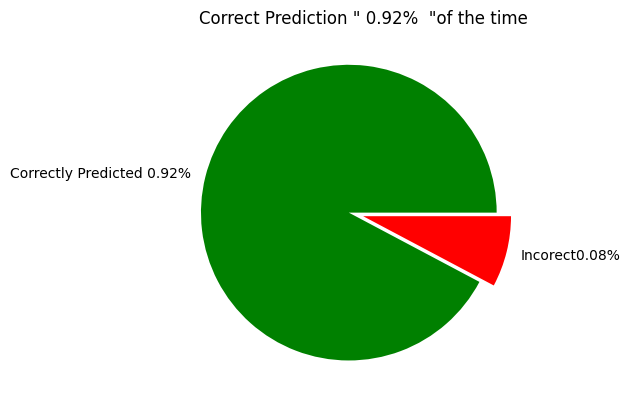

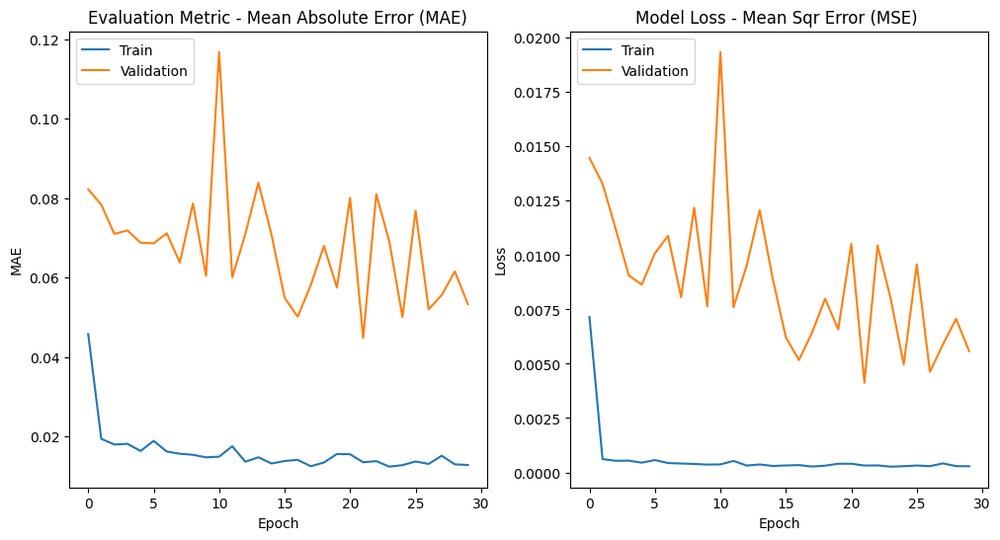

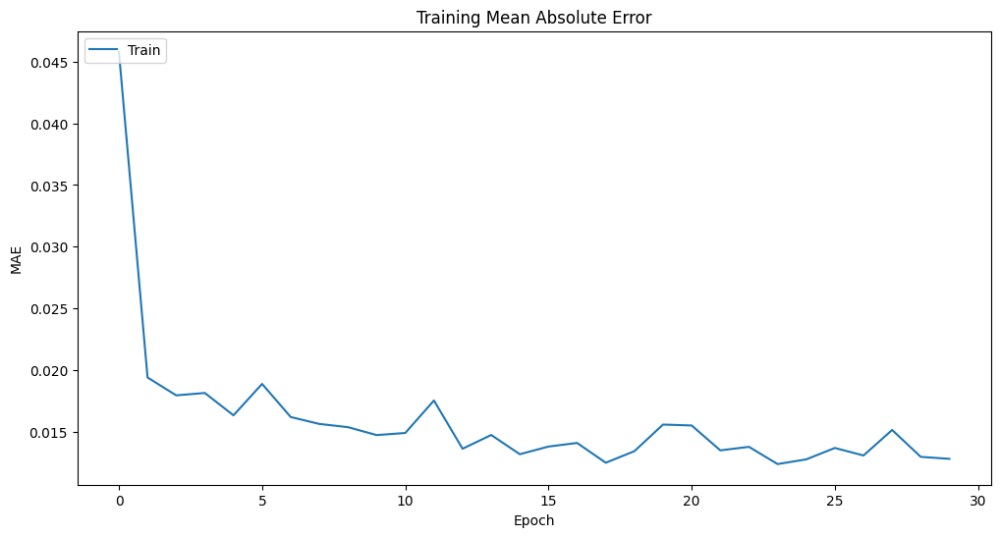

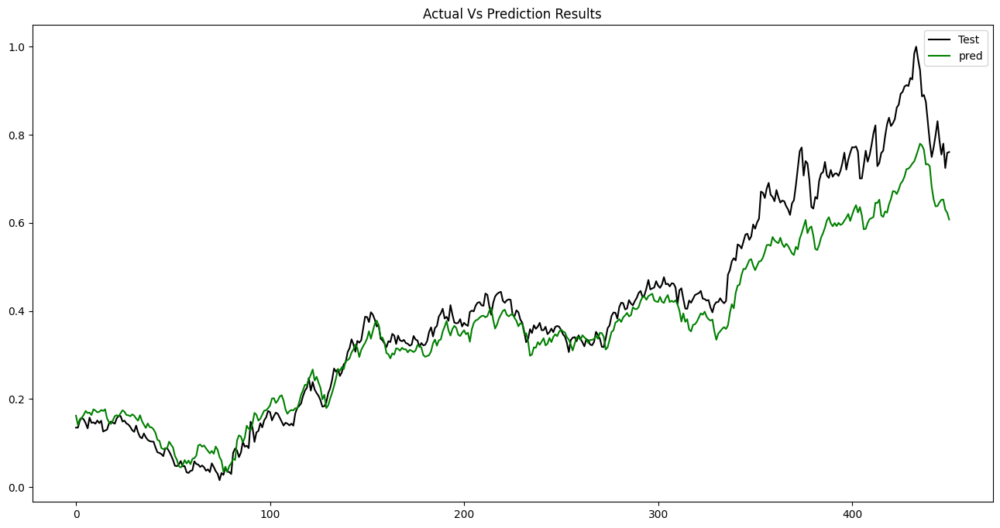

############################################################################
  Model Setup:
                    Name: XOM_F40_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 40
  Result Data:
             mean_abs_err =0.04421557994829691
             mean_sqr_err =0.0035187837960553026
        root_mean_sqr_err =0.05931933745462185
           pred_diff_mean =0.9816951764596958
      pred_diff_bias_mean =0.018304823540304153
    pred_correctness_mean =0.8802660753880266



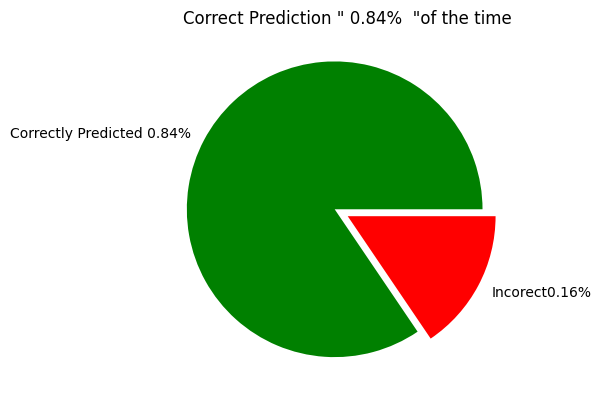

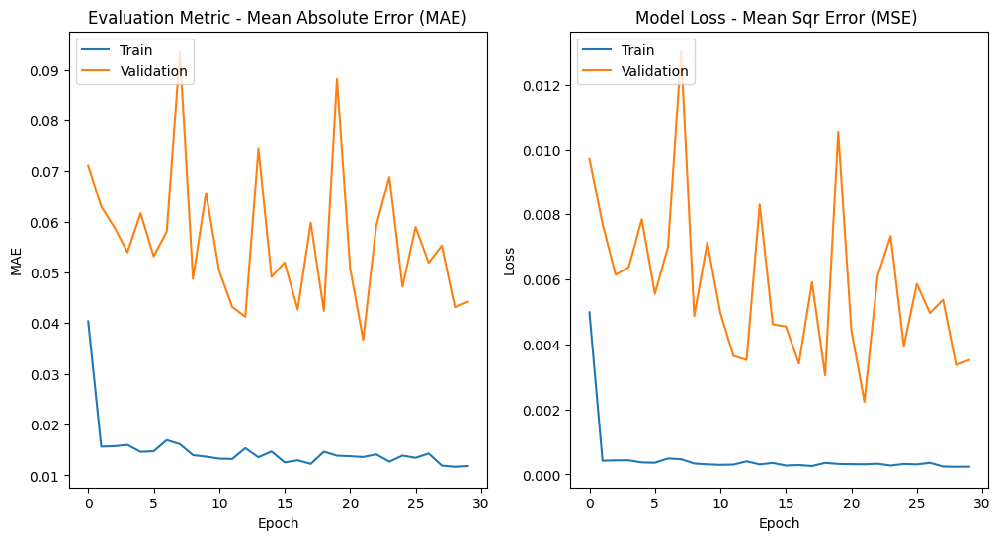

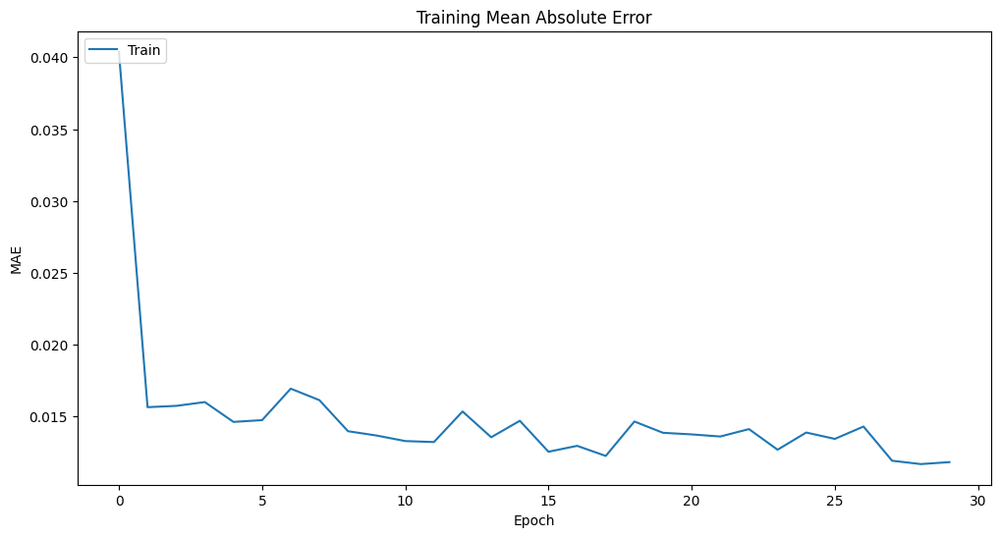

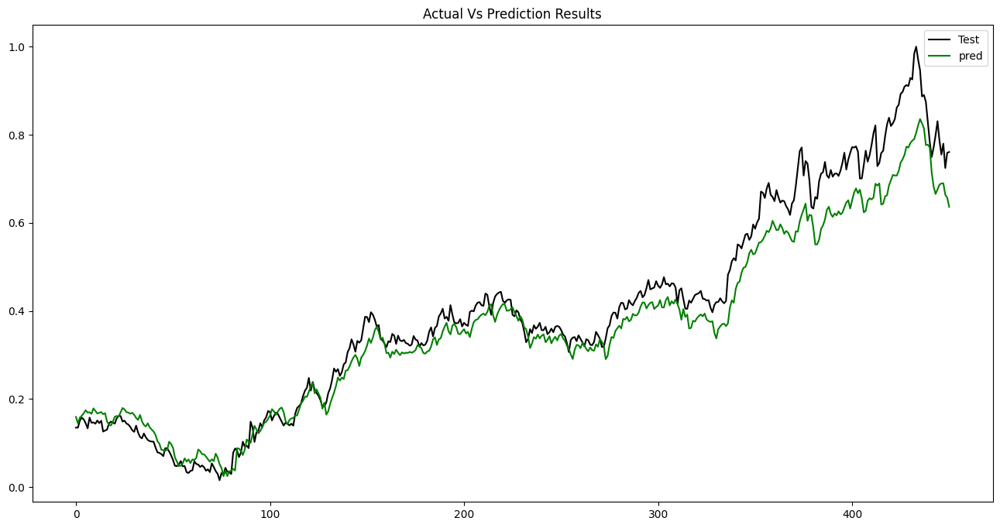

############################################################################
  Model Setup:
                    Name: XOM_F40_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 40
  Result Data:
             mean_abs_err =0.04900919713300526
             mean_sqr_err =0.004390312808450237
        root_mean_sqr_err =0.06625943561825921
           pred_diff_mean =0.9623715886705768
      pred_diff_bias_mean =0.03762841132942333
    pred_correctness_mean =0.8625277161862528



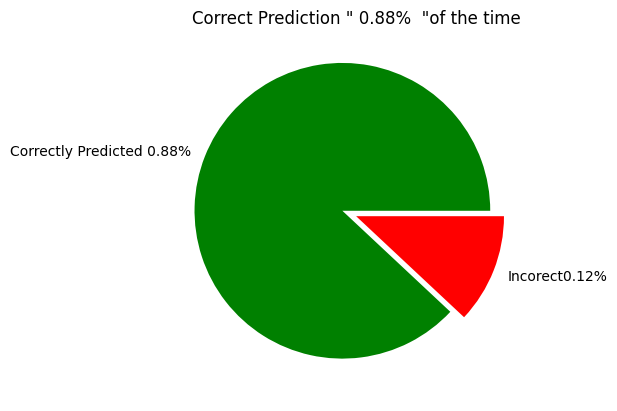

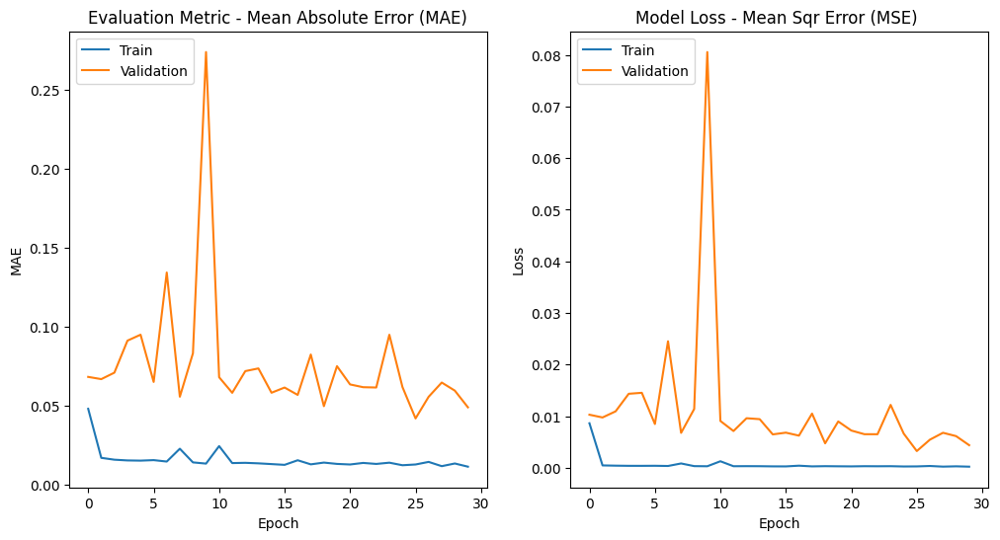

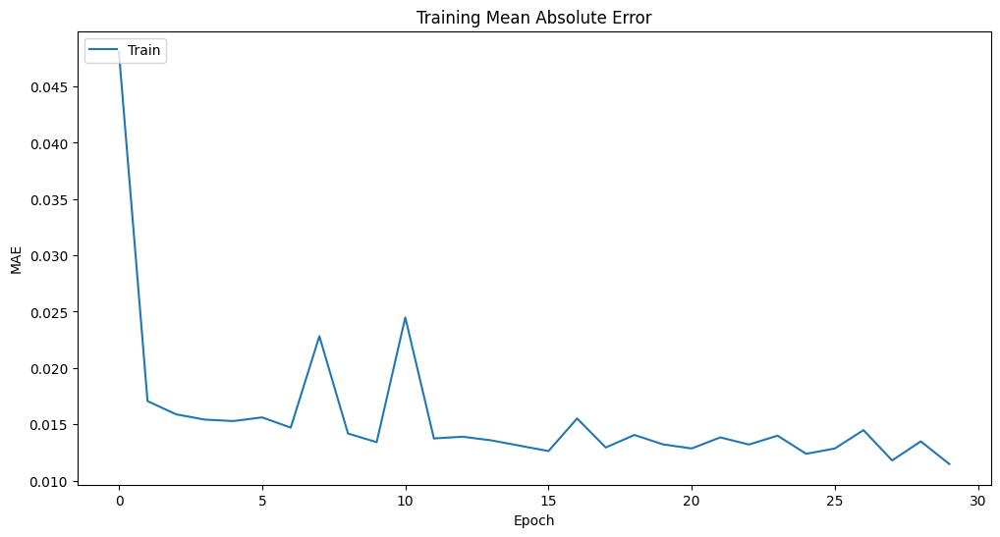

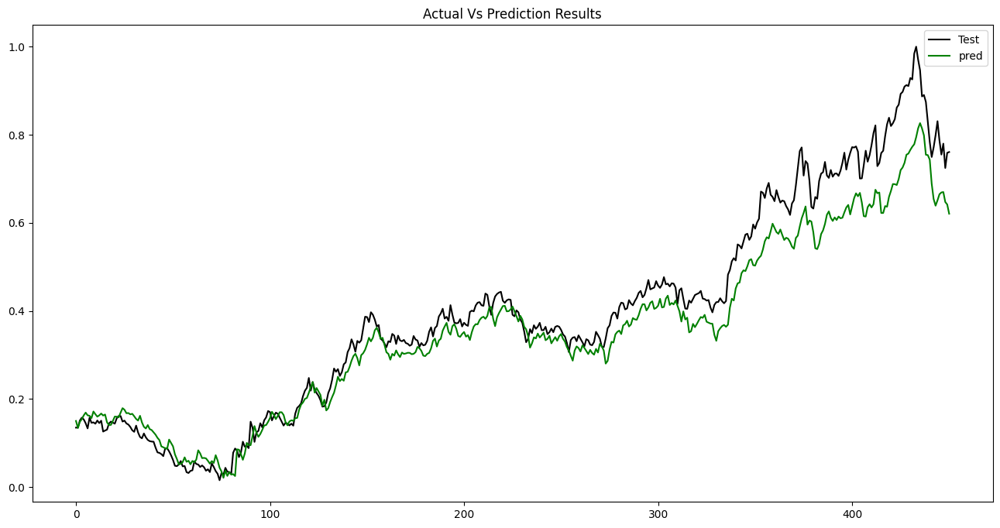

############################################################################
  Model Setup:
                    Name: XOM_F40_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 40
  Result Data:
             mean_abs_err =0.06771823888349973
             mean_sqr_err =0.007148070307956903
        root_mean_sqr_err =0.08454626134819271
           pred_diff_mean =0.8371665316471347
      pred_diff_bias_mean =0.16283346835286522
    pred_correctness_mean =0.7605321507760532



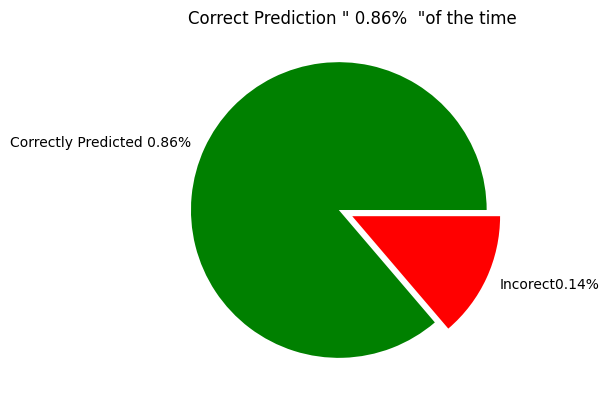

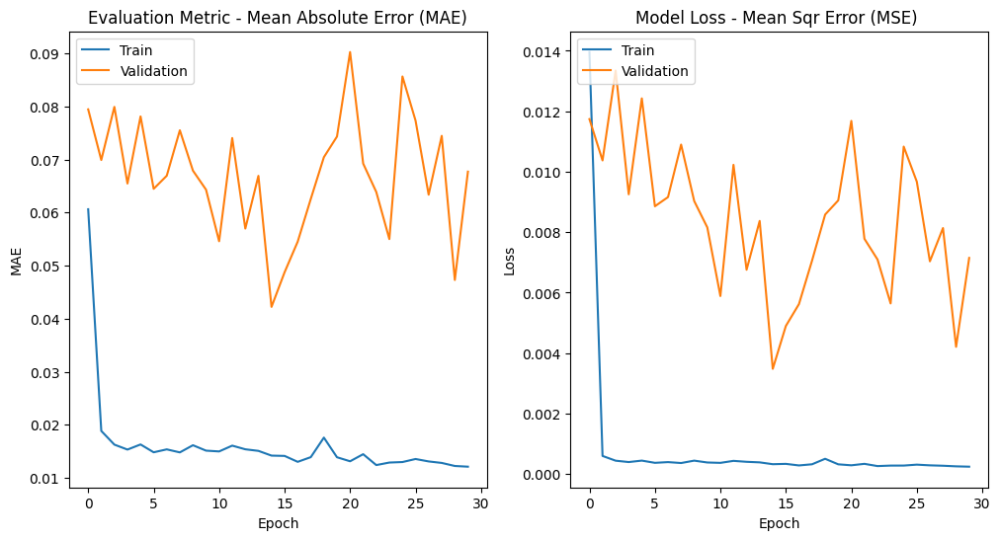

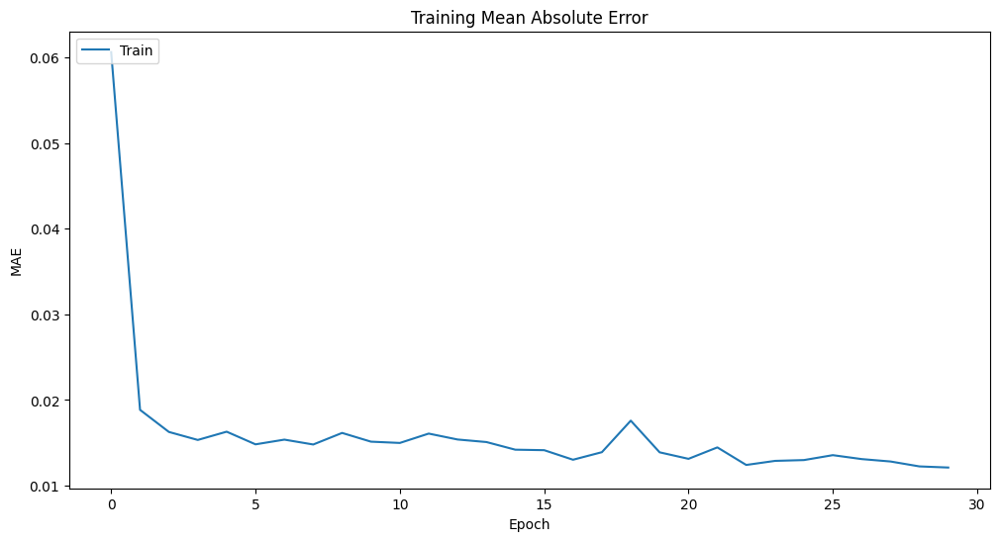

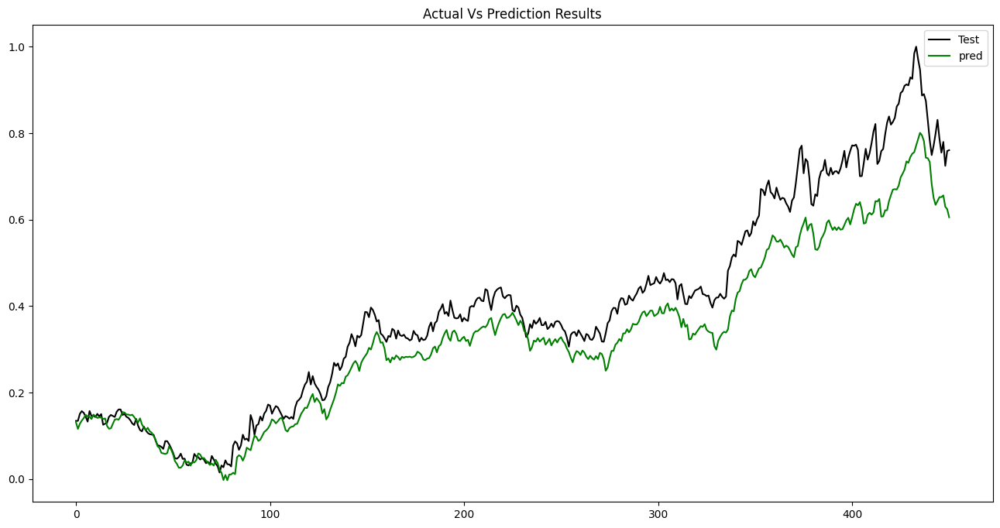

############################################################################
  Model Setup:
                    Name: XOM_F50_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 50
  Result Data:
             mean_abs_err =0.04787478248376869
             mean_sqr_err =0.004055360383759584
        root_mean_sqr_err =0.06368171153290075
           pred_diff_mean =0.9880890032390379
      pred_diff_bias_mean =0.011910996760962075
    pred_correctness_mean =0.910913140311804



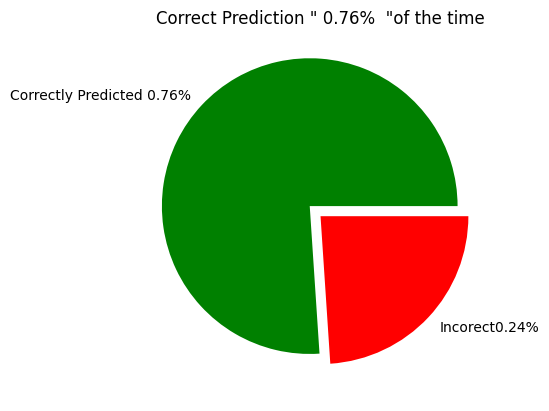

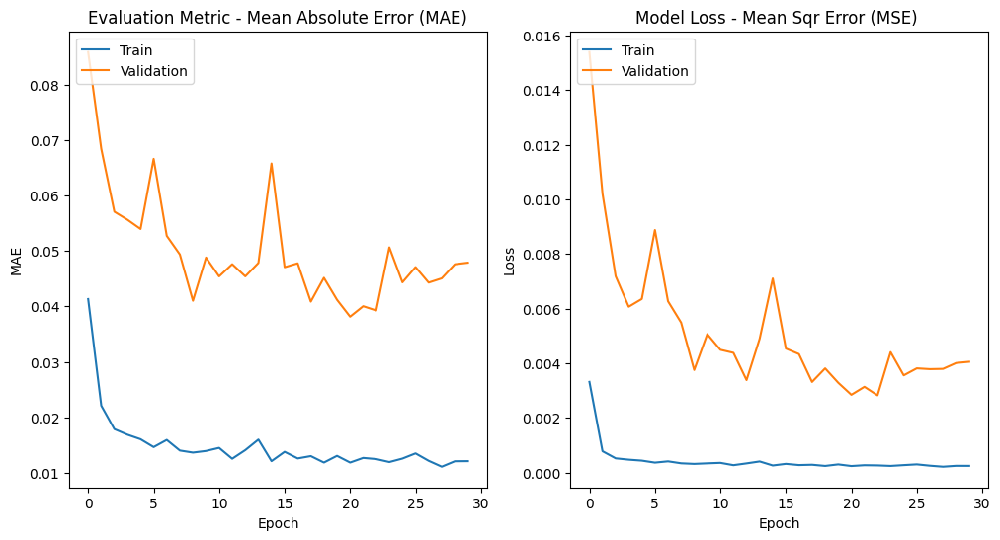

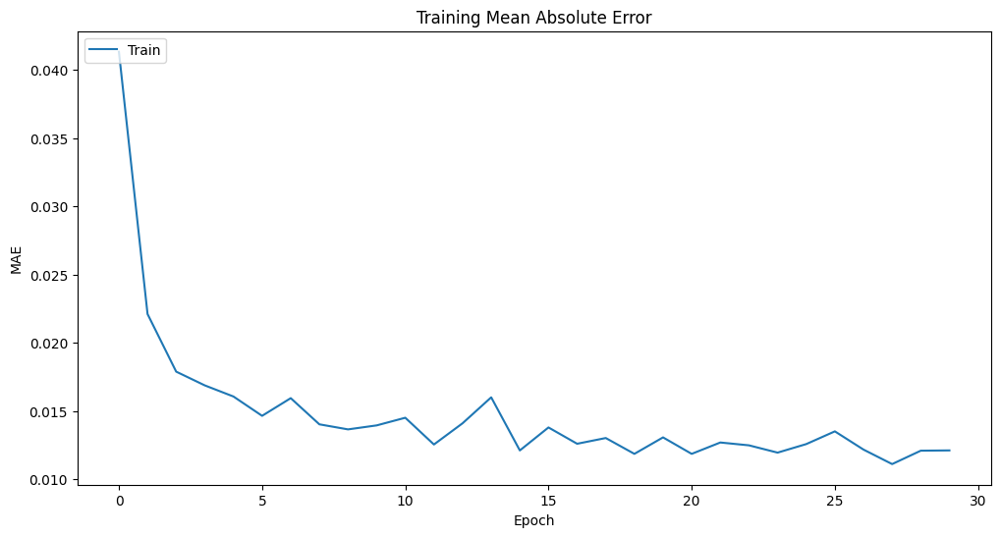

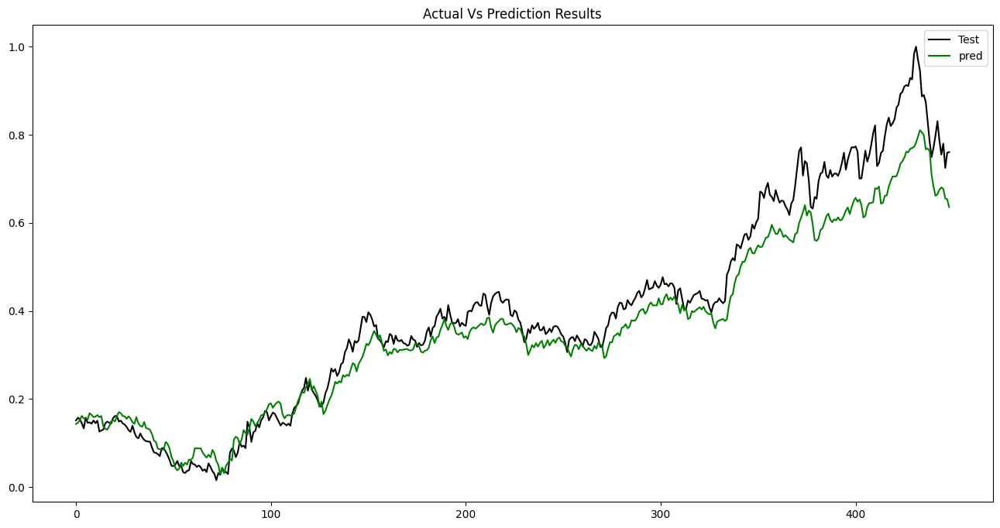

############################################################################
  Model Setup:
                    Name: XOM_F50_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 50
  Result Data:
             mean_abs_err =0.06529480548167098
             mean_sqr_err =0.006593870724895114
        root_mean_sqr_err =0.08120265220357716
           pred_diff_mean =0.8570738089403819
      pred_diff_bias_mean =0.14292619105961807
    pred_correctness_mean =0.8552338530066815



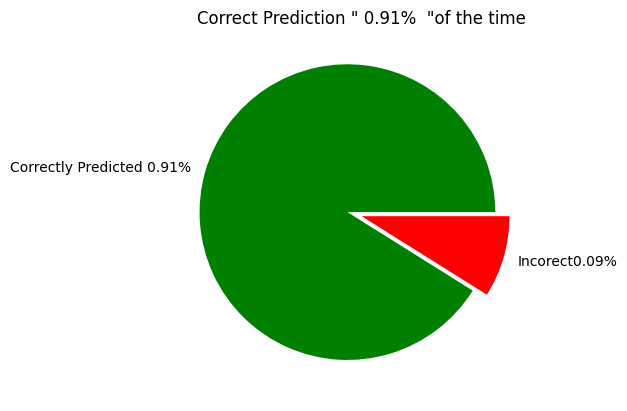

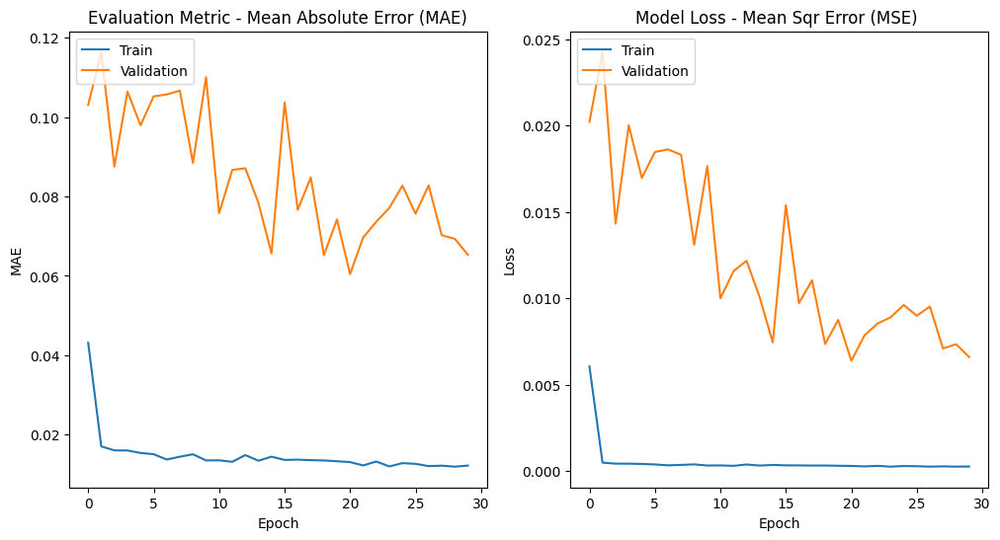

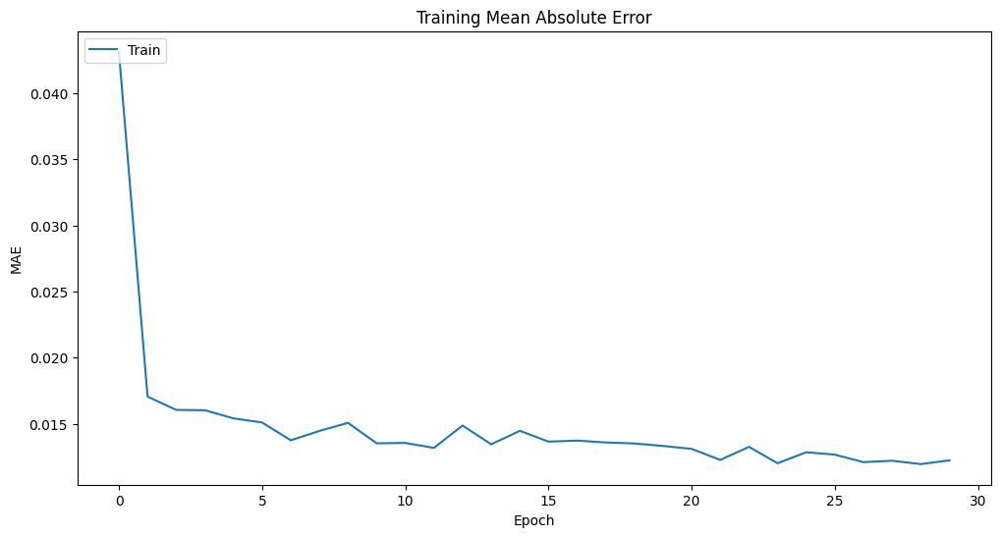

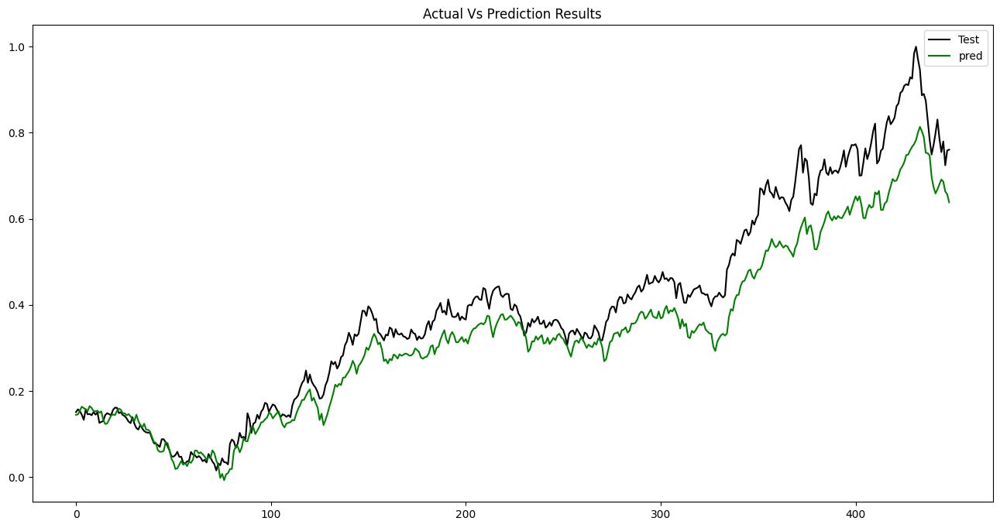

############################################################################
  Model Setup:
                    Name: XOM_F50_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 50
  Result Data:
             mean_abs_err =0.06628157046071231
             mean_sqr_err =0.006816750197352154
        root_mean_sqr_err =0.0825636130347513
           pred_diff_mean =0.8664708553226231
      pred_diff_bias_mean =0.13352914467737684
    pred_correctness_mean =0.8641425389755011



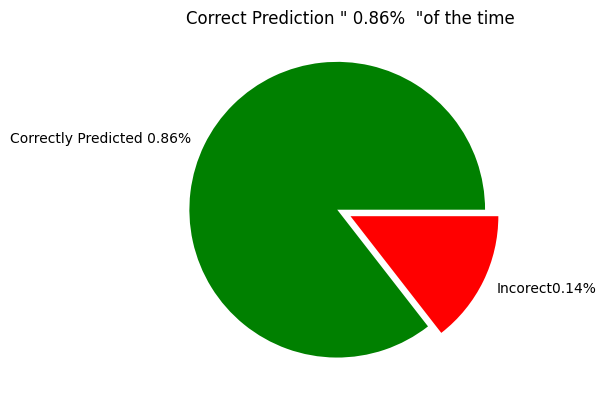

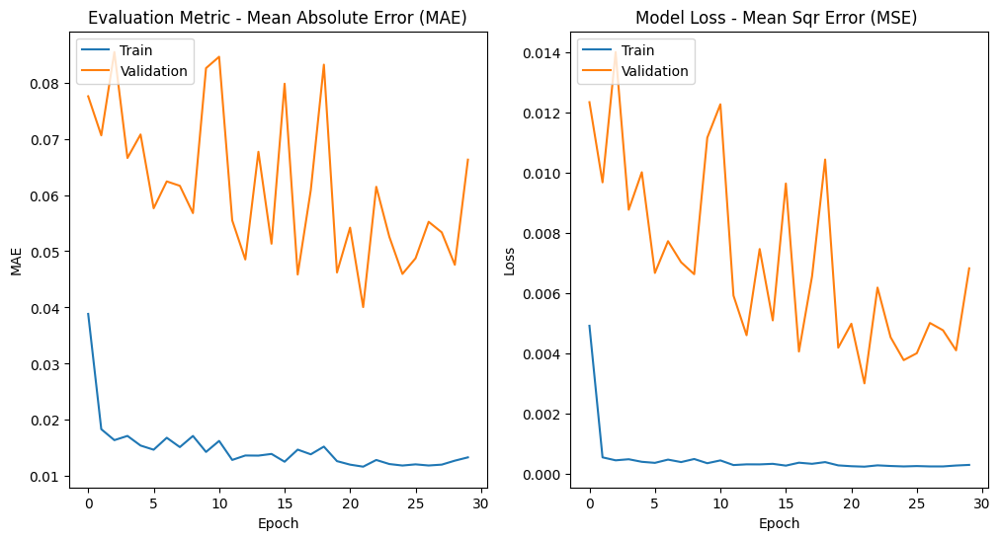

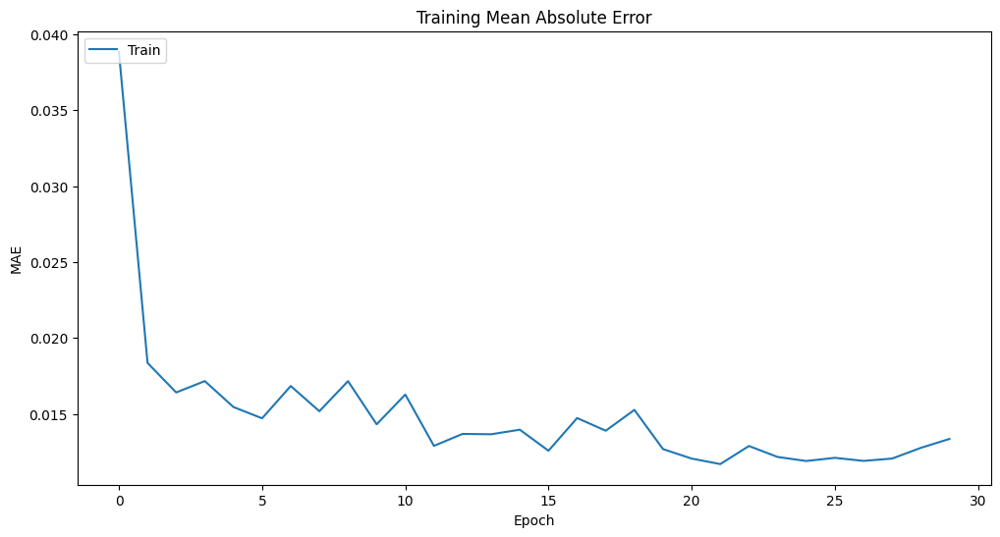

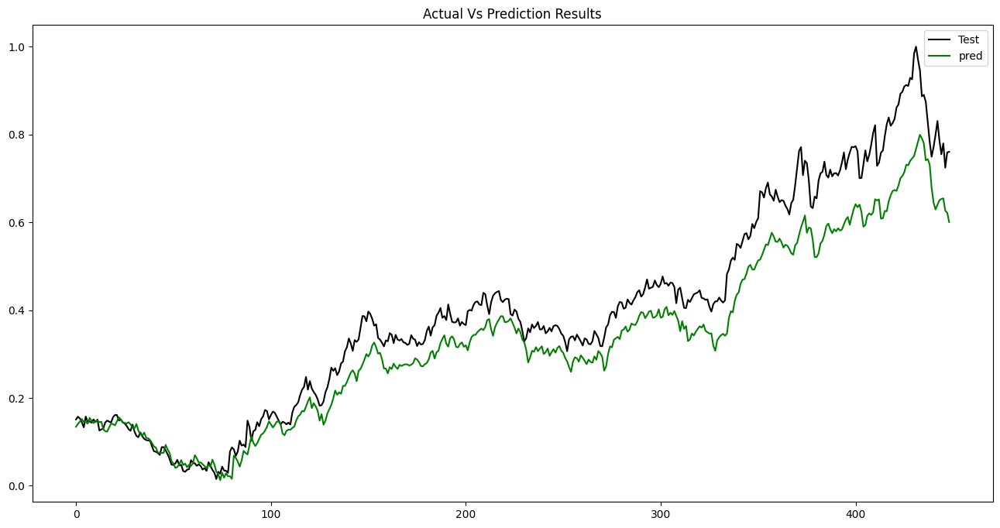

############################################################################
  Model Setup:
                    Name: XOM_F50_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 50
  Result Data:
             mean_abs_err =0.06495113811247356
             mean_sqr_err =0.006929039050829104
        root_mean_sqr_err =0.08324084965225369
           pred_diff_mean =0.9235467622725893
      pred_diff_bias_mean =0.07645323772741085
    pred_correctness_mean =0.8641425389755011



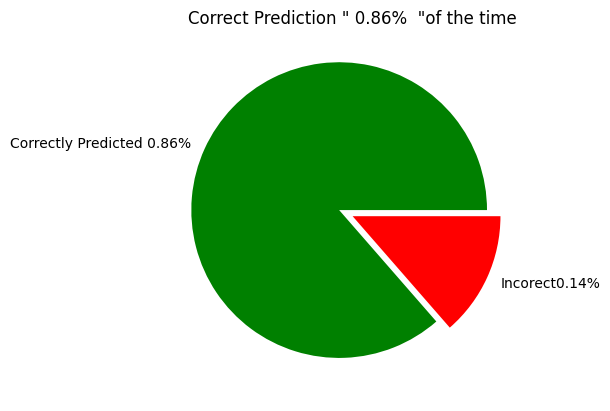

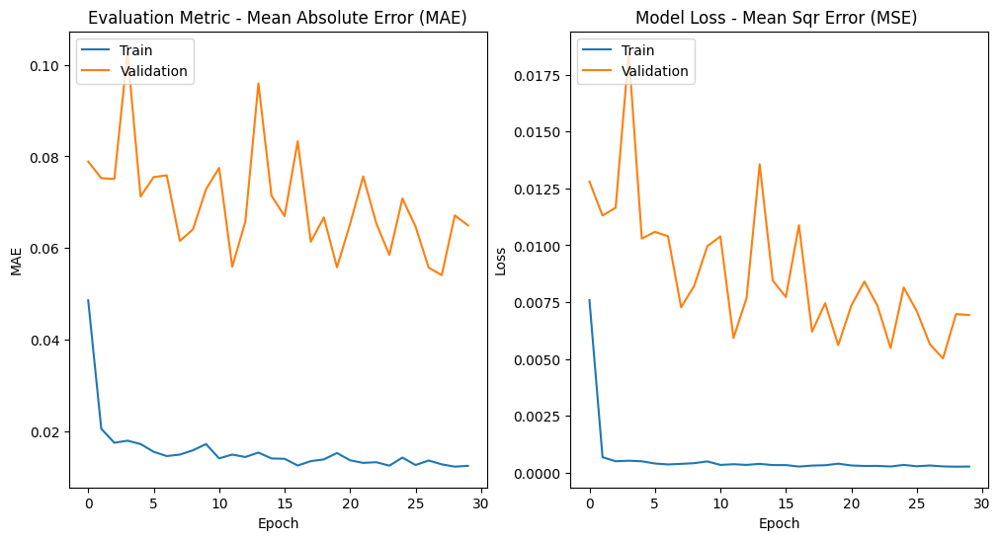

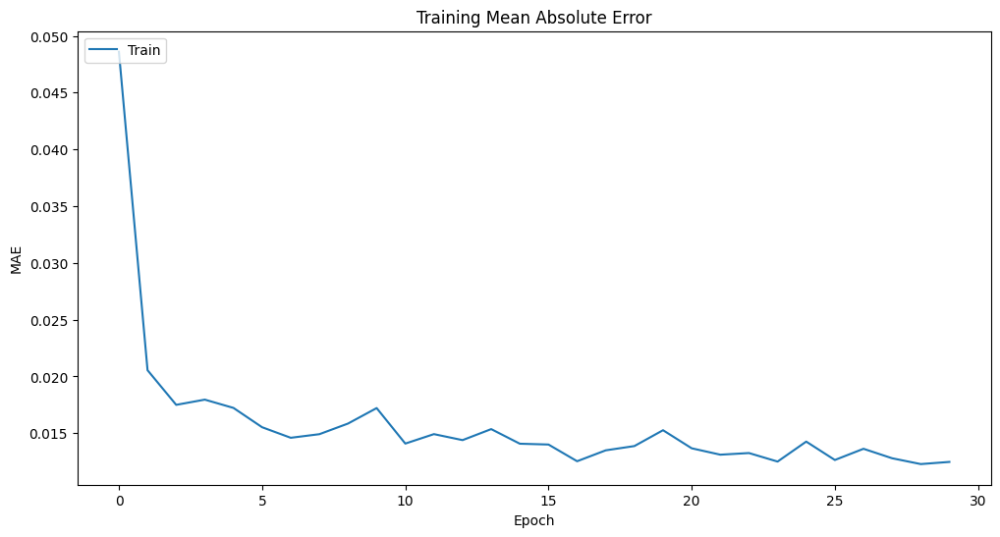

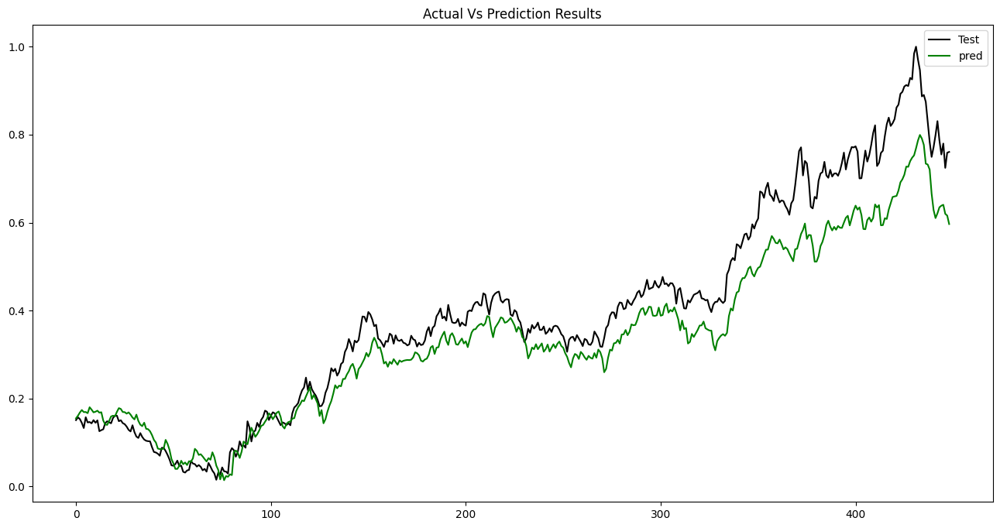

############################################################################
  Model Setup:
                    Name: XOM_F50_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 50
  Result Data:
             mean_abs_err =0.064080822454564
             mean_sqr_err =0.006354197584141682
        root_mean_sqr_err =0.07971322088676183
           pred_diff_mean =0.8417336326972303
      pred_diff_bias_mean =0.15826636730276963
    pred_correctness_mean =0.8708240534521158



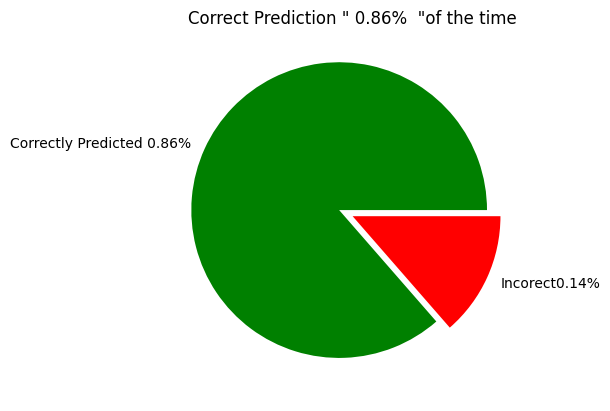

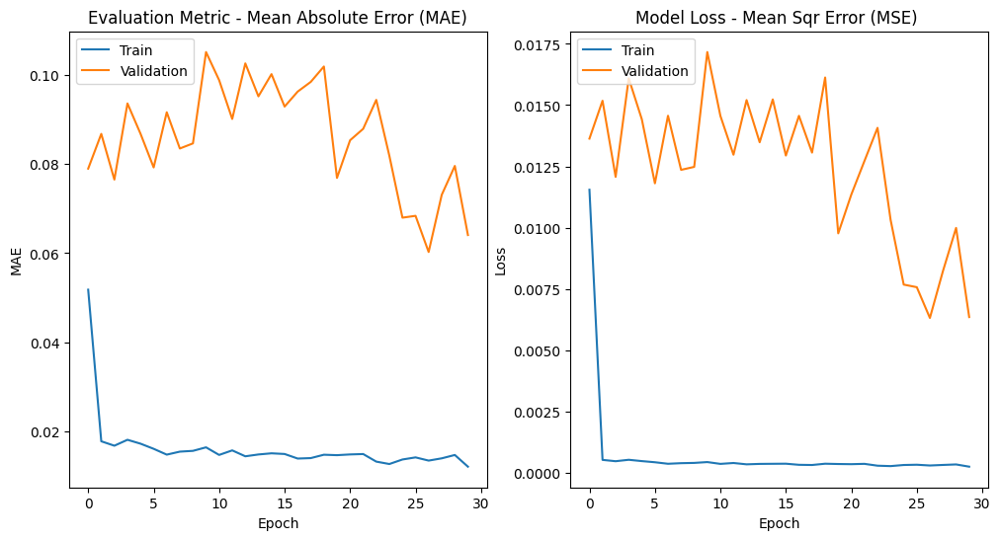

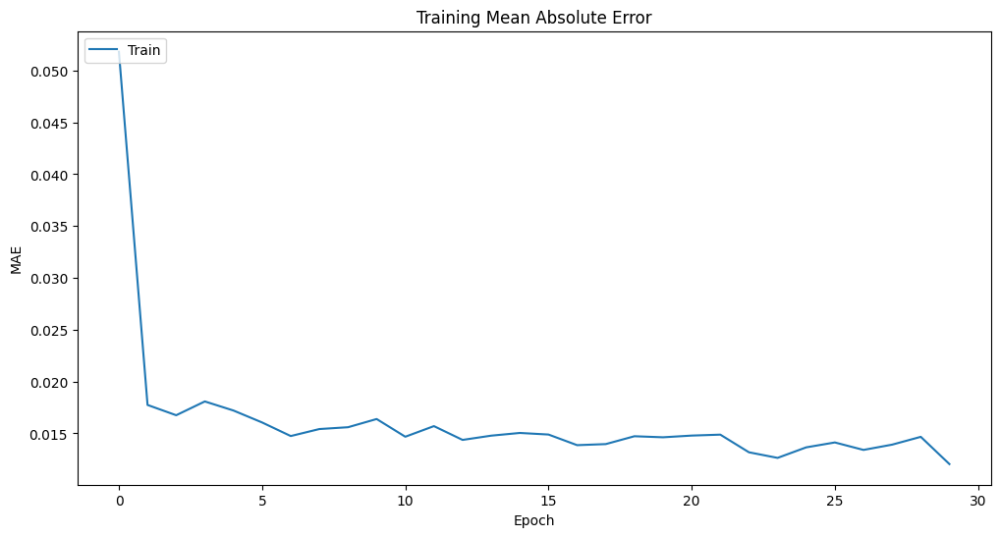

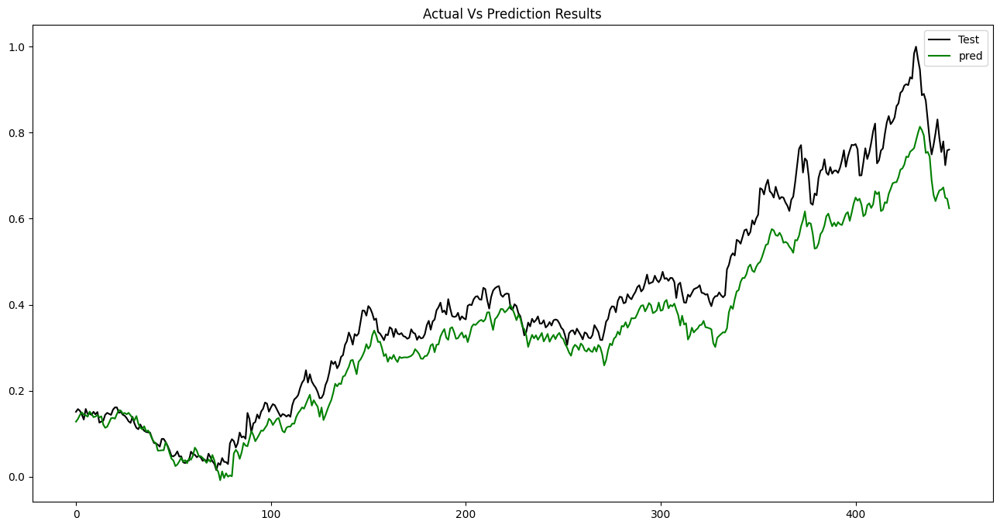

############################################################################
  Model Setup:
                    Name: XOM_F70_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 70
  Result Data:
             mean_abs_err =0.0775629770690043
             mean_sqr_err =0.010431353284349385
        root_mean_sqr_err =0.10213399671191462
           pred_diff_mean =0.7942514333029417
      pred_diff_bias_mean =0.20574856669705827
    pred_correctness_mean =0.8359550561797753



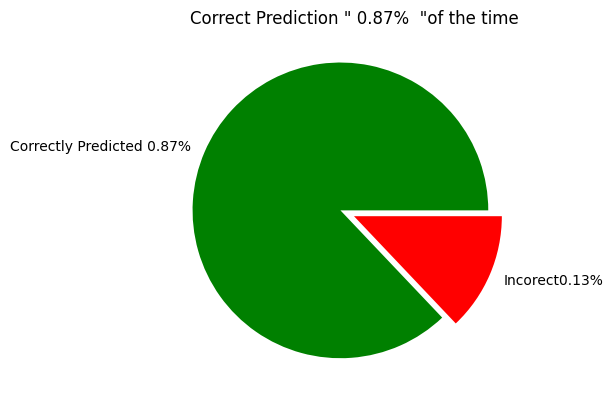

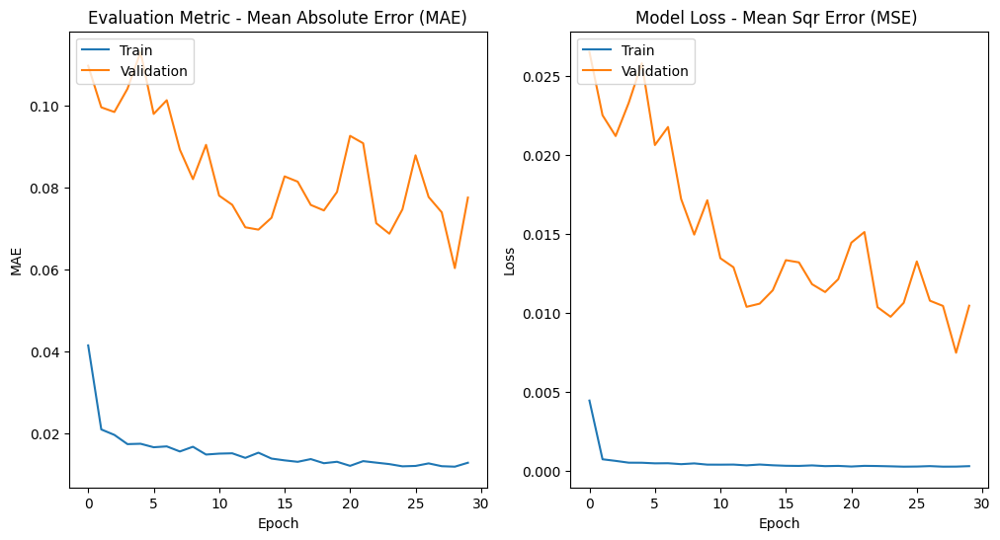

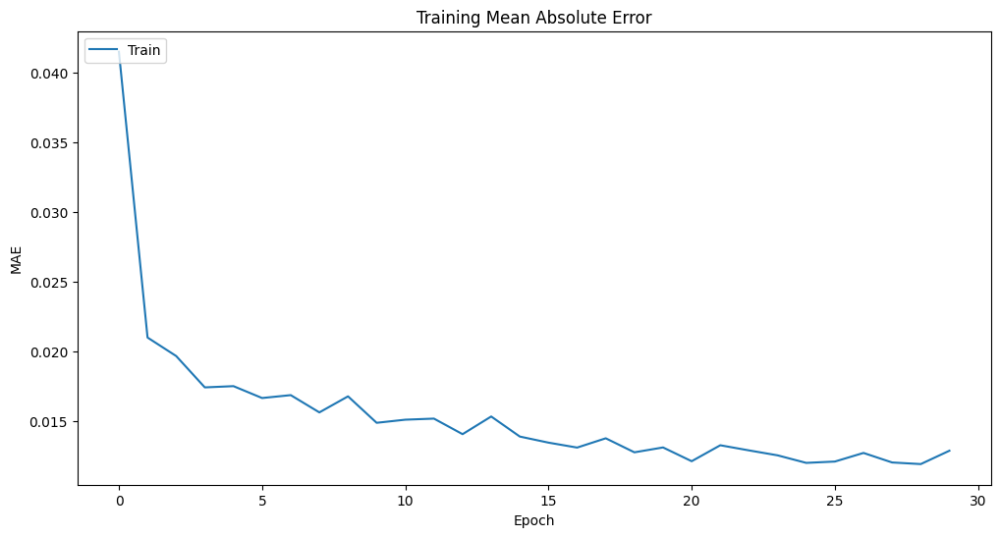

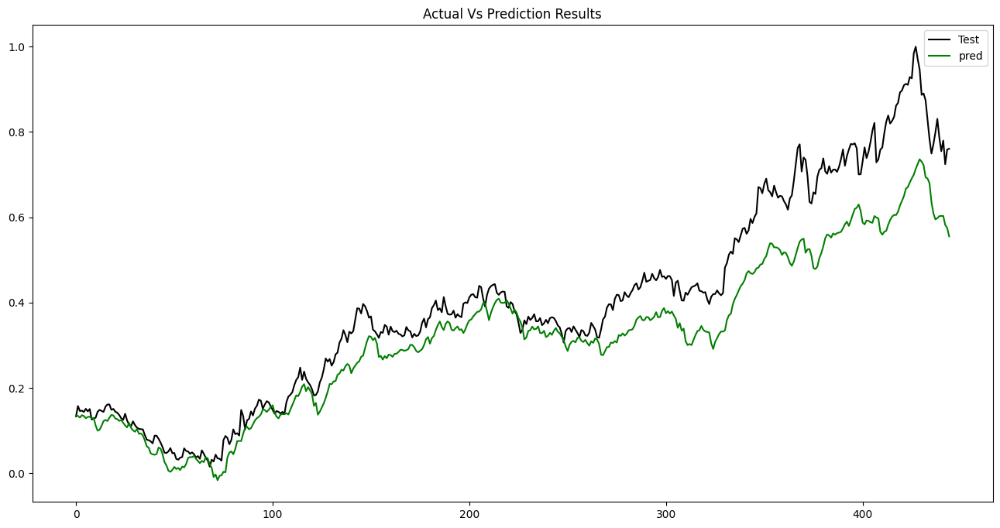

############################################################################
  Model Setup:
                    Name: XOM_F70_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 70
  Result Data:
             mean_abs_err =0.12343596870121827
             mean_sqr_err =0.021296059099032334
        root_mean_sqr_err =0.14593169326445962
           pred_diff_mean =0.6996825482241599
      pred_diff_bias_mean =0.30031745177584007
    pred_correctness_mean =0.701123595505618



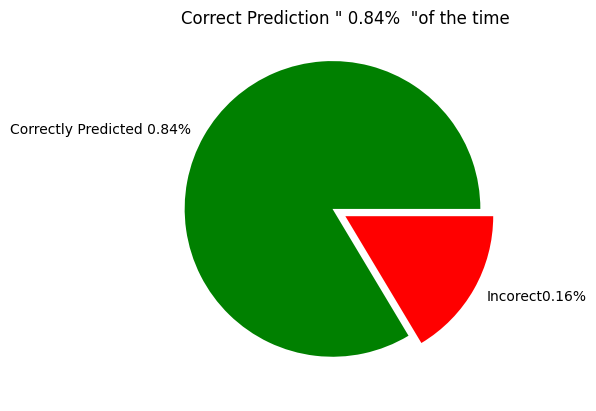

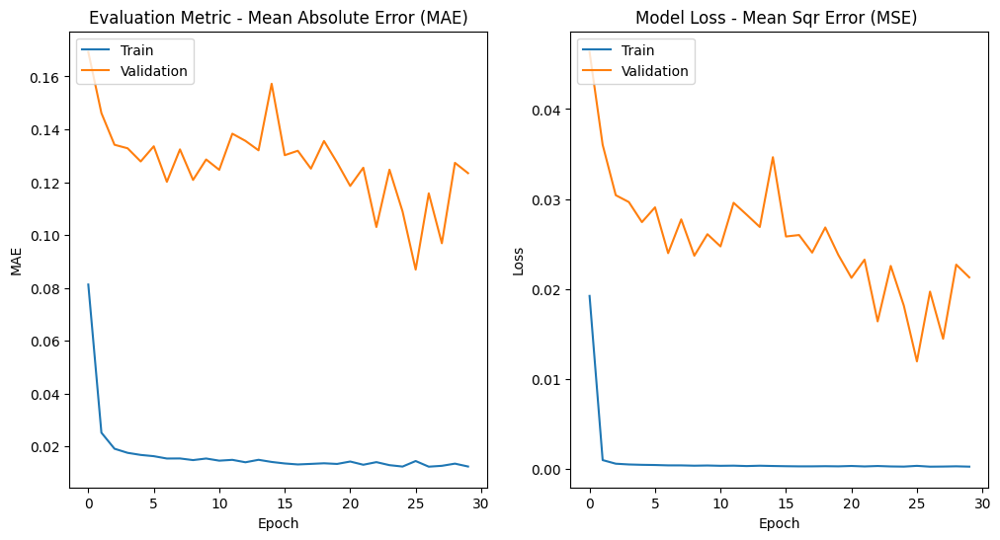

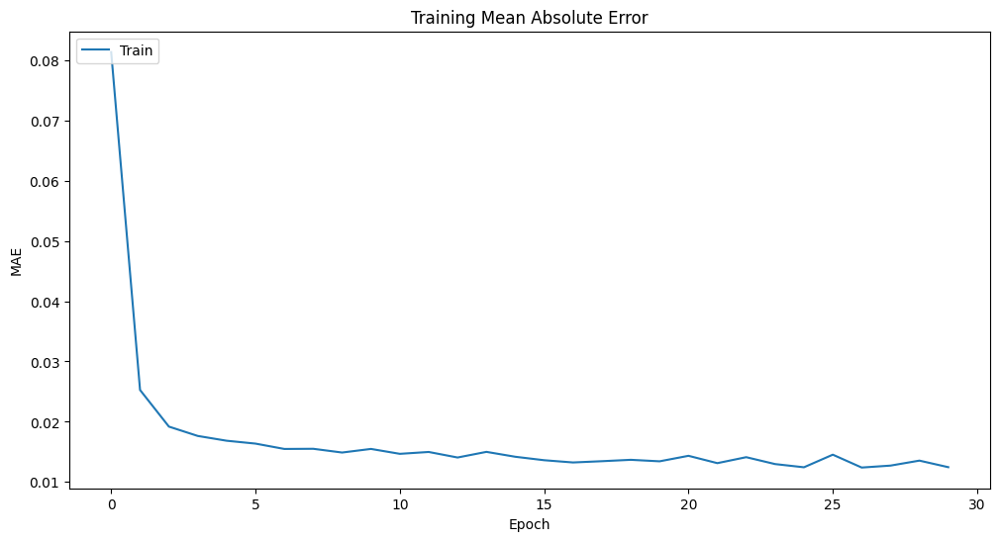

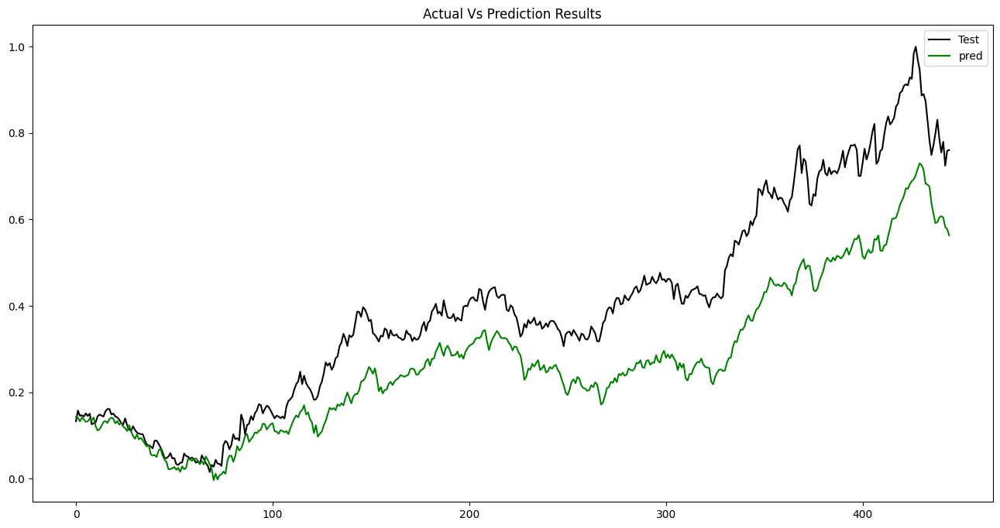

############################################################################
  Model Setup:
                    Name: XOM_F70_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 70
  Result Data:
             mean_abs_err =0.04258241519177397
             mean_sqr_err =0.00347501185221362
        root_mean_sqr_err =0.05894923114183611
           pred_diff_mean =1.0663898683096558
      pred_diff_bias_mean =-0.06638986830965571
    pred_correctness_mean =0.9348314606741573



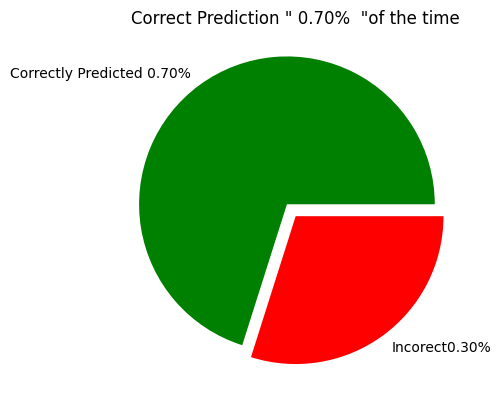

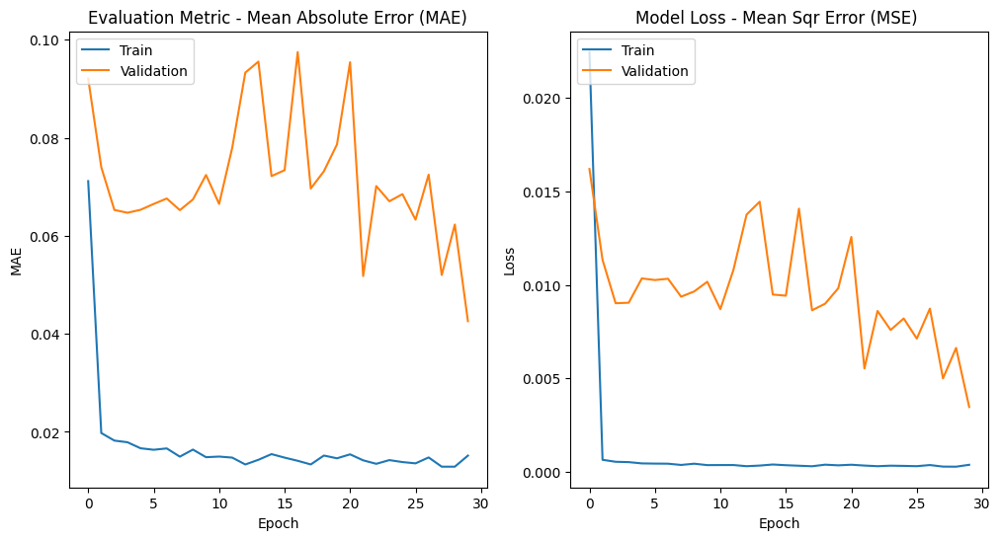

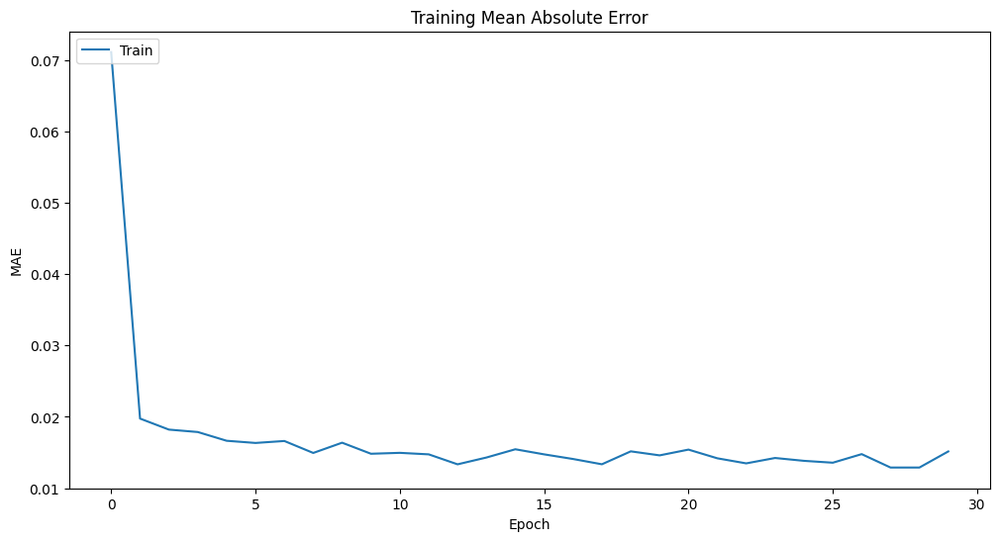

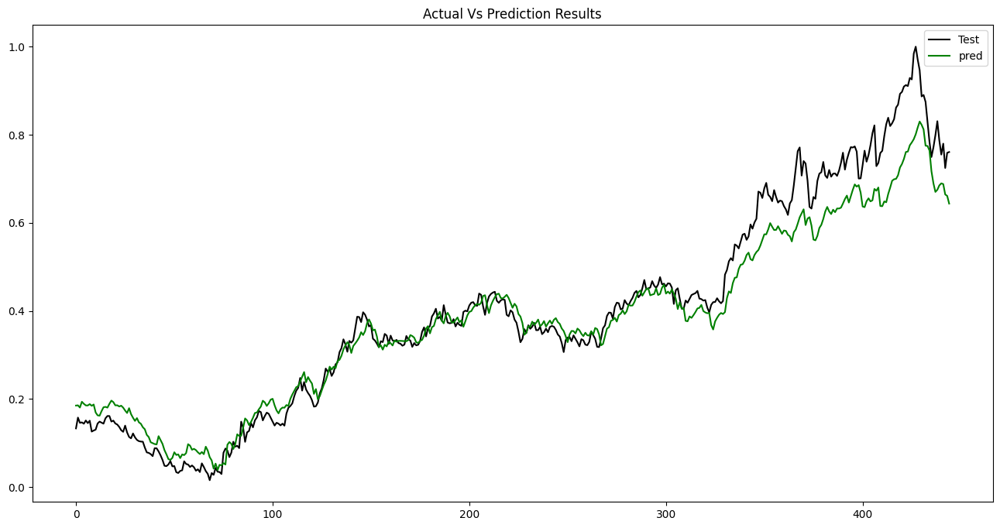

############################################################################
  Model Setup:
                    Name: XOM_F70_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 70
  Result Data:
             mean_abs_err =0.0673517082246551
             mean_sqr_err =0.007222025243664733
        root_mean_sqr_err =0.08498249963177557
           pred_diff_mean =0.8797821133899226
      pred_diff_bias_mean =0.12021788661007737
    pred_correctness_mean =0.8629213483146068



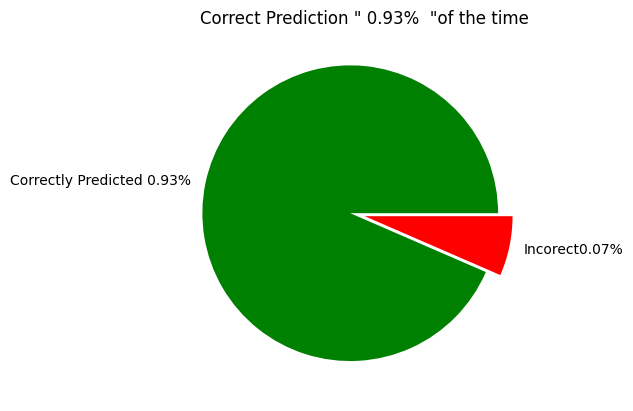

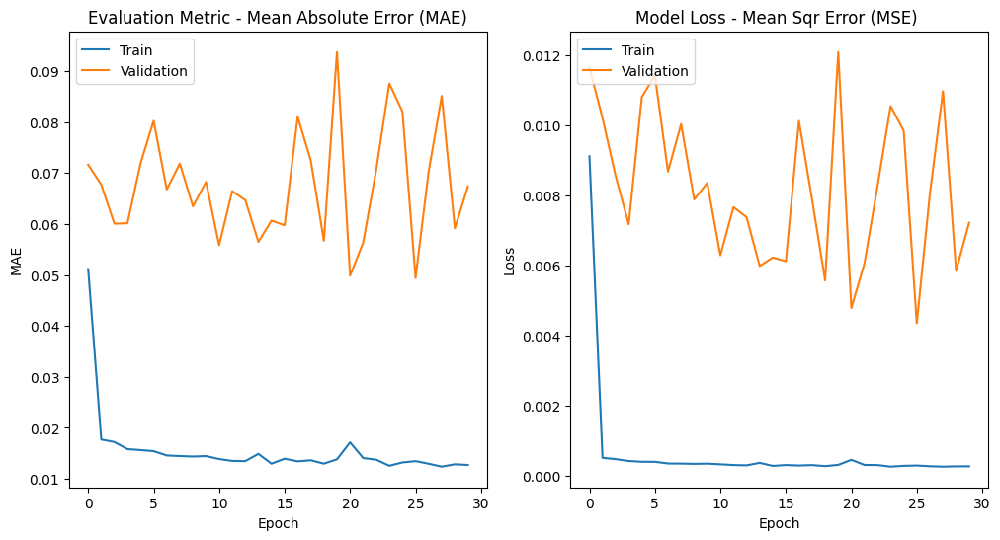

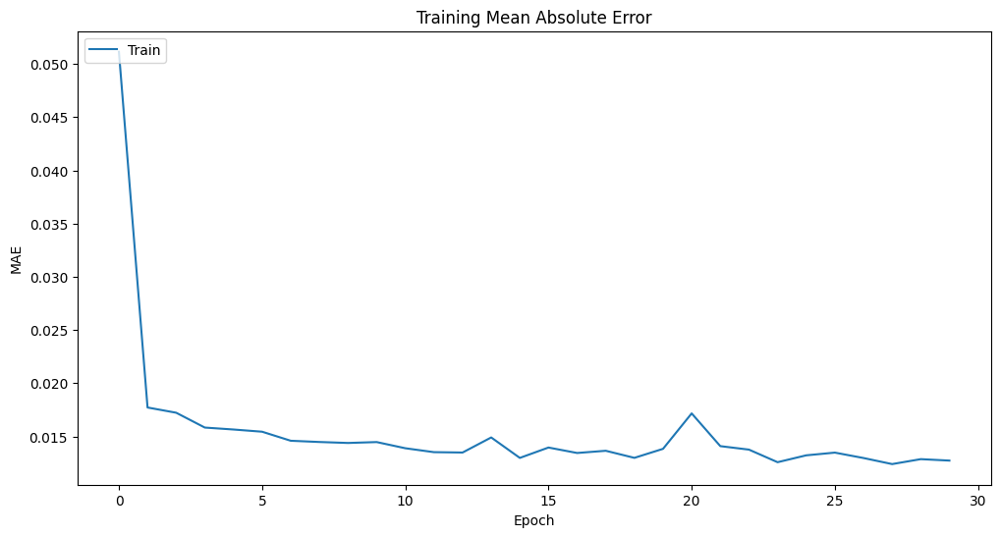

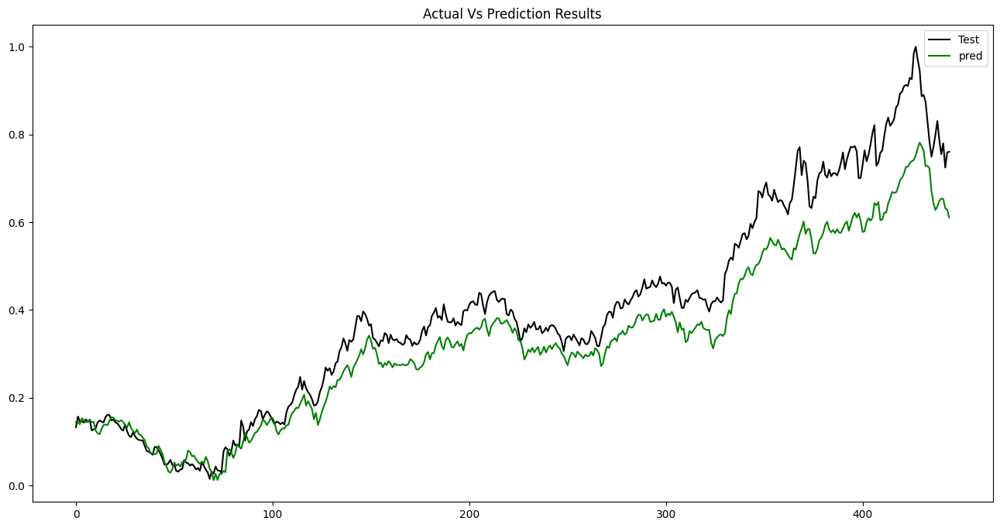

############################################################################
  Model Setup:
                    Name: XOM_F70_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 70
  Result Data:
             mean_abs_err =0.0536905358904696
             mean_sqr_err =0.005023537157924645
        root_mean_sqr_err =0.07087691555030202
           pred_diff_mean =0.9269420802196001
      pred_diff_bias_mean =0.07305791978039987
    pred_correctness_mean =0.9011235955056179



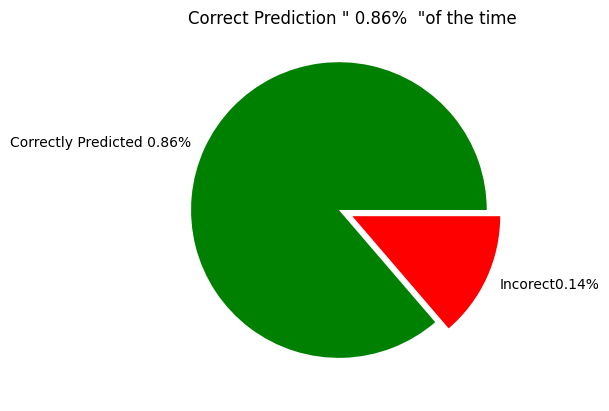

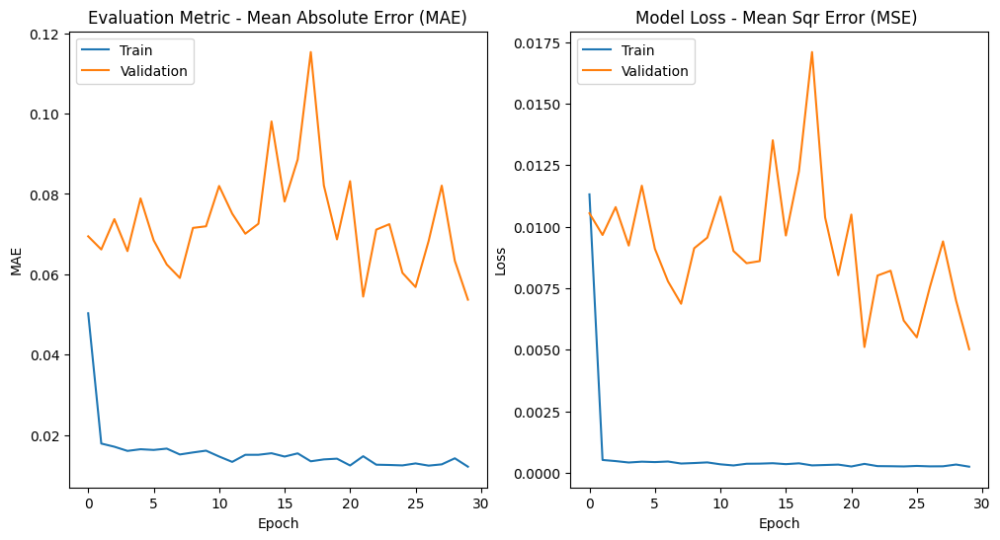

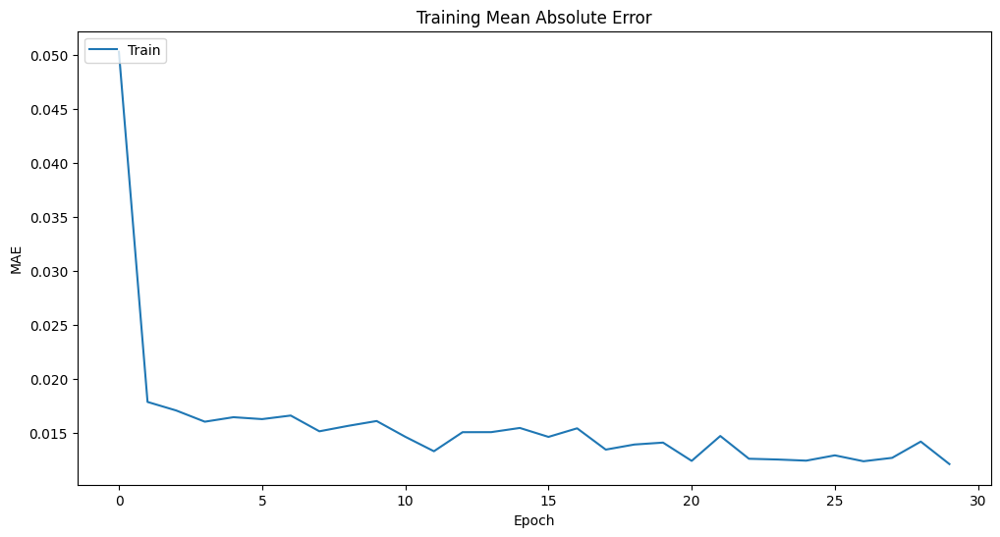

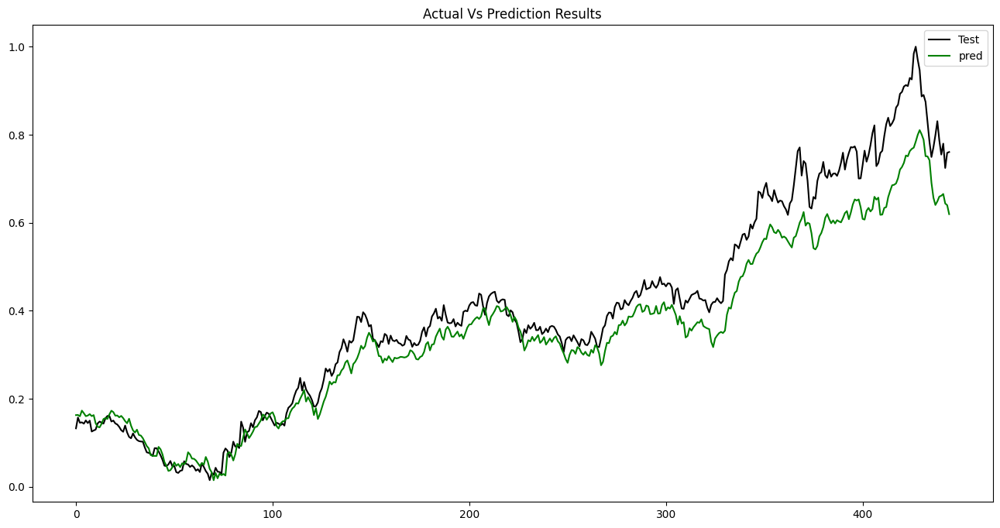

############################################################################
  Model Setup:
                    Name: XOM_F80_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 80
  Result Data:
             mean_abs_err =0.062432020398597105
             mean_sqr_err =0.006385845420389775
        root_mean_sqr_err =0.07991148490917795
           pred_diff_mean =0.8832203640922235
      pred_diff_bias_mean =0.11677963590777657
    pred_correctness_mean =0.8148984198645598



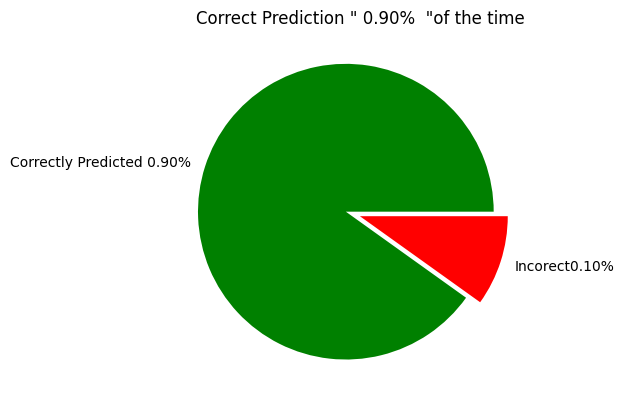

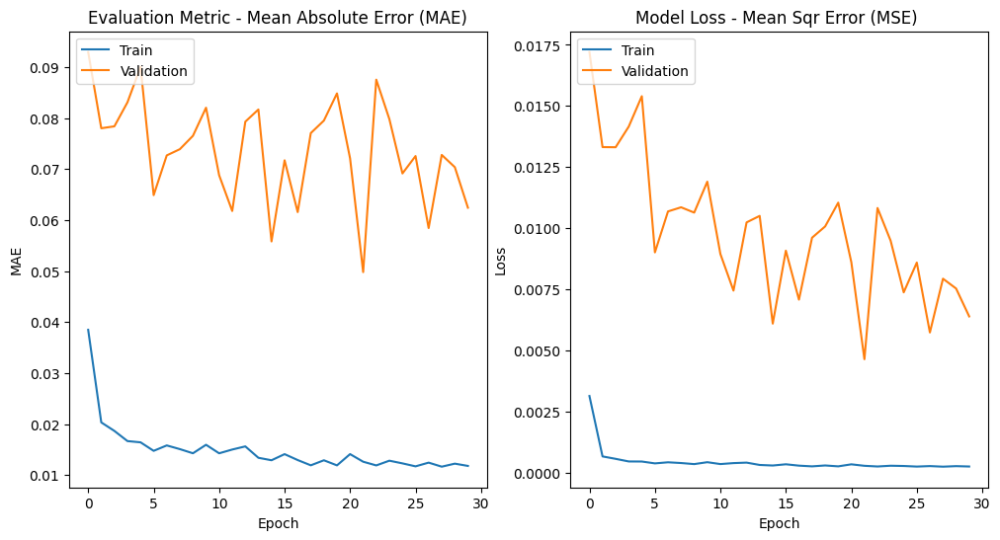

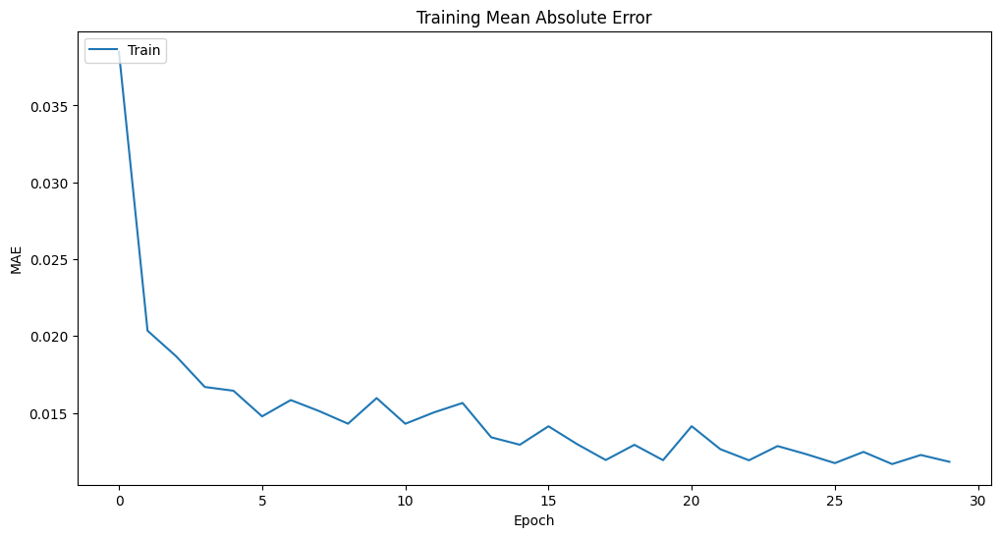

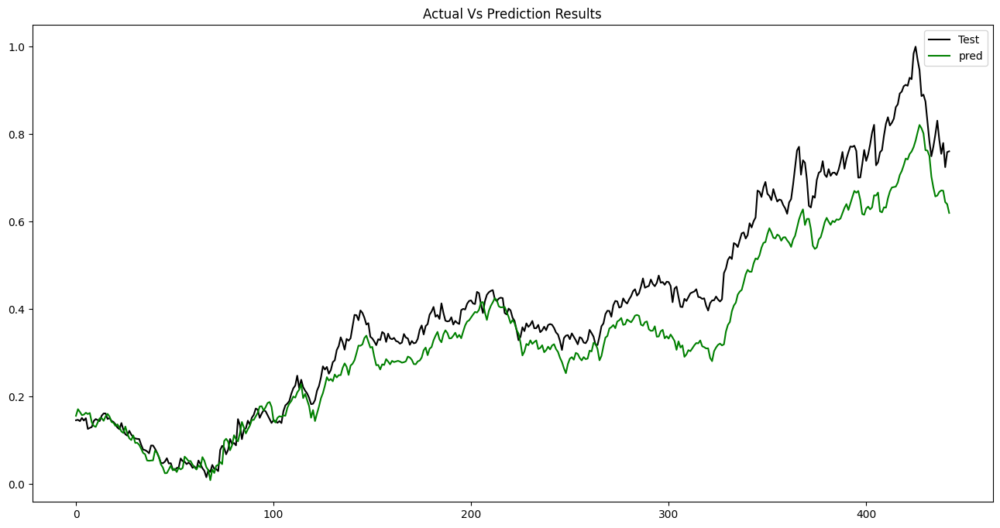

############################################################################
  Model Setup:
                    Name: XOM_F80_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 80
  Result Data:
             mean_abs_err =0.0707254832911315
             mean_sqr_err =0.007709657185995417
        root_mean_sqr_err =0.08780465355546604
           pred_diff_mean =0.8836373016532217
      pred_diff_bias_mean =0.11636269834677834
    pred_correctness_mean =0.8329571106094809



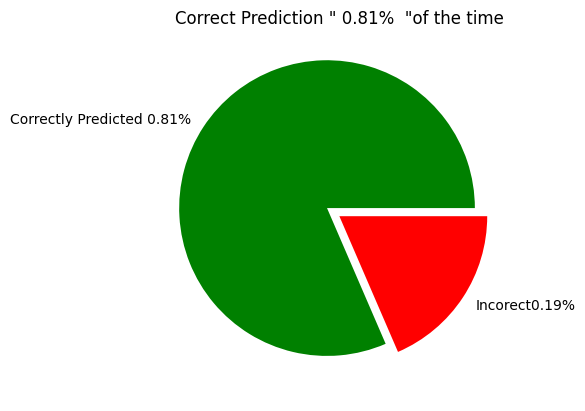

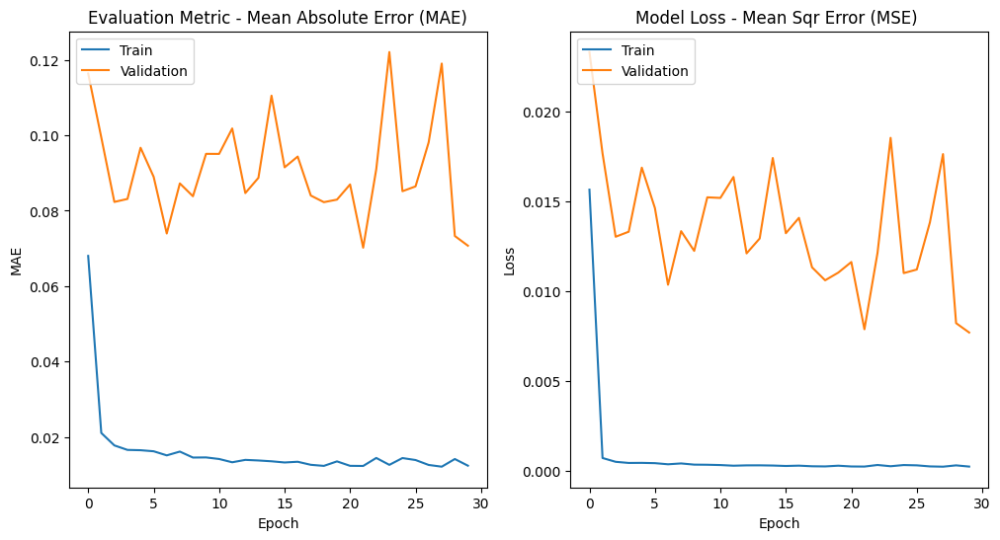

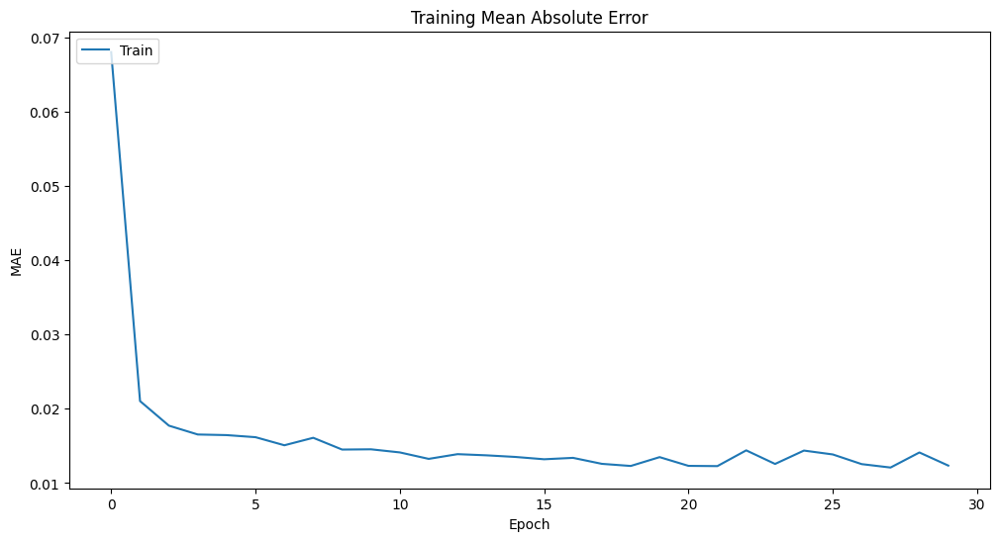

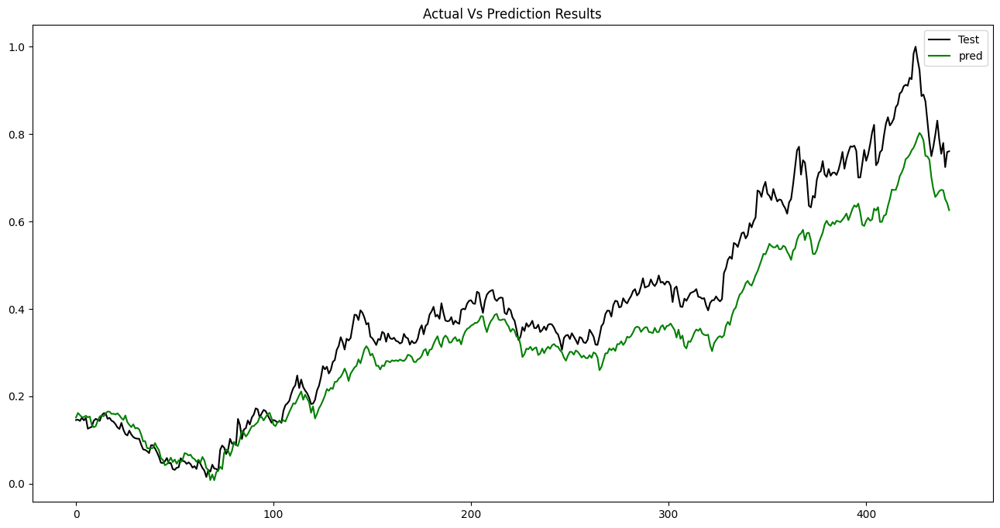

############################################################################
  Model Setup:
                    Name: XOM_F80_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 80
  Result Data:
             mean_abs_err =0.04827001241410688
             mean_sqr_err =0.004237000582340059
        root_mean_sqr_err =0.0650922467144902
           pred_diff_mean =0.9296713646627224
      pred_diff_bias_mean =0.0703286353372777
    pred_correctness_mean =0.8803611738148984



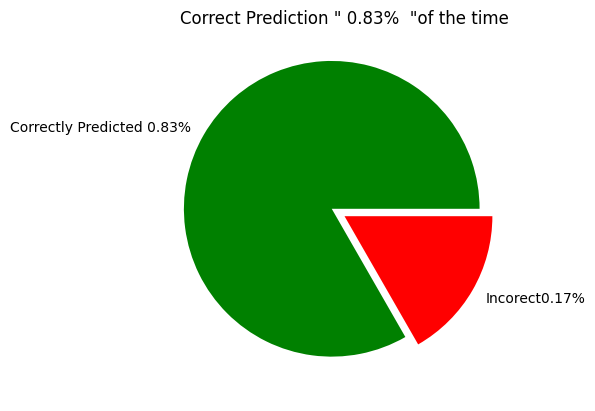

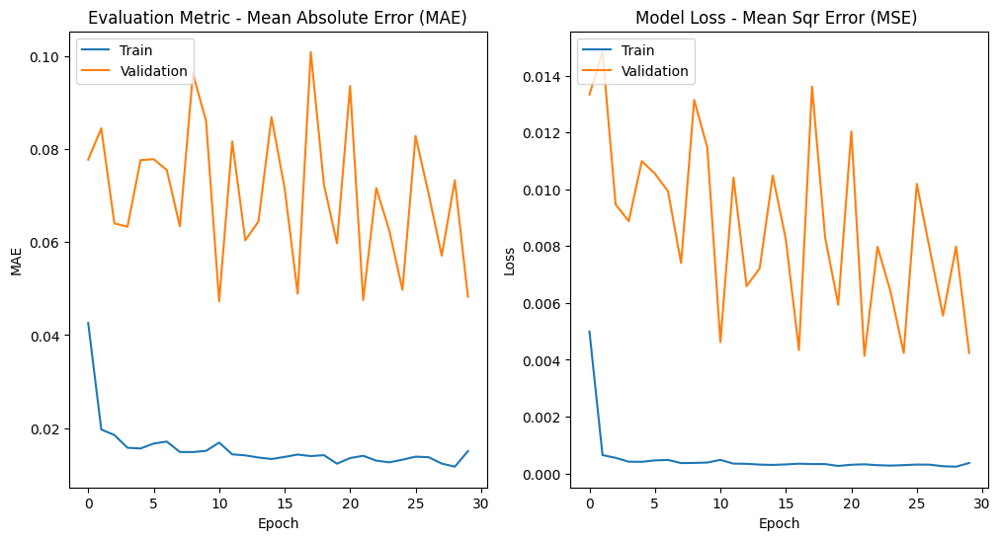

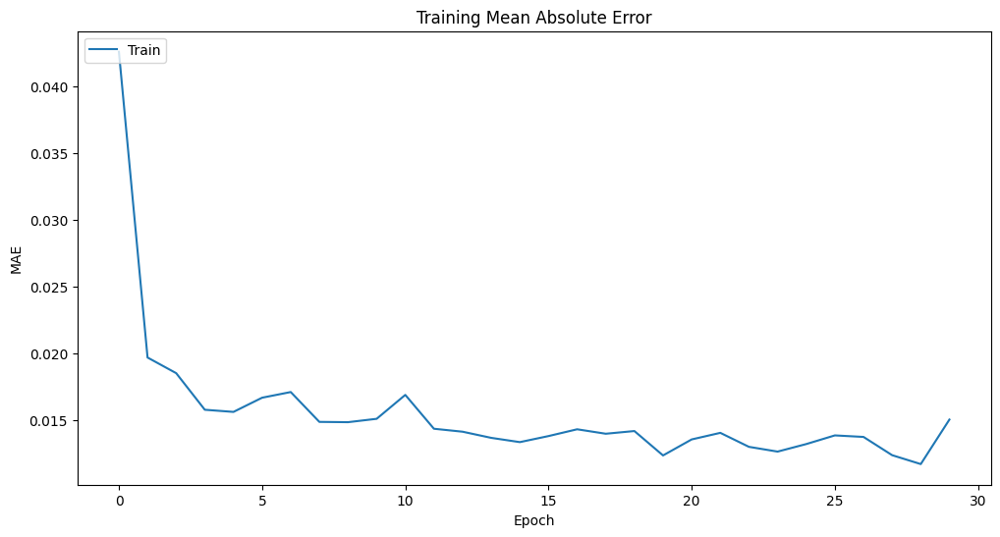

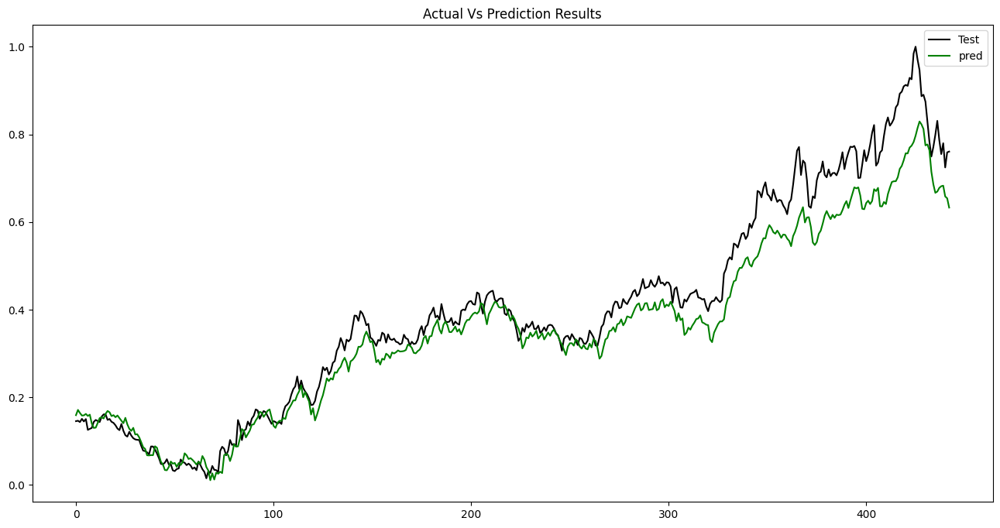

############################################################################
  Model Setup:
                    Name: XOM_F80_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 80
  Result Data:
             mean_abs_err =0.0576746210160454
             mean_sqr_err =0.006409034437133786
        root_mean_sqr_err =0.08005644531912334
           pred_diff_mean =0.9769741671476582
      pred_diff_bias_mean =0.02302583285234179
    pred_correctness_mean =0.8577878103837472



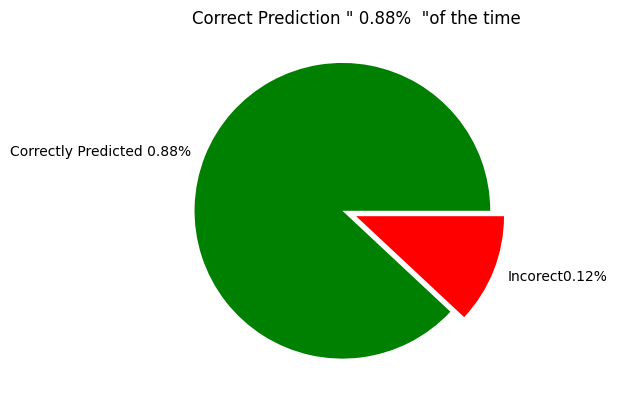

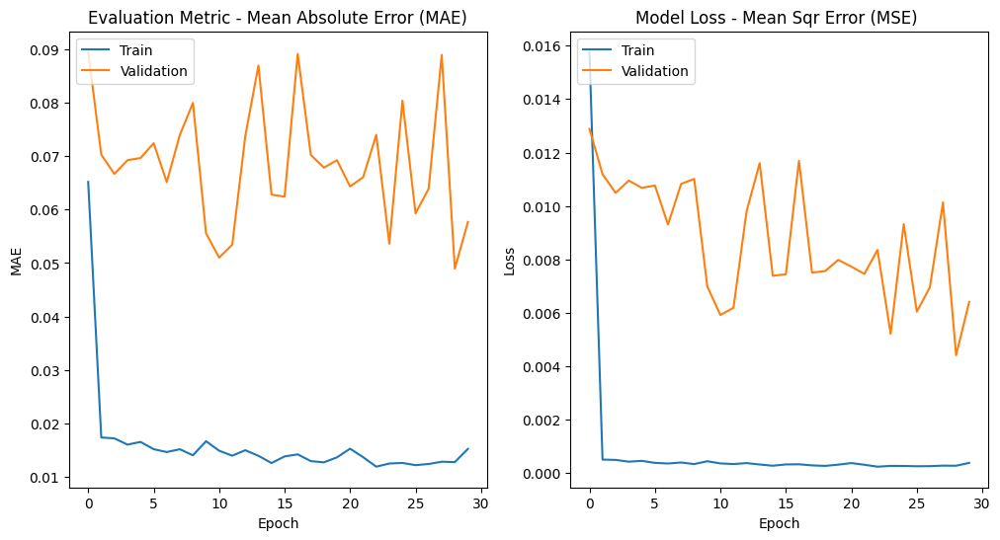

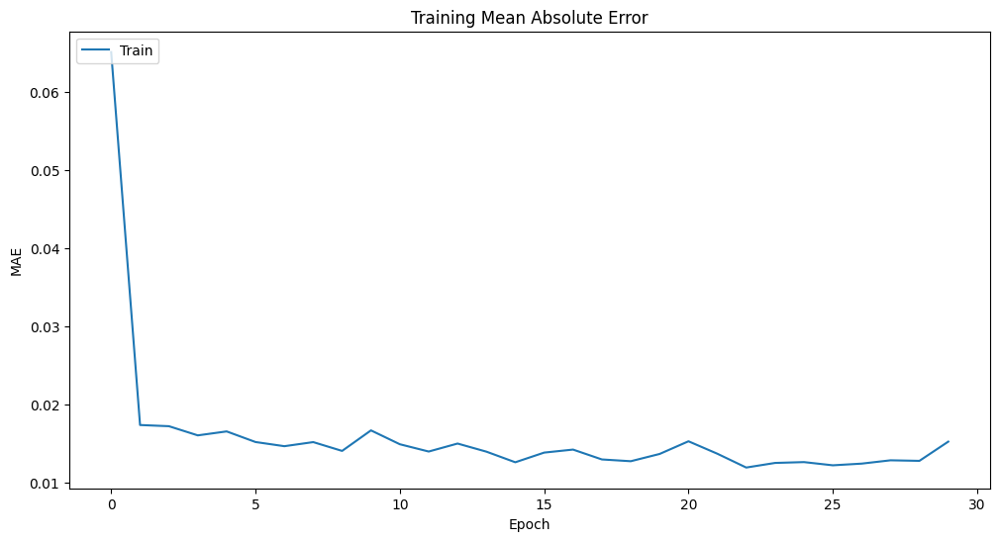

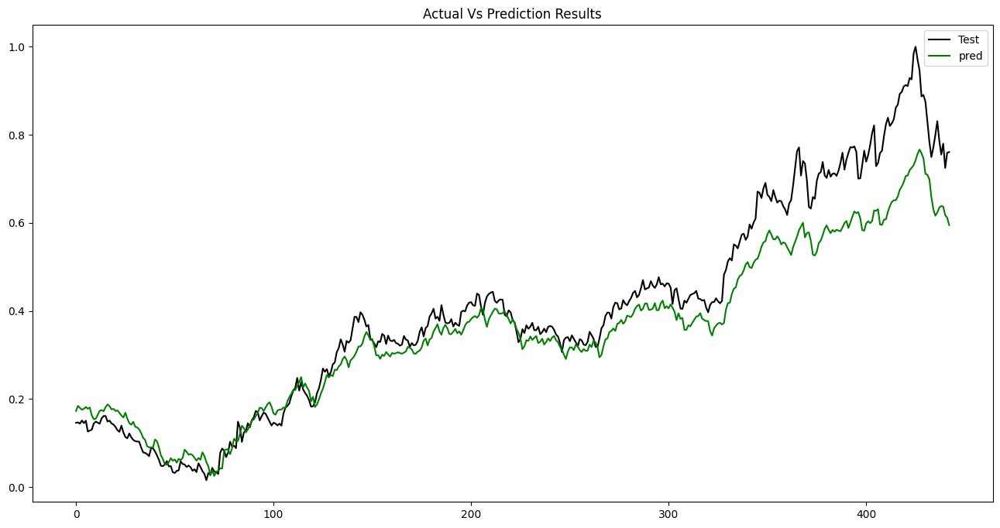

############################################################################
  Model Setup:
                    Name: XOM_F80_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 80
  Result Data:
             mean_abs_err =0.09784196646786618
             mean_sqr_err =0.014160489733762638
        root_mean_sqr_err =0.11899785600489883
           pred_diff_mean =0.7673577115397117
      pred_diff_bias_mean =0.2326422884602884
    pred_correctness_mean =0.781038374717833



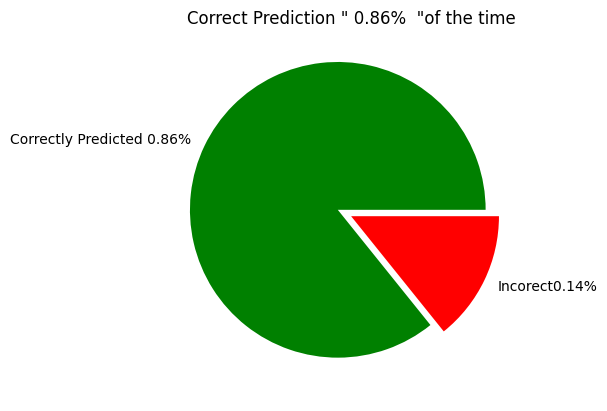

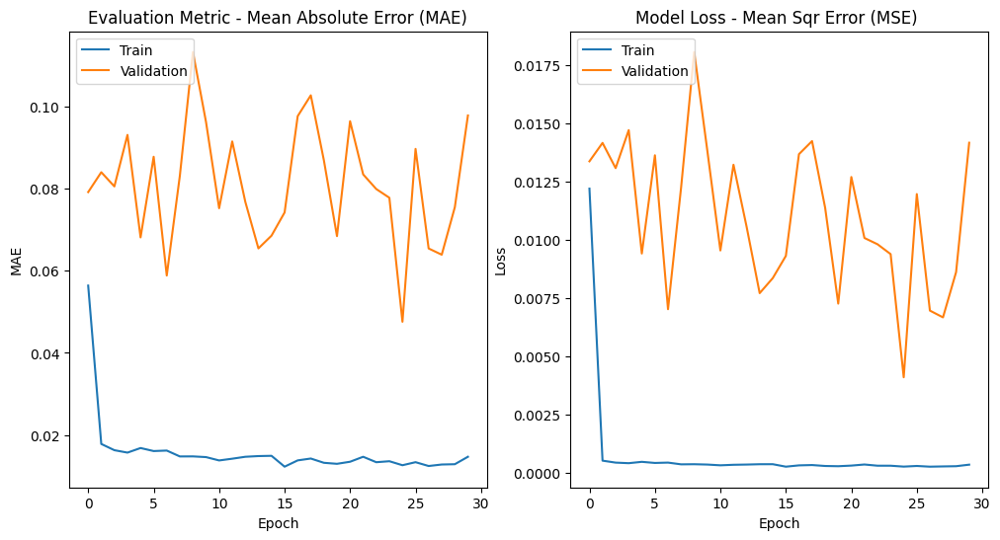

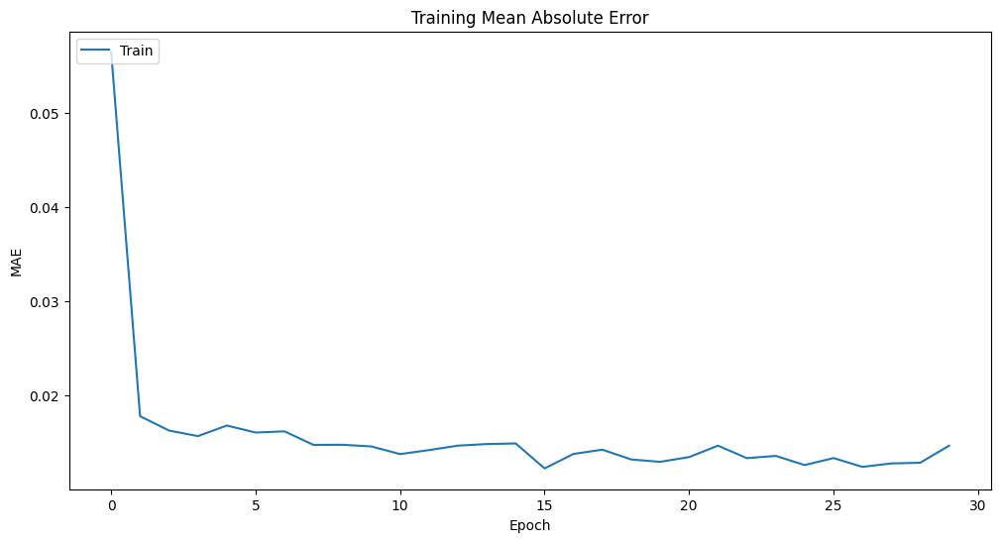

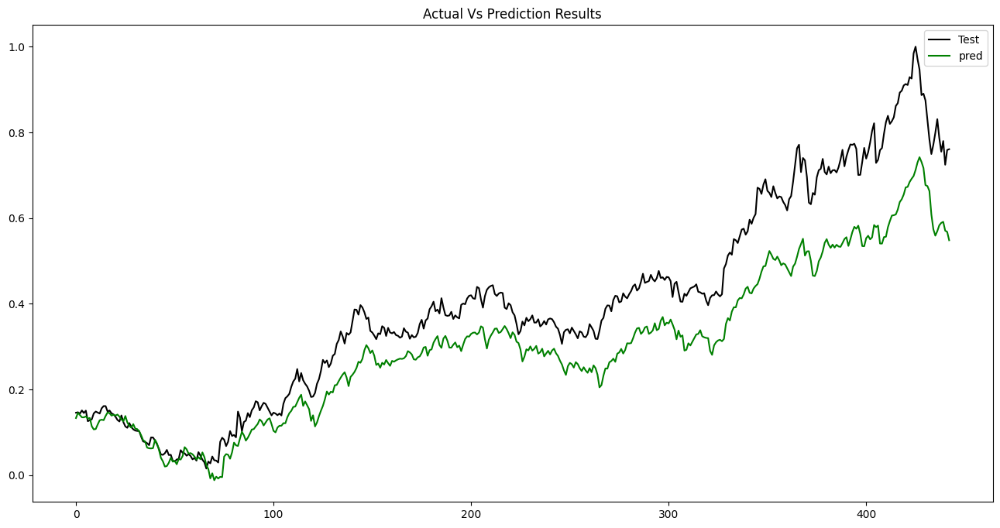

############################################################################
  Model Setup:
                    Name: XOM_F100_L30
             LSTM_Layers: 30
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 100
  Result Data:
             mean_abs_err =0.0728025427384455
             mean_sqr_err =0.007645037940117973
        root_mean_sqr_err =0.08743590761305091
           pred_diff_mean =0.7737450686765209
      pred_diff_bias_mean =0.2262549313234791
    pred_correctness_mean =0.8633257403189066



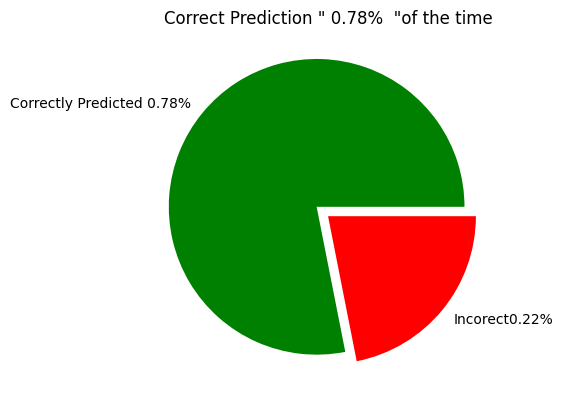

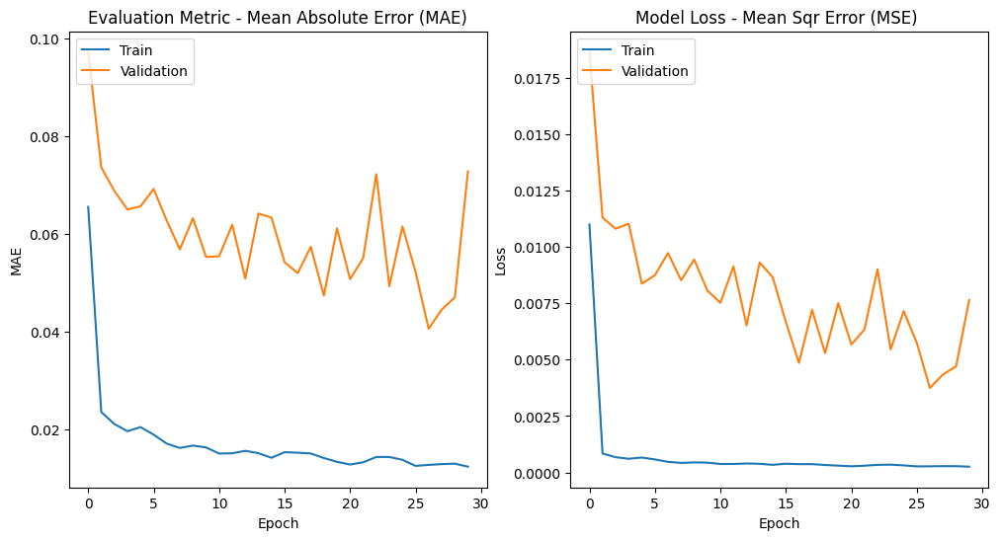

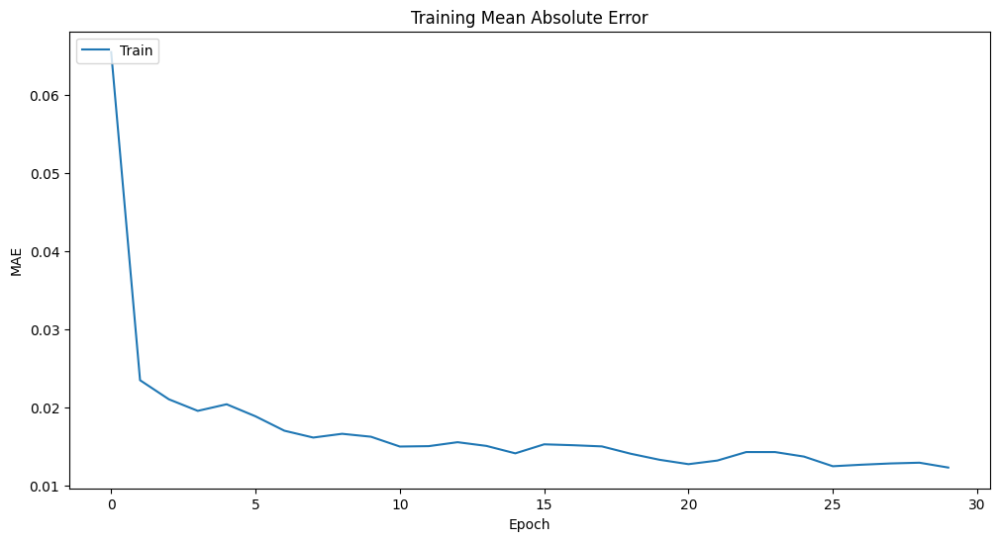

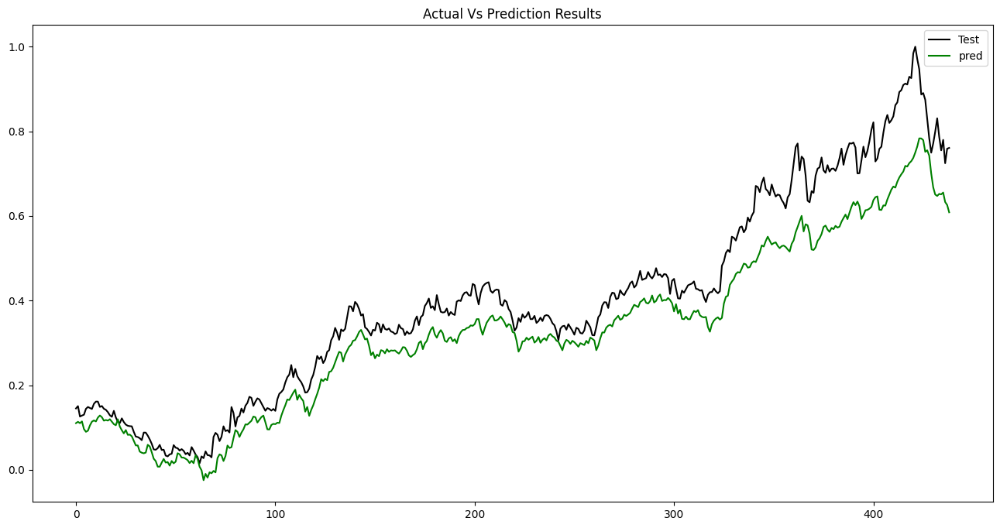

############################################################################
  Model Setup:
                    Name: XOM_F100_L50
             LSTM_Layers: 50
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 100
  Result Data:
             mean_abs_err =0.06900789909965038
             mean_sqr_err =0.008212121450658909
        root_mean_sqr_err =0.09062075618013188
           pred_diff_mean =0.8915421184063225
      pred_diff_bias_mean =0.1084578815936775
    pred_correctness_mean =0.8838268792710706



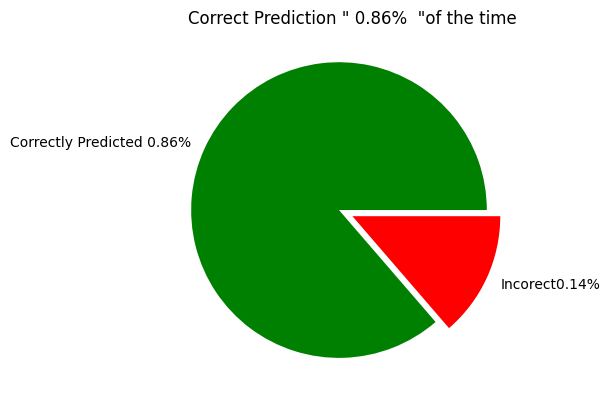

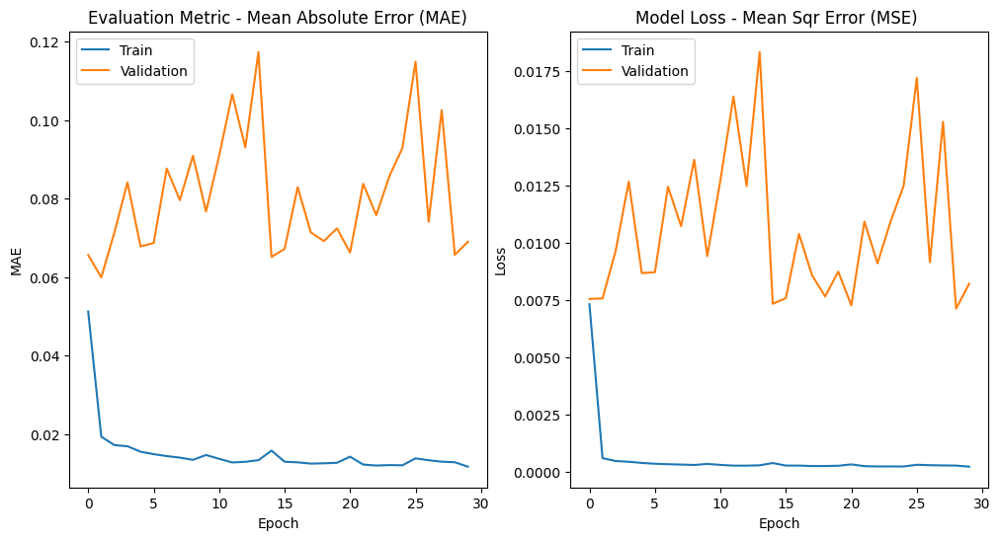

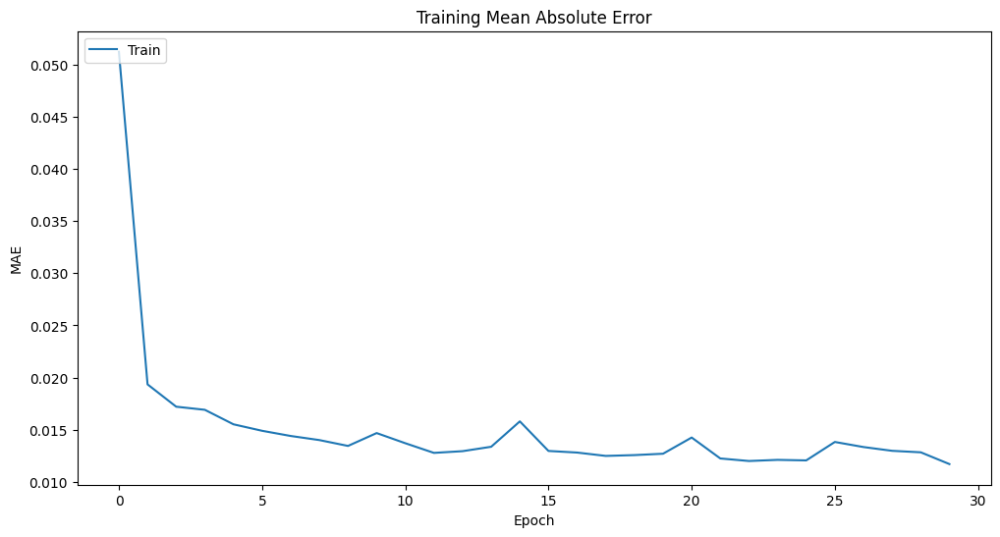

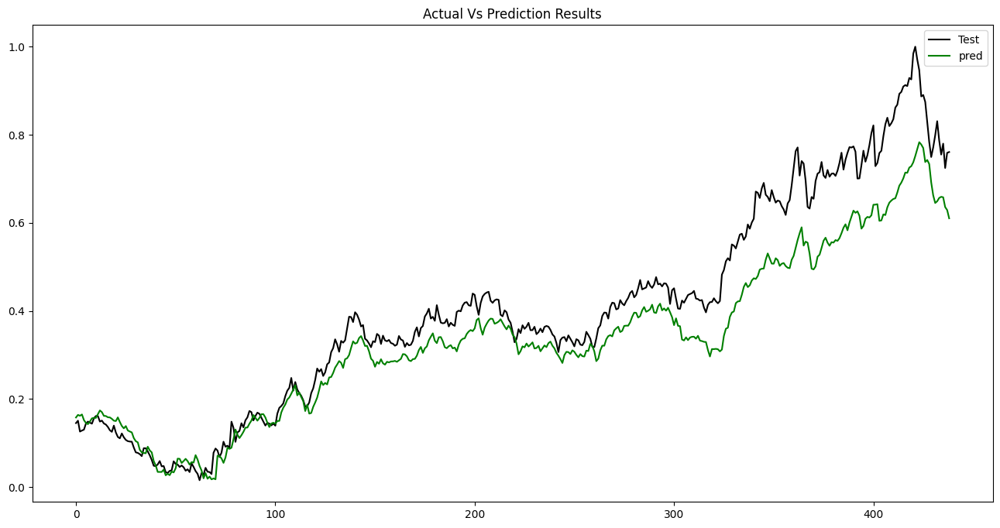

############################################################################
  Model Setup:
                    Name: XOM_F100_L150
             LSTM_Layers: 150
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 100
  Result Data:
             mean_abs_err =0.0905958822788898
             mean_sqr_err =0.011015512543551199
        root_mean_sqr_err =0.10495481191232348
           pred_diff_mean =0.7393457108988184
      pred_diff_bias_mean =0.2606542891011815
    pred_correctness_mean =0.806378132118451



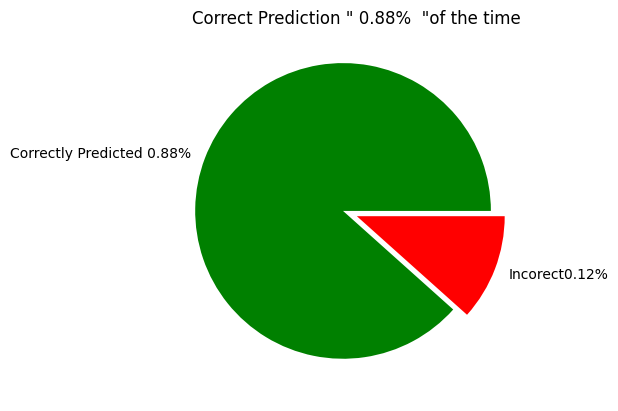

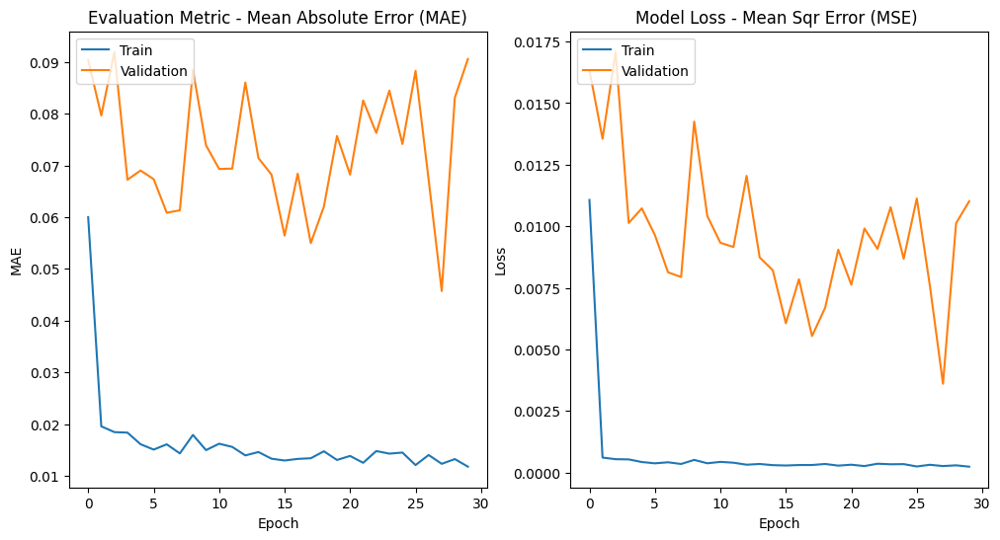

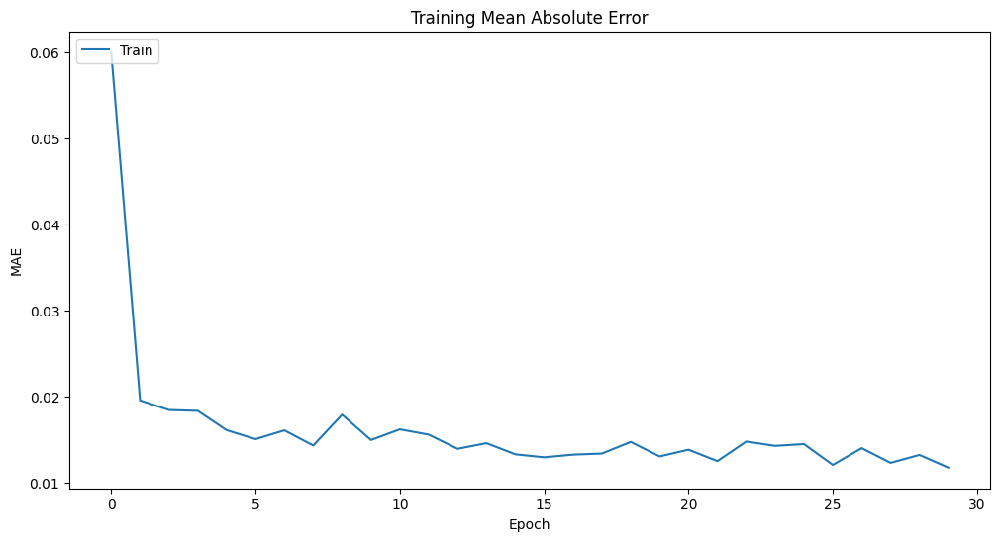

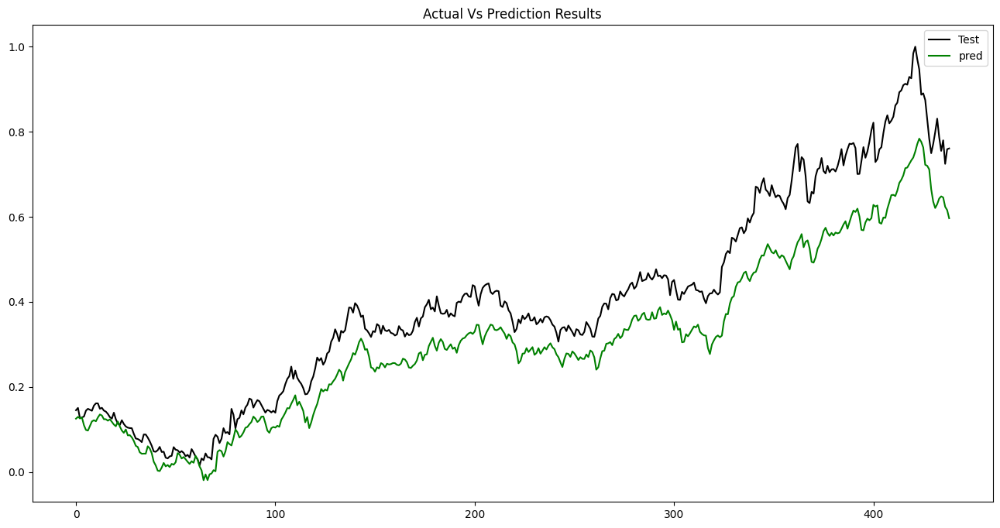

############################################################################
  Model Setup:
                    Name: XOM_F100_L250
             LSTM_Layers: 250
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 100
  Result Data:
             mean_abs_err =0.07207896329090109
             mean_sqr_err =0.00782512266095118
        root_mean_sqr_err =0.0884597233827417
           pred_diff_mean =0.8247541340190317
      pred_diff_bias_mean =0.17524586598096836
    pred_correctness_mean =0.856492027334852



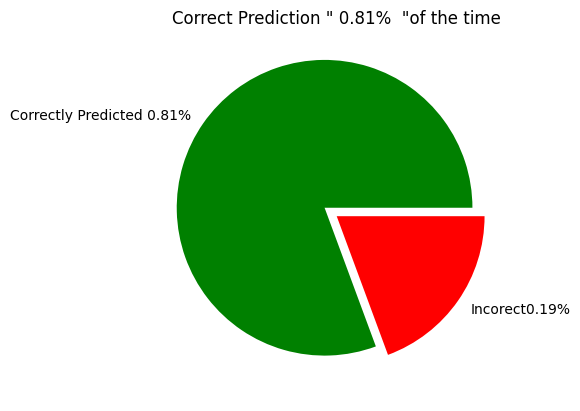

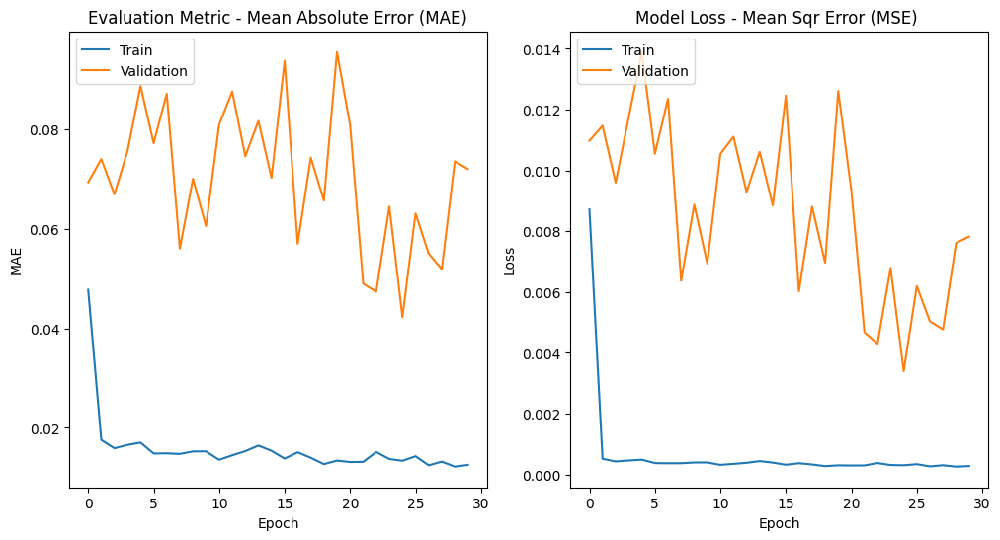

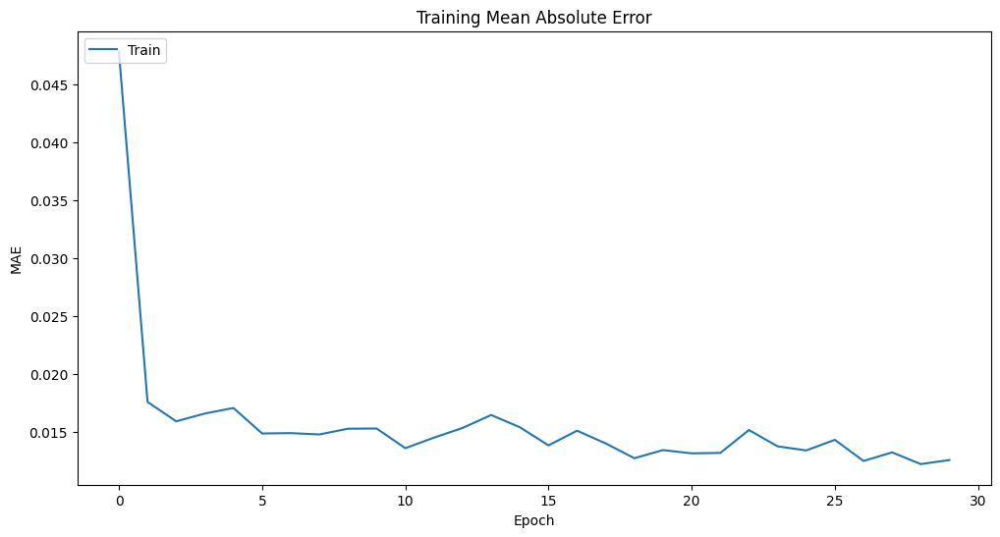

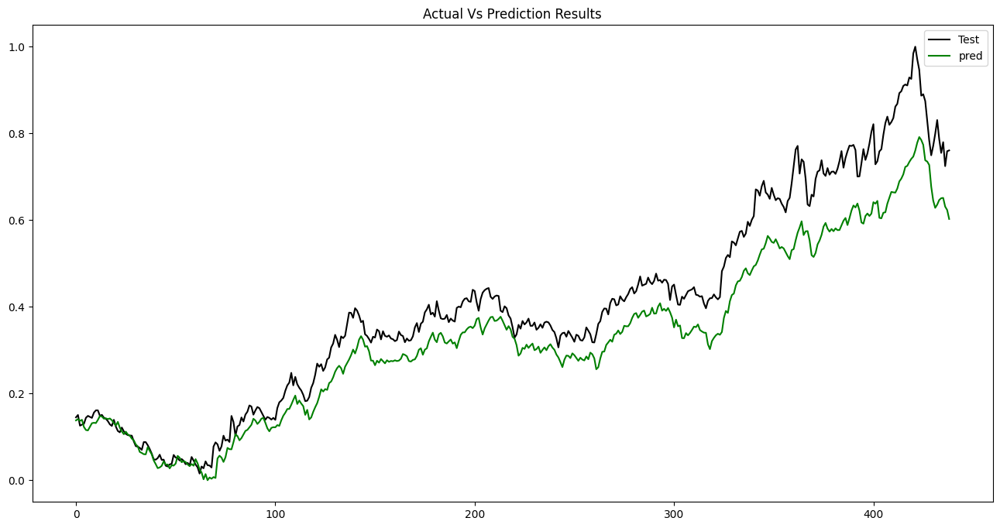

############################################################################
  Model Setup:
                    Name: XOM_F100_L350
             LSTM_Layers: 350
               Bach_Size: 15
                  Epochs: 30
  Data Setup:
                  Ticker: XOM
             Indicattors: ^DJI,^BSESN,^BVSP
              Start_Date: 2012-03-11
                End_Date: 2022-07-10
              Frame_Days: 100
  Result Data:
             mean_abs_err =0.04346294464950477
             mean_sqr_err =0.0037471867883780547
        root_mean_sqr_err =0.061214269483332515
           pred_diff_mean =1.0091727893760625
      pred_diff_bias_mean =-0.009172789376062453
    pred_correctness_mean =0.9453302961275627



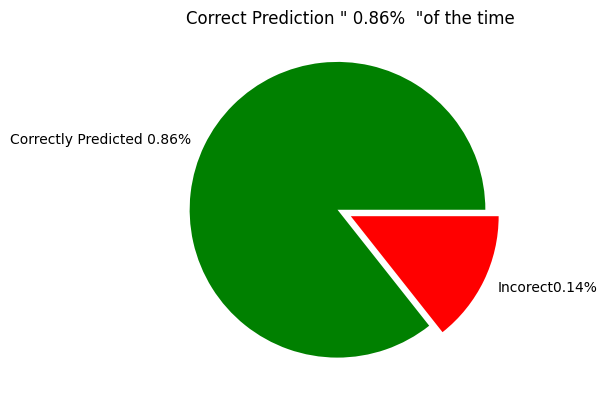

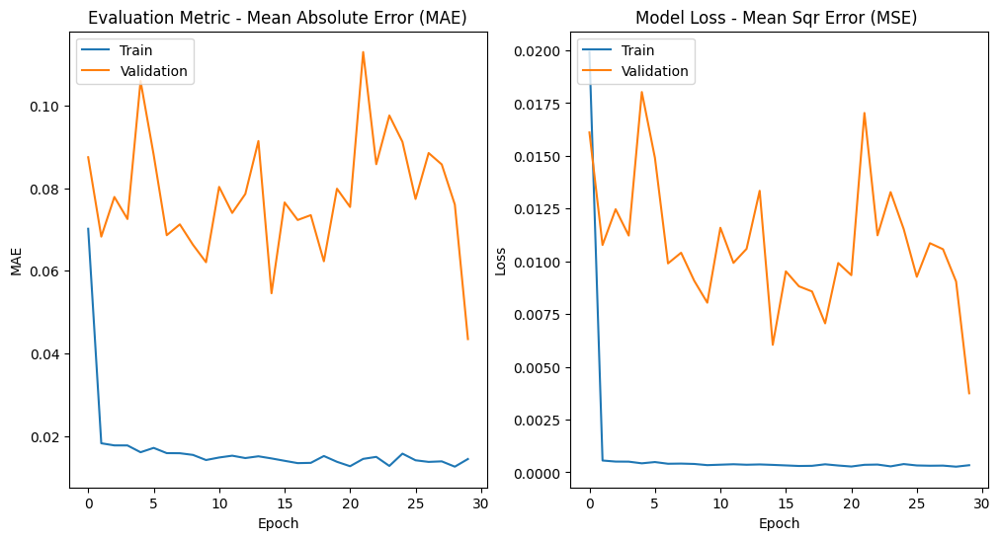

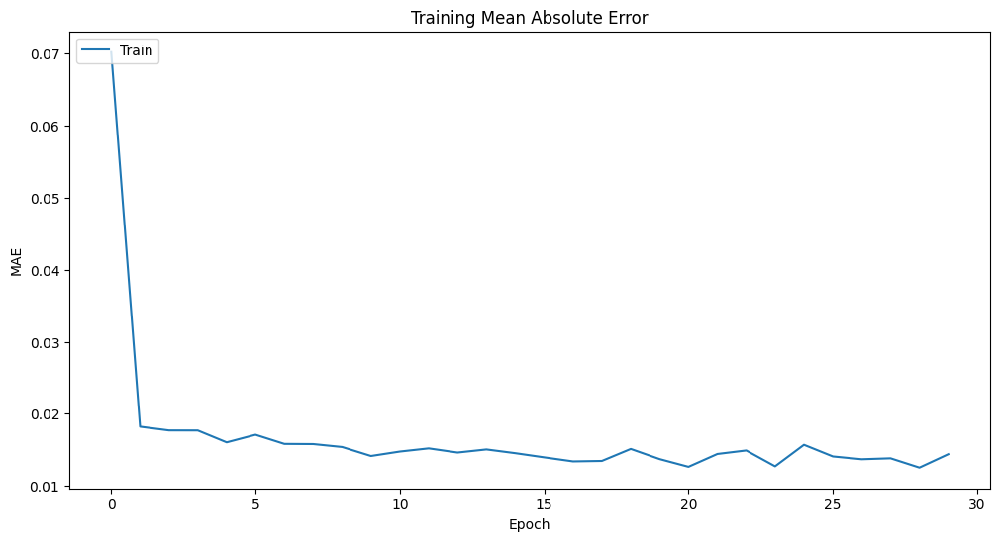

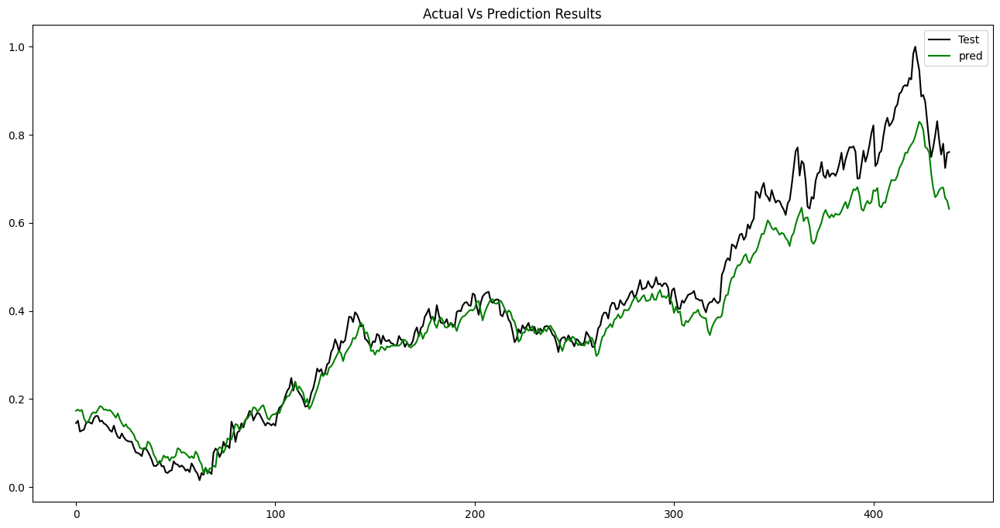

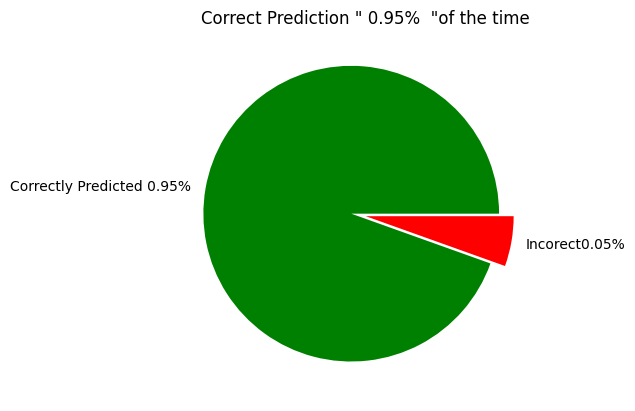

In [10]:
for m in model_list:
  m.View_Performance_Report(show_graphs=True)


#Save Data
##Save Data to Drive

In [11]:
#ls '/content/drive/MyDrive/Classes/Kent/Machine Learning/Results'

ADM_Results.csv  MSI__Results.csv


In [12]:

#Save Data
import csv

# Specify the CSV file name
filename = '/content/drive/MyDrive/Classes/Kent/Machine Learning/Results/XOM_Results.csv'

# Field names in the CSV file
fields = ['ModelName','Layers','Batch_Size', 'Epoch','Ticker','Indicattors','Frame_Days','mean_abs_err','mean_sqr_err','root_mean_sqr_err','pred_diff_mean','pred_diff_bias_mean',"elapsTime"]

# Writing to the csv file
with open(filename, mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=fields)

    # Writing headers (field names)
    writer.writeheader()

    # Writing data of each object
    for m in model_list:
        writer.writerow({'ModelName': m.name, 'Layers': m.lstm_layers, 'Batch_Size': m.batch_size, 'Epoch':m.epochs,
                         'Ticker':m.ticker,'Indicattors':m.indicators,'Frame_Days':m.frame_days,'mean_abs_err':m.mean_abs_err,
                         'mean_sqr_err':m.mean_sqr_err,'root_mean_sqr_err':m.root_mean_sqr_err,'pred_diff_mean':m.pred_diff_mean,
                         'pred_diff_bias_mean':m.pred_diff_bias_mean,"elapsTime":m.fitting_elapse_time   })


# Get Fields








##Save Best Model to drive

In [13]:
Best_Model = max(model_list, key=lambda m:m.pred_diff_mean)

print(f"Best Model is {Best_Model.name} with {Best_Model.pred_diff_mean:.2f}%  !!!")

Best Model is XOM_F70_L150 with 1.07%  !!!
